# Linear Regression (Ising)

## Learning Goal
Let us now apply linear regression to an example that is familiar from Statistical Mechanics: the Ising model. The goal of this notebook is to revisit the concepts of in-sample and out-of-sample errors, as well as $L2$- and $L1$-regularization, in an example that is more intuitive to physicists.

## Overview
Consider the 1D Ising model with nearest-neighbor interactions

$$H[\boldsymbol{S}]=-J\sum_{j=1}^L S_{j}S_{j+1}$$

on a chain of length $L$ with periodic boundary conditions and $S_j=\pm 1$ Ising spin variables. In one dimension, this paradigmatic model has no phase transition at finite temperature.


### Exercises (optional): ###  
If you are unfamiliar with the property of the Ising model, please think about the following problems, you can consult many textbooks on the subject (see for instance <a href="https://www.amazon.com/Lectures-Transitions-Renormalization-Frontiers-Physics/dp/0201554097">Goldenfeld</a>, <a href="https://www.google.com/search?q=lubensky+condensed+matter+physics&rlz=1C5CHFA_enCA776CA776&oq=lubensky+&aqs=chrome.2.69i57j0l5.3047j1j7&sourceid=chrome&ie=UTF-8">Lubensky</a>, <a href="https://physics.anu.edu.au/theophys/baxter_book.php">Baxter </a>, etc.).
<ul>
<li> Compute the partition function of the Ising model in one dimension at inverse temperature $\beta$ when $L\rightarrow\infty$ (thermodynamic limit):
    $$Z=\sum_S \exp(-\beta H[S]).$$
Here the sum is carried over all $2^L$ spin configurations.
<li> Compute the model's magnetization $M=\langle\sum_i S_i\rangle$ in the same limit ($L\rightarrow\infty$). The expectation is taken with respect to the Boltzmann distribution:
    $$p(S)=\frac{\exp(-\beta H[S])}{Z}$$
<li> How does $M$ behave as a function of the temperature $T=\beta^{-1}$?
</ul>


### Learning the Ising model ###

Suppose we set $J=1$, drew a large number of spin configurations, and computed their Ising energies. Then you are handed a data set of $i=1\ldots n$ points of the form $\{(H[\boldsymbol{S}^i],\boldsymbol{S}^i)\}$ without being told you about above Hamiltonian. Your task is to learn the Hamiltonian using Linear regression techniques.

In [1]:
import numpy as np
import scipy.sparse as sp
np.random.seed(12)


import warnings
# Comment this to turn on warnings
warnings.filterwarnings('ignore')

### define Ising model aprams
# system size
L=40

# create 10000 random Ising states
states=np.random.choice([-1, 1], size=(40000,L))
print(states)
def ising_energies(states):
    """
    This function calculates the energies of the states in the nn Ising Hamiltonian
    """
    L = states.shape[1]
    J = np.zeros((L, L),)
    print("J: ", J)
    print("L: ", L)
    for i in range(L):
        J[i,(i+1)%L]=-1.0 # interaction between nearest-neighbors

    # compute energies
    print("J: ", J)
    E = np.einsum('...i,ij,...j->...',states,J,states)

    return E
# calculate Ising energies
energies=ising_energies(states)
print(energies)


[[ 1  1 -1 ... -1 -1 -1]
 [-1 -1  1 ... -1 -1 -1]
 [-1  1  1 ... -1 -1  1]
 ...
 [-1  1  1 ...  1 -1  1]
 [-1  1  1 ... -1 -1 -1]
 [-1  1 -1 ... -1 -1  1]]
J:  [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
L:  40
J:  [[ 0. -1.  0. ...  0.  0.  0.]
 [ 0.  0. -1. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0.  0.]
 ...
 [ 0.  0.  0. ...  0. -1.  0.]
 [ 0.  0.  0. ...  0.  0. -1.]
 [-1.  0.  0. ...  0.  0.  0.]]
[  4. -12.   4. ...   4.   0.   0.]


## Recasting the problem as a Linear Regression
First of all, we have to decide on a model class (possible Hamiltonians) we use to fit the data. In the absence of any prior knowledge, one sensible choice is the all-to-all Ising model

$$
H_\mathrm{model}[\boldsymbol{S}^i] = - \sum_{j=1}^L \sum_{k=1}^L J_{j,k}S_{j}^iS_{k}^i.
$$
Notice that this model is uniquely defined by the non-local coupling strengths $J_{jk}$ which we want to learn. Importantly, this model is linear in ${\mathbf J}$ which makes it possible to use linear regression.

To apply linear regression, we would like to recast this model in the form
$$
H_\mathrm{model}^i \equiv \mathbf{X}^i \cdot \mathbf{J},
$$

where the vectors $\mathbf{X}^i$ represent all two-body interactions $\{S_{j}^iS_{k}^i \}_{j,k=1}^L$, and the index $i$ runs over the samples in the data set. To make the analogy complete, we can also represent the dot product by a single index $p = \{j,k\}$, i.e. $\mathbf{X}^i \cdot \mathbf{J}=X^i_pJ_p$. Note that the regression model does not include the minus sign, so we expect to learn negative $J$'s.

In [2]:
# reshape Ising states into RL samples: S_iS_j --> X_p
states=np.einsum('...i,...j->...ij', states, states)
shape=states.shape
states=states.reshape((shape[0],shape[1]*shape[2]))
print(states.shape)
# build final data set
Data=[states,energies]
print(Data)

(40000, 1600)
[array([[ 1,  1, -1, ...,  1,  1,  1],
       [ 1,  1, -1, ...,  1,  1,  1],
       [ 1, -1, -1, ..., -1, -1,  1],
       ...,
       [ 1, -1, -1, ...,  1, -1,  1],
       [ 1, -1, -1, ...,  1,  1,  1],
       [ 1, -1,  1, ..., -1, -1,  1]]), array([  4., -12.,   4., ...,   4.,   0.,   0.])]


## Numerical Experiments

As we already mentioned a few times in the review, learning is not fitting: the subtle difference is that once we fit the data to obtain a candidate model, we expect it to generalize to unseen data not used for the fitting procedure. For this reason, we begin by specifying a training and test data sets

In [3]:
# define number of samples
n_samples=400
# define train and test data sets
X_train=Data[0][:n_samples]
Y_train=Data[1][:n_samples] #+ np.random.normal(0,4.0,size=X_train.shape[0])
X_test=Data[0][n_samples:3*n_samples//2]
Y_test=Data[1][n_samples:3*n_samples//2] #+ np.random.normal(0,4.0,size=X_test.shape[0])
print(X_test[0])
print(X_test)
print(X_train)
print(len(X_test[0]))
print(len(X_test))
print(len(X_train))
print(len(Data[0]))

[ 1  1  1 ...  1 -1  1]
[[ 1  1  1 ...  1 -1  1]
 [ 1  1  1 ... -1 -1  1]
 [ 1 -1 -1 ... -1  1  1]
 ...
 [ 1 -1  1 ... -1 -1  1]
 [ 1 -1  1 ... -1 -1  1]
 [ 1  1  1 ...  1 -1  1]]
[[ 1  1 -1 ...  1  1  1]
 [ 1  1 -1 ...  1  1  1]
 [ 1 -1 -1 ... -1 -1  1]
 ...
 [ 1 -1  1 ... -1  1  1]
 [ 1 -1  1 ... -1  1  1]
 [ 1  1  1 ...  1 -1  1]]
1600
200
400
40000


# Evaluating the performance:  coefficient of determination $R^2$

In what follows the model performance (in-sample and out-of-sample) is evaluated using the so-called coefficient of determination, which is given by:
\begin{align}
R^2 &= \left(1-\frac{u}{v}\right),\\
u&=(y_{pred}-y_{true})^2\\
v&=(y_{true}-\langle y_{true}\rangle)^2
\end{align}

The best possible score is 1.0 but it can also be negative. A constant model that always predicts the expected value of $y$, $\langle y_{true}\rangle$, disregarding the input features, would get a $R^2$ score of 0.

## Applying OLS, Ridge regression and LASSO:

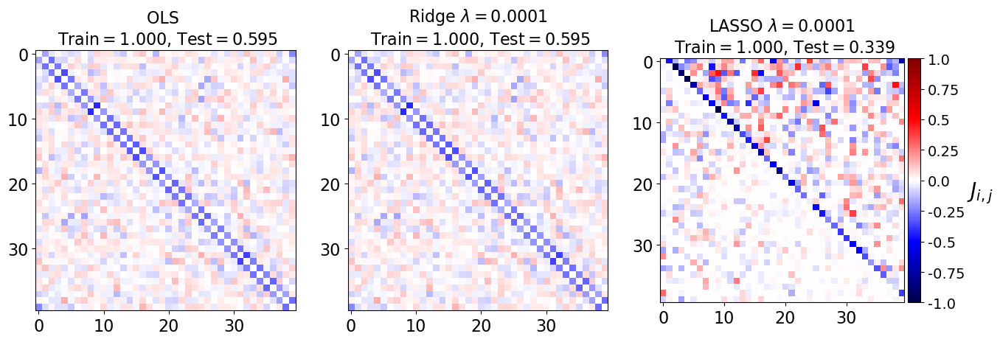

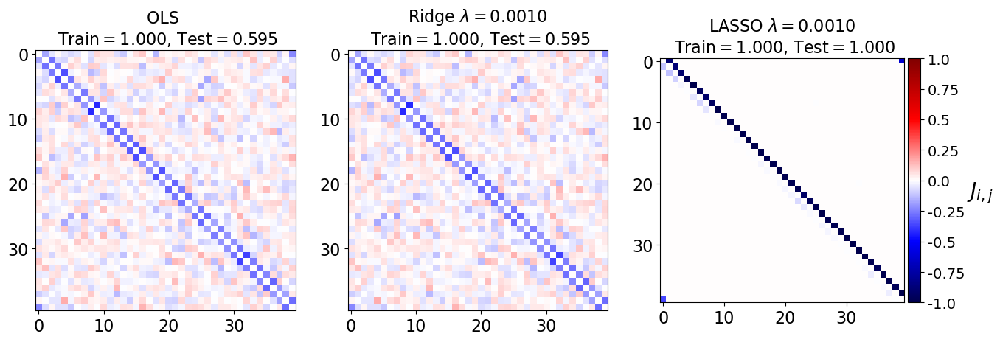

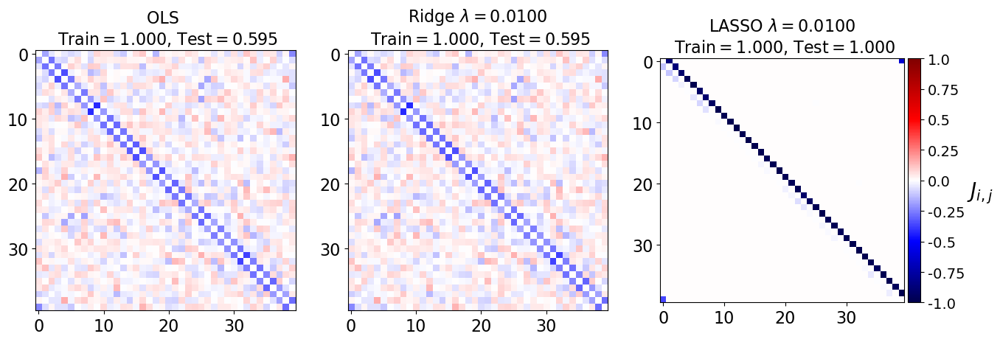

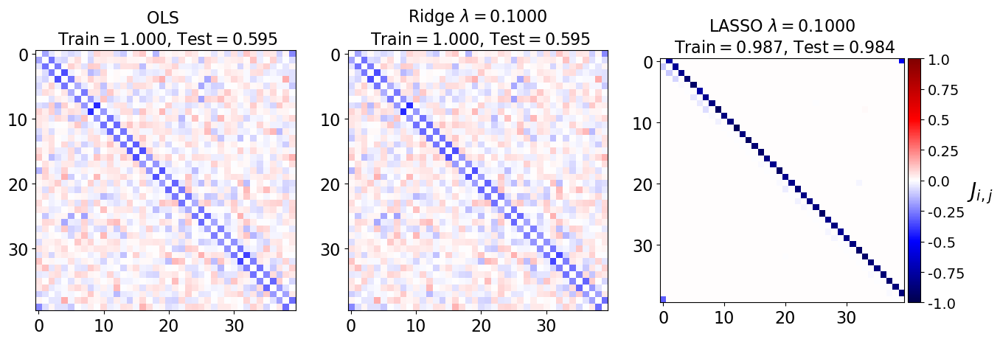

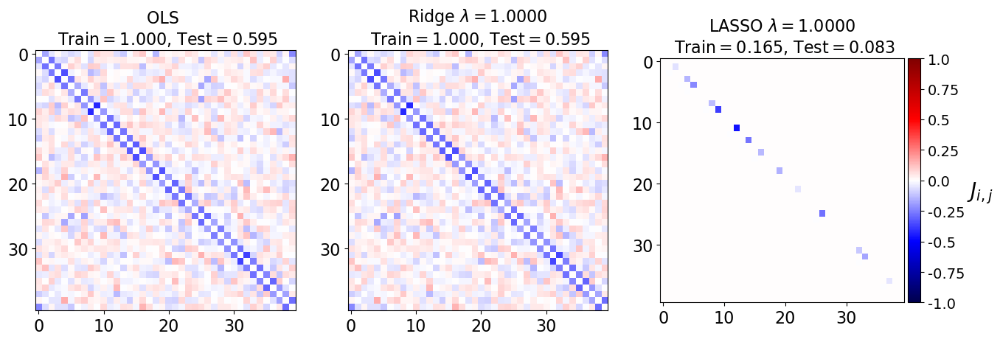

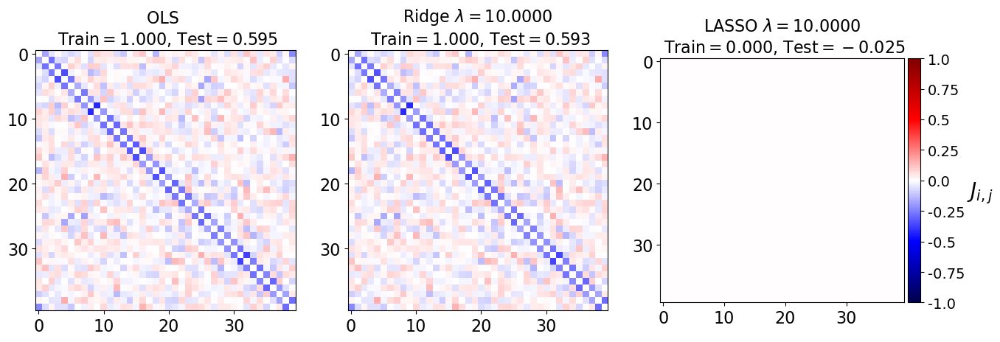

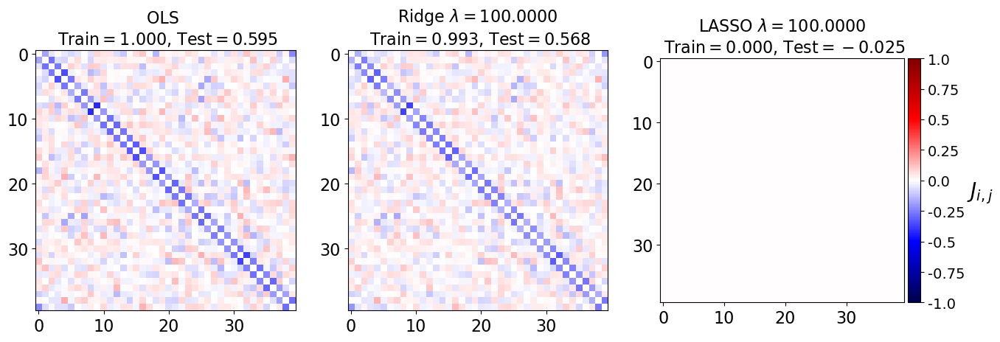

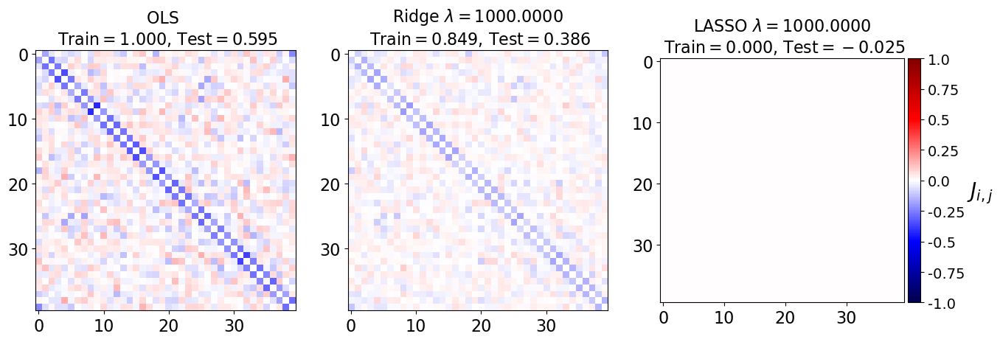

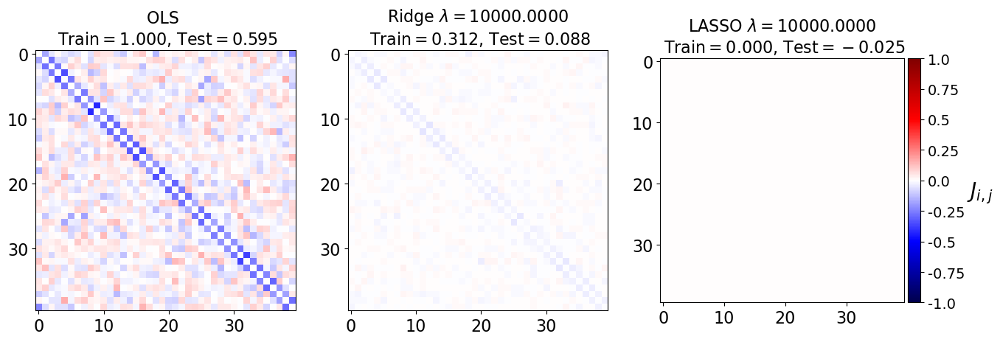

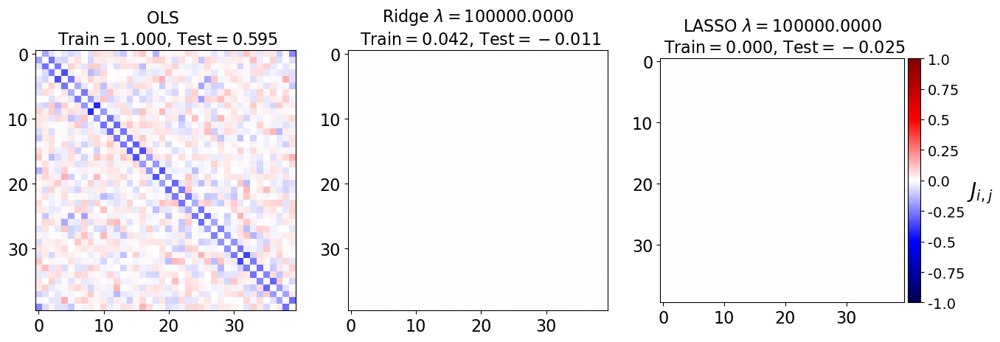

In [4]:
from sklearn import linear_model
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn
%matplotlib inline

# set up Lasso and Ridge Regression models
leastsq=linear_model.LinearRegression()
ridge=linear_model.Ridge()
lasso = linear_model.Lasso()

# define error lists
train_errors_leastsq = []
test_errors_leastsq = []

train_errors_ridge = []
test_errors_ridge = []

train_errors_lasso = []
test_errors_lasso = []

# set regularisation strength values
lmbdas = np.logspace(-4, 5, 10)

#Initialize coeffficients for ridge regression and Lasso
coefs_leastsq = []
coefs_ridge = []
coefs_lasso=[]

for lmbda in lmbdas:

    ### ordinary least squares
    leastsq.fit(X_train, Y_train) # fit model
    coefs_leastsq.append(leastsq.coef_) # store weights
    # use the coefficient of determination R^2 as the performance of prediction.
    train_errors_leastsq.append(leastsq.score(X_train, Y_train))
    test_errors_leastsq.append(leastsq.score(X_test,Y_test))

    ### apply RIDGE regression
    ridge.set_params(alpha=lmbda) # set regularisation parameter
    ridge.fit(X_train, Y_train) # fit model
    coefs_ridge.append(ridge.coef_) # store weights
    # use the coefficient of determination R^2 as the performance of prediction.
    train_errors_ridge.append(ridge.score(X_train, Y_train))
    test_errors_ridge.append(ridge.score(X_test,Y_test))

    ### apply LASSO regression
    lasso.set_params(alpha=lmbda) # set regularisation parameter
    lasso.fit(X_train, Y_train) # fit model
    coefs_lasso.append(lasso.coef_) # store weights
    # use the coefficient of determination R^2 as the performance of prediction.
    train_errors_lasso.append(lasso.score(X_train, Y_train))
    test_errors_lasso.append(lasso.score(X_test,Y_test))

    ### plot Ising interaction J
    J_leastsq=np.array(leastsq.coef_).reshape((L,L))
    J_ridge=np.array(ridge.coef_).reshape((L,L))
    J_lasso=np.array(lasso.coef_).reshape((L,L))

    cmap_args=dict(vmin=-1., vmax=1., cmap='seismic')

    fig, axarr = plt.subplots(nrows=1, ncols=3)

    axarr[0].imshow(J_leastsq,**cmap_args)
    axarr[0].set_title('OLS \n Train$=%.3f$, Test$=%.3f$'%(train_errors_leastsq[-1], test_errors_leastsq[-1]),fontsize=16)
    axarr[0].tick_params(labelsize=16)

    axarr[1].imshow(J_ridge,**cmap_args)
    axarr[1].set_title('Ridge $\lambda=%.4f$\n Train$=%.3f$, Test$=%.3f$' %(lmbda,train_errors_ridge[-1],test_errors_ridge[-1]),fontsize=16)
    axarr[1].tick_params(labelsize=16)

    im=axarr[2].imshow(J_lasso,**cmap_args)
    axarr[2].set_title('LASSO $\lambda=%.4f$\n Train$=%.3f$, Test$=%.3f$' %(lmbda,train_errors_lasso[-1],test_errors_lasso[-1]),fontsize=16)
    axarr[2].tick_params(labelsize=16)

    divider = make_axes_locatable(axarr[2])
    cax = divider.append_axes("right", size="5%", pad=0.05, add_to_figure=True)
    cbar=fig.colorbar(im, cax=cax)

    cbar.ax.set_yticklabels(np.arange(-1.0, 1.0+0.25, 0.25),fontsize=14)
    cbar.set_label('$J_{i,j}$',labelpad=15, y=0.5,fontsize=20,rotation=0)

    fig.subplots_adjust(right=2.0)

    plt.show()

To quantify learning, we also plot the in-sample and out-of-sample errors

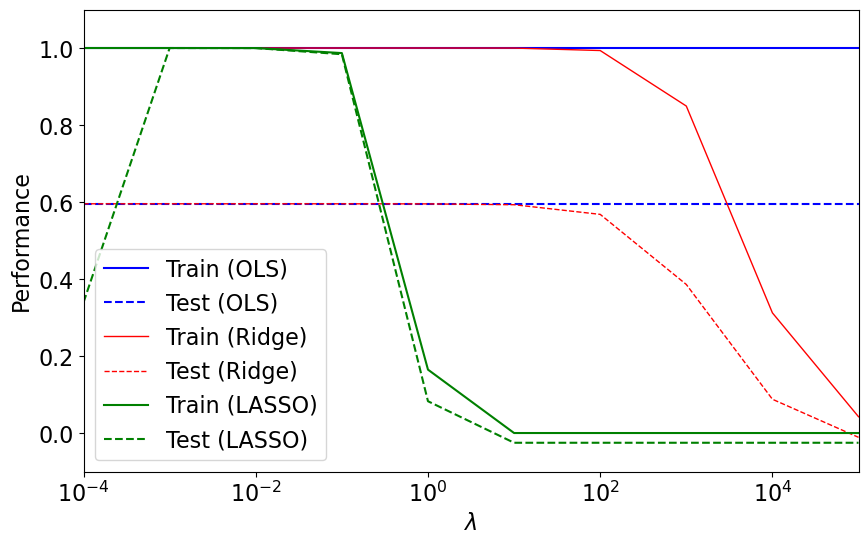

In [5]:
# Plot our performance on both the training and test data
plt.semilogx(lmbdas, train_errors_leastsq, 'b',label='Train (OLS)')
plt.semilogx(lmbdas, test_errors_leastsq,'--b',label='Test (OLS)')
plt.semilogx(lmbdas, train_errors_ridge,'r',label='Train (Ridge)',linewidth=1)
plt.semilogx(lmbdas, test_errors_ridge,'--r',label='Test (Ridge)',linewidth=1)
plt.semilogx(lmbdas, train_errors_lasso, 'g',label='Train (LASSO)')
plt.semilogx(lmbdas, test_errors_lasso, '--g',label='Test (LASSO)')

fig = plt.gcf()
fig.set_size_inches(10.0, 6.0)

#plt.vlines(alpha_optim, plt.ylim()[0], np.max(test_errors), color='k',
#           linewidth=3, label='Optimum on test')
plt.legend(loc='lower left',fontsize=16)
plt.ylim([-0.1, 1.1])
plt.xlim([min(lmbdas), max(lmbdas)])
plt.xlabel(r'$\lambda$',fontsize=16)
plt.ylabel('Performance',fontsize=16)
plt.tick_params(labelsize=16)
plt.show()

## Understanding the results

Let us make a few remarks:

(i) the inverse (see [Scikit documentation](http://scikit-learn.org/stable/modules/classes.html#module-sklearn.linear_model)) regularization parameter $\lambda$ affects the Ridge and LASSO regressions at scales, separated by a few orders of magnitude. It is considered good practice to always check the performance for the given model and data with $\lambda$ over multiple decades.

(ii) at $\lambda\to 0$ and $\lambda\to\infty$, all three models overfit the data, as can be seen from the deviation of the test errors from unity (dashed lines), while the training curves stay at unity.

(iii) While the OLS and Ridge regression test curves are monotonic, the LASSO test curve is not -- suggesting the optimal LASSO regularization parameter is $\lambda\approx 10^{-2}$. At this sweet spot, the Ising interaction weights ${\bf J}$ contain only nearest-neighbor terms (as did the model the data was generated from).

__Gauge degrees of freedom__: recall that the uniform nearest-neighbor interactions strength $J_{j,k}=J$ which we used to generate the data was set to unity, $J=1$. Moreover, $J_{j,k}$ was NOT defined to be symmetric (we only used the $J_{j,j+1}$ but never the $J_{j,j-1}$ elements). The colorbar on the matrix elements plot above suggest that the OLS and Ridge regression learn uniform symmetric weights $J=-0.5$. There is no mystery since this amounts to taking into account both the $J_{j,j+1}$ and the $J_{j,j-1}$ terms, and the weights are distributed symmetrically between them. LASSO, on the other hand, can break this symmetry (see matrix elements plots for $\lambda=0.001$ and $\lambda=0.01$). Thus, we see how different regularization schemes can lead to learning equivalent models but in different gauges. Any information we have about the symmetry of the unknown model that generated the data has to be reflected in the definition of the model and the regularization chosen.

### Exercises: ###  
 Explore the interplay between training sample size, noise and regularization: Plot the 2D histogram of the distribution of the components of ${\bf J}$, similarly to the example above, at different values of the number of training sample (one can go up to $2\times 10^4$) (also consider making a 1D distribution of the value of all the components of trained J matrix. Make separate or overlayed plots of three types of regressions and varying training sampe size). How do the matrix elements plots above change? What happens with the sampling noise as the number of samples is increased/decreased for the three types of regression considered? Explain your observation from variance vs bias perspective.



## functions

In [6]:
from sklearn import linear_model
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn
%matplotlib inline

In [7]:
def train(X_train,Y_train, X_test, Y_test):
    # set up Lasso and Ridge Regression models
    leastsq=linear_model.LinearRegression()
    ridge=linear_model.Ridge()
    lasso = linear_model.Lasso()
    
    # define error lists
    train_errors_leastsq = []
    test_errors_leastsq = []
    
    train_errors_ridge = []
    test_errors_ridge = []
    
    train_errors_lasso = []
    test_errors_lasso = []
    
    # set regularisation strength values
    lmbdas = np.logspace(-4, 5, 10)
    
    #Initialize coeffficients for ridge regression and Lasso
    coefs_leastsq = []
    coefs_ridge = []
    coefs_lasso=[]
    
    for lmbda in lmbdas:
    
        ### ordinary least squares
        leastsq.fit(X_train, Y_train) # fit model
        coefs_leastsq.append(leastsq.coef_) # store weights
        # use the coefficient of determination R^2 as the performance of prediction.
        train_errors_leastsq.append(leastsq.score(X_train, Y_train))
        test_errors_leastsq.append(leastsq.score(X_test,Y_test))
    
        ### apply RIDGE regression
        ridge.set_params(alpha=lmbda) # set regularisation parameter
        ridge.fit(X_train, Y_train) # fit model
        coefs_ridge.append(ridge.coef_) # store weights
        # use the coefficient of determination R^2 as the performance of prediction.
        train_errors_ridge.append(ridge.score(X_train, Y_train))
        test_errors_ridge.append(ridge.score(X_test,Y_test))
    
        ### apply LASSO regression
        lasso.set_params(alpha=lmbda) # set regularisation parameter
        lasso.fit(X_train, Y_train) # fit model
        coefs_lasso.append(lasso.coef_) # store weights
        # use the coefficient of determination R^2 as the performance of prediction.
        train_errors_lasso.append(lasso.score(X_train, Y_train))
        test_errors_lasso.append(lasso.score(X_test,Y_test))
    
        ### plot Ising interaction J
        J_leastsq=np.array(leastsq.coef_).reshape((L,L))
        J_ridge=np.array(ridge.coef_).reshape((L,L))
        J_lasso=np.array(lasso.coef_).reshape((L,L))
    
        cmap_args=dict(vmin=-1., vmax=1., cmap='seismic')
    
        fig, axarr = plt.subplots(nrows=1, ncols=3)
    
        axarr[0].imshow(J_leastsq,**cmap_args)
        axarr[0].set_title('OLS \n Train$=%.3f$, Test$=%.3f$'%(train_errors_leastsq[-1], test_errors_leastsq[-1]),fontsize=16)
        axarr[0].tick_params(labelsize=16)
    
        axarr[1].imshow(J_ridge,**cmap_args)
        axarr[1].set_title('Ridge $\lambda=%.4f$\n Train$=%.3f$, Test$=%.3f$' %(lmbda,train_errors_ridge[-1],test_errors_ridge[-1]),fontsize=16)
        axarr[1].tick_params(labelsize=16)
    
        im=axarr[2].imshow(J_lasso,**cmap_args)
        axarr[2].set_title('LASSO $\lambda=%.4f$\n Train$=%.3f$, Test$=%.3f$' %(lmbda,train_errors_lasso[-1],test_errors_lasso[-1]),fontsize=16)
        axarr[2].tick_params(labelsize=16)
    
        divider = make_axes_locatable(axarr[2])
        cax = divider.append_axes("right", size="5%", pad=0.05, add_to_figure=True)
        cbar=fig.colorbar(im, cax=cax)
    
        cbar.ax.set_yticklabels(np.arange(-1.0, 1.0+0.25, 0.25),fontsize=14)
        cbar.set_label('$J_{i,j}$',labelpad=15, y=0.5,fontsize=20,rotation=0)
    
        fig.subplots_adjust(right=2.0)
    
        plt.show()
        # Plot our performance on both the training and test data
        # plt.close()
    return lmbdas,train_errors_leastsq, test_errors_leastsq, train_errors_ridge, test_errors_ridge, train_errors_lasso, test_errors_lasso, J_leastsq, J_ridge, J_lasso

def J_distibution_1D(X_train,Y_train, X_test, Y_test):
    # set up Lasso and Ridge Regression models
    leastsq=linear_model.LinearRegression()
    ridge=linear_model.Ridge()
    lasso = linear_model.Lasso()
    
    # define error lists
    train_errors_leastsq = []
    test_errors_leastsq = []
    
    train_errors_ridge = []
    test_errors_ridge = []
    
    train_errors_lasso = []
    test_errors_lasso = []
    
    # set regularisation strength values
    lmbdas = np.logspace(-4, 5, 10)
    
    #Initialize coeffficients for ridge regression and Lasso
    coefs_leastsq = []
    coefs_ridge = []
    coefs_lasso=[]
    
    for lmbda in lmbdas:
    
        ### ordinary least squares
        leastsq.fit(X_train, Y_train) # fit model
        coefs_leastsq.append(leastsq.coef_) # store weights
        # use the coefficient of determination R^2 as the performance of prediction.
        train_errors_leastsq.append(leastsq.score(X_train, Y_train))
        test_errors_leastsq.append(leastsq.score(X_test,Y_test))
    
        ### apply RIDGE regression
        ridge.set_params(alpha=lmbda) # set regularisation parameter
        ridge.fit(X_train, Y_train) # fit model
        coefs_ridge.append(ridge.coef_) # store weights
        # use the coefficient of determination R^2 as the performance of prediction.
        train_errors_ridge.append(ridge.score(X_train, Y_train))
        test_errors_ridge.append(ridge.score(X_test,Y_test))
    
        ### apply LASSO regression
        lasso.set_params(alpha=lmbda) # set regularisation parameter
        lasso.fit(X_train, Y_train) # fit model
        coefs_lasso.append(lasso.coef_) # store weights
        # use the coefficient of determination R^2 as the performance of prediction.
        train_errors_lasso.append(lasso.score(X_train, Y_train))
        test_errors_lasso.append(lasso.score(X_test,Y_test))
    
        ### plot Ising interaction J
        J_leastsq=np.array(leastsq.coef_)
        J_ridge=np.array(ridge.coef_)
        J_lasso=np.array(lasso.coef_)
    
        # cmap_args=dict(vmin=-1., vmax=1., cmap='seismic')
    
        fig, axarr = plt.subplots(nrows=1, ncols=3)
        # print(J_leastsq)
    
        axarr[0].hist(J_leastsq, bins=30, histtype='step', linewidth=2)
        axarr[0].set_title('OLS \n Train$=%.3f$, Test$=%.3f$'%(train_errors_leastsq[-1], test_errors_leastsq[-1]),fontsize=16)
        axarr[0].tick_params(labelsize=16)
        axarr[0].set_xlim([-1.1, 0.1])
    
        axarr[1].hist(J_ridge, bins=30, histtype='step', linewidth=2)
        axarr[1].set_title('Ridge $\lambda=%.4f$\n Train$=%.3f$, Test$=%.3f$' %(lmbda,train_errors_ridge[-1],test_errors_ridge[-1]),fontsize=16)
        axarr[1].tick_params(labelsize=16)
        axarr[1].set_xlim([-1.1, 0.1])
    
        axarr[2].hist(J_lasso, bins=30, histtype='step', linewidth=2)
        axarr[2].set_title('LASSO $\lambda=%.4f$\n Train$=%.3f$, Test$=%.3f$' %(lmbda,train_errors_lasso[-1],test_errors_lasso[-1]),fontsize=16)
        axarr[2].tick_params(labelsize=16)
        axarr[2].set_xlim([-1.1, 0.1])
    
        divider = make_axes_locatable(axarr[2])
        cax = divider.append_axes("right", size="5%", pad=0.05, add_to_figure=True)
        cbar=fig.colorbar(im, cax=cax)
    
        cbar.ax.set_yticklabels(np.arange(-1.0, 1.0+0.25, 0.25),fontsize=14)
        cbar.set_label('$J_{i,j}$',labelpad=15, y=0.5,fontsize=20,rotation=0)
    
        fig.subplots_adjust(right=2.0)
    
        plt.show()
        # Plot our performance on both the training and test data
        # plt.close()
        
    return lmbdas,train_errors_leastsq, test_errors_leastsq, train_errors_ridge, test_errors_ridge, train_errors_lasso, test_errors_lasso, J_leastsq, J_ridge, J_lasso


def draw_error_vs_lambda(lmbdas,train_errors_leastsq, test_errors_leastsq, train_errors_ridge, test_errors_ridge, train_errors_lasso, test_errors_lasso, n_test):        
    plt.semilogx(lmbdas, train_errors_leastsq, 'b',label='Train (OLS)')
    plt.semilogx(lmbdas, test_errors_leastsq,'--b',label='Test (OLS)')
    plt.semilogx(lmbdas, train_errors_ridge,'r',label='Train (Ridge)',linewidth=1)
    plt.semilogx(lmbdas, test_errors_ridge,'--r',label='Test (Ridge)',linewidth=1)
    plt.semilogx(lmbdas, train_errors_lasso, 'g',label='Train (LASSO)')
    plt.semilogx(lmbdas, test_errors_lasso, '--g',label='Test (LASSO)')
            
    fig = plt.gcf()
    fig.set_size_inches(10.0, 6.0)
    
    #plt.vlines(alpha_optim, plt.ylim()[0], np.max(test_errors), color='k',
    #           linewidth=3, label='Optimum on test')
    plt.legend(loc='lower left',fontsize=16)
    plt.ylim([-0.1, 1.1])
    plt.xlim([min(lmbdas), max(lmbdas)])
    plt.xlabel(r'$\lambda$',fontsize=16)
    plt.ylabel('Performance',fontsize=16)
    plt.tick_params(labelsize=16)

    plt.text(0.01, .75, fr'$N samples = {n_test}$', fontsize=16, transform=plt.gca().transAxes)
    
    plt.show()


def J_plot_1D(J_leastsq, J_ridge, J_lasso):
    
    plt.hist(J_leastsq.flatten(), bins=30, label = "OLS")
    plt.hist(J_ridge.flatten(), bins=30, label = "Ridge")
    plt.hist(J_lasso.flatten(), bins=30, label = "Lasso")
    print("len OLS: ", len(J_leastsq.flatten()))
    print("len Ridge: ", len(J_ridge.flatten()))
    print("len Lasso: ", len(J_lasso.flatten()))
    plt.xlabel("Coefficient value")
    plt.ylabel("Entries")
    plt.title("J 1D Distribution")
    plt.show()

## Answers

In [8]:
# define number of samples
n_samples=750
# define train and test data sets
X_train=Data[0][:n_samples]
Y_train=Data[1][:n_samples] #+ np.random.normal(0,4.0,size=X_train.shape[0])
X_test=Data[0][n_samples:3*n_samples//2]
Y_test=Data[1][n_samples:3*n_samples//2] #+ np.random.normal(0,4.0,size=X_test.shape[0])
print("train size: ", len(X_train))
print("test size: ", len(X_test))
print("total sample size: ", len(Data[0]))

train size:  375
test size:  750
total sample size:  40000


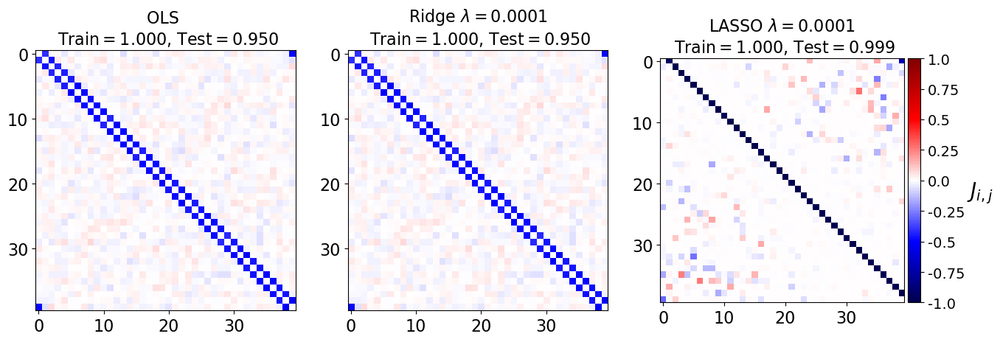

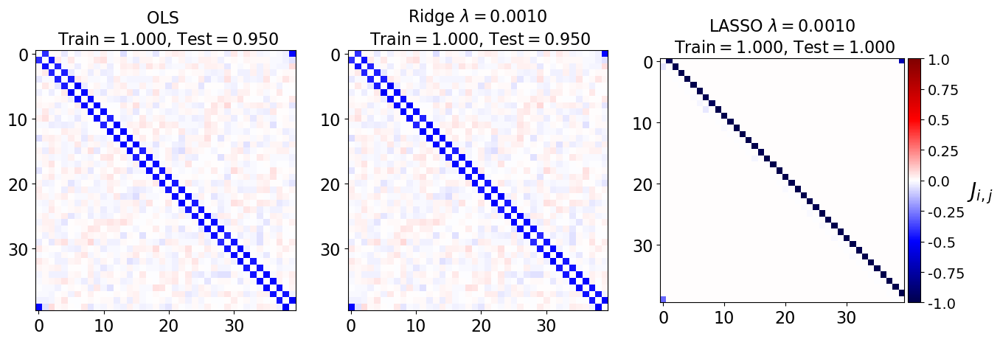

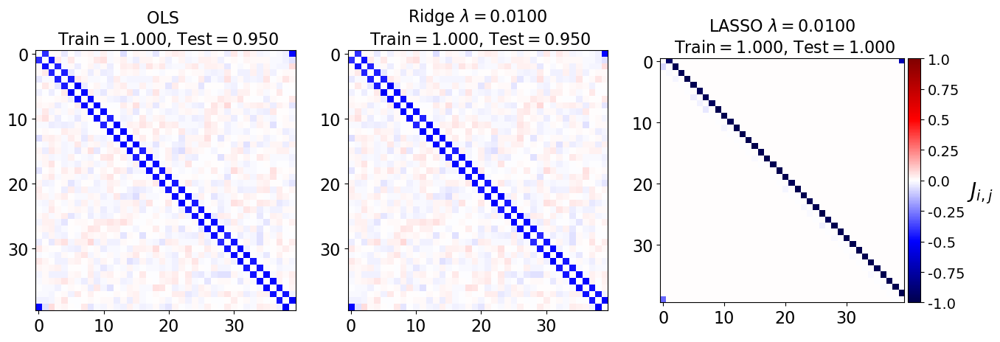

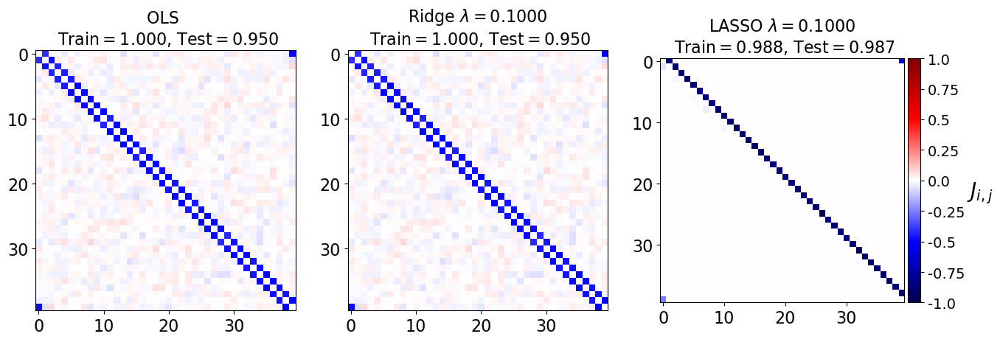

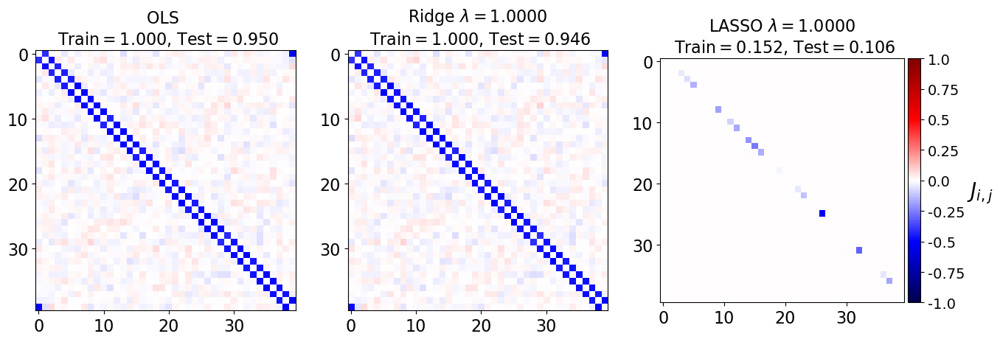

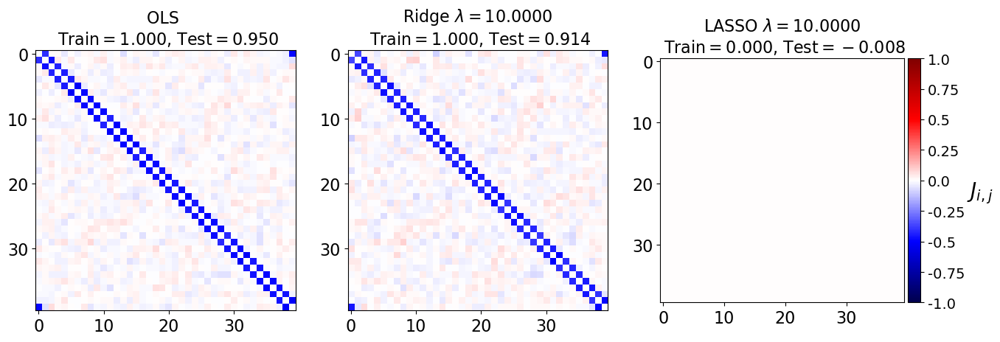

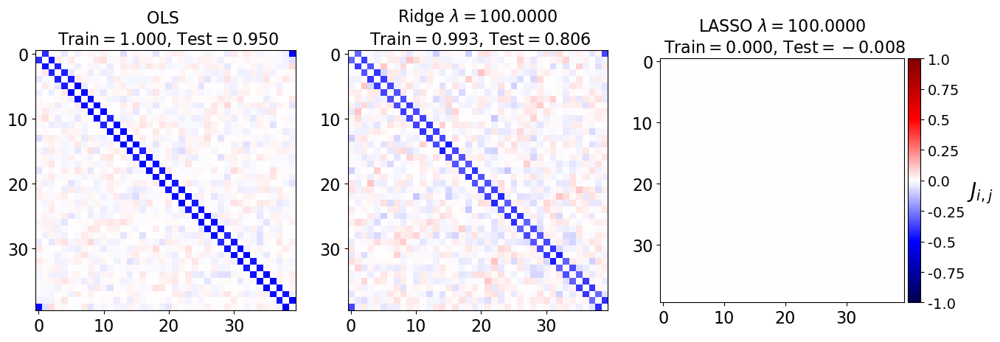

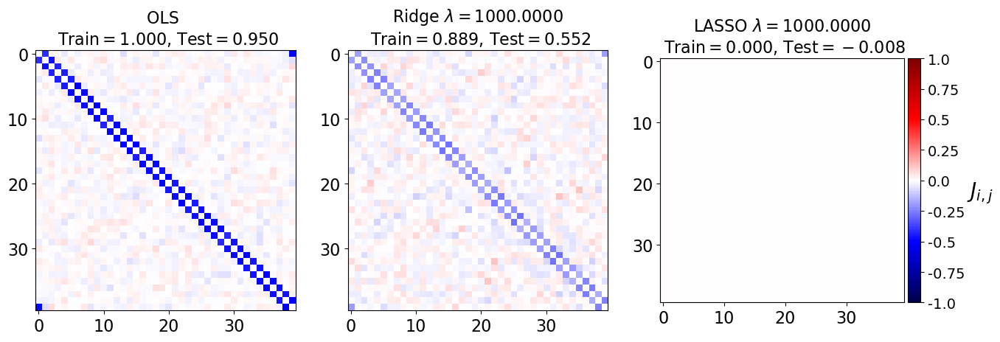

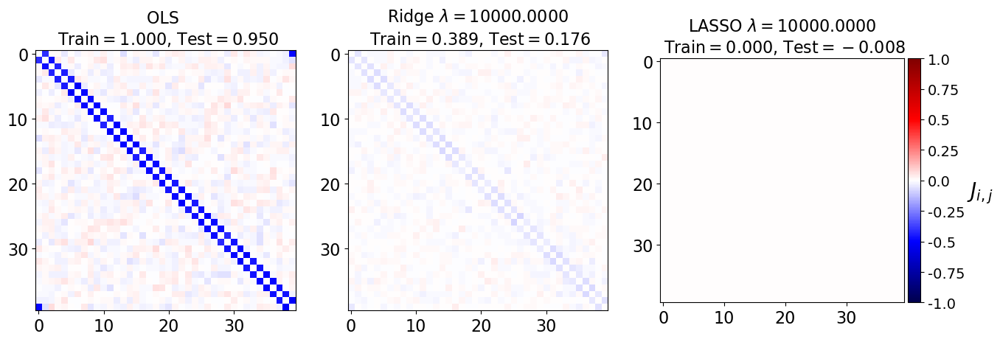

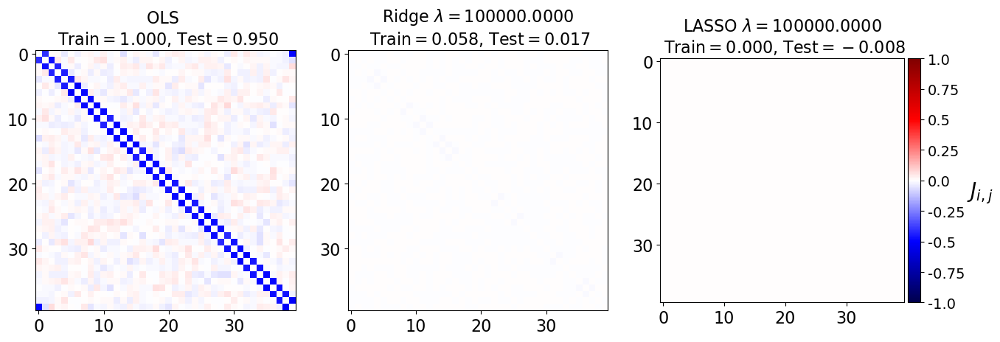

In [9]:
values = train(X_train,Y_train, X_test, Y_test)

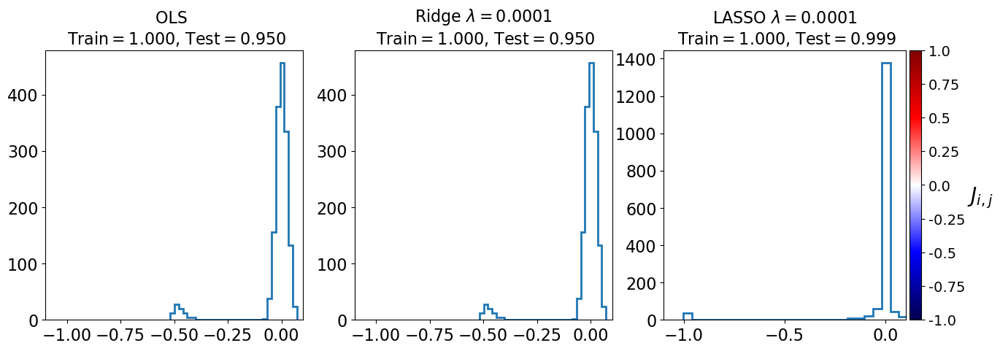

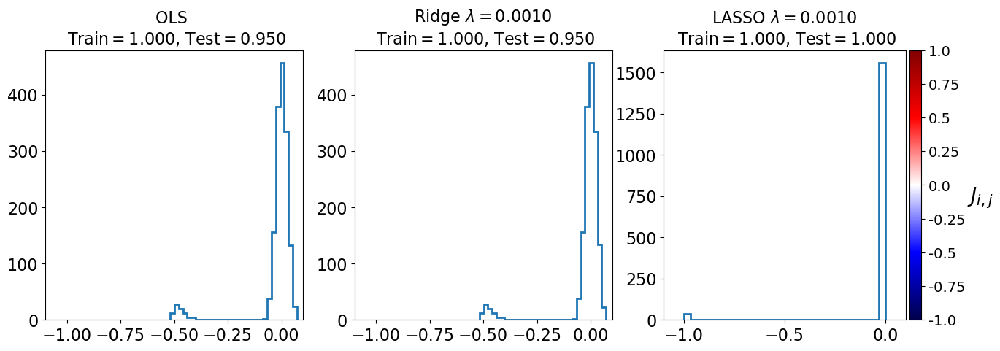

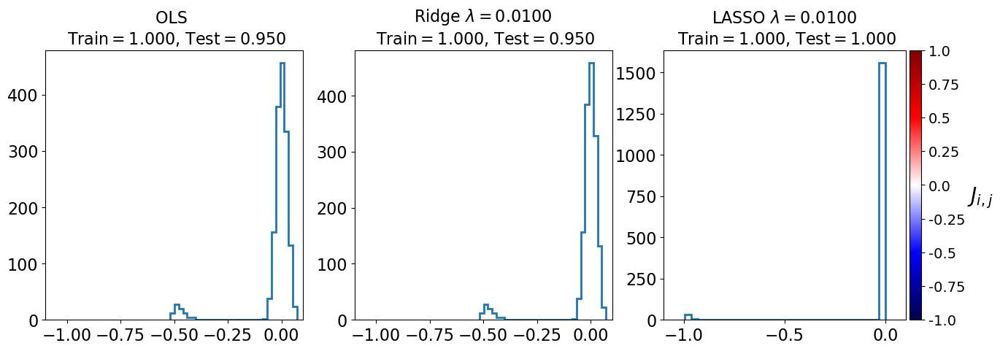

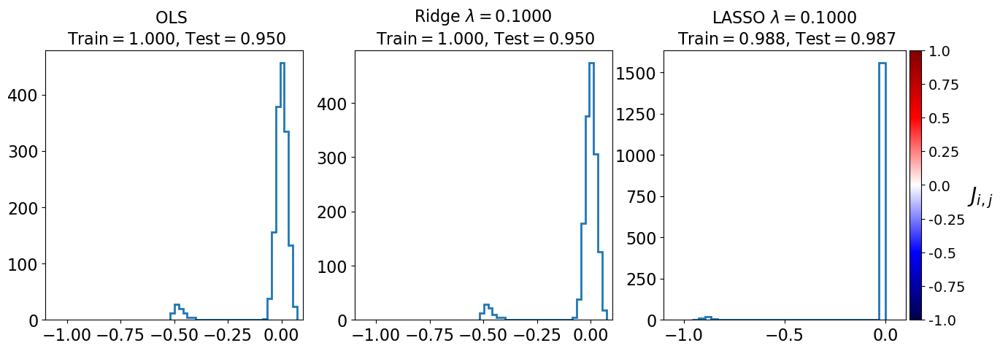

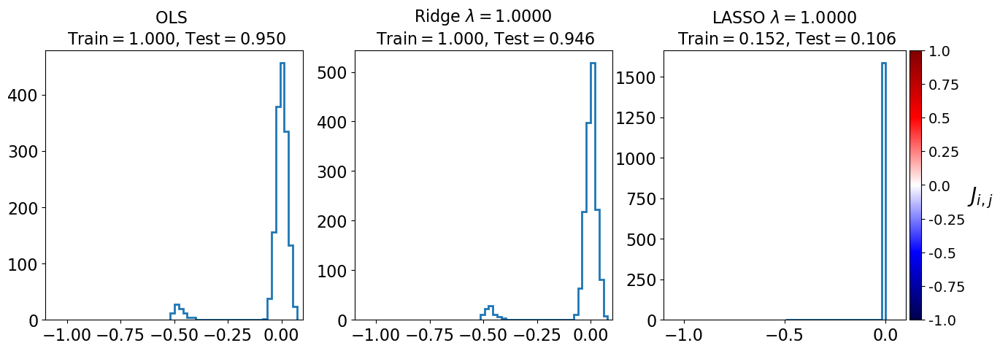

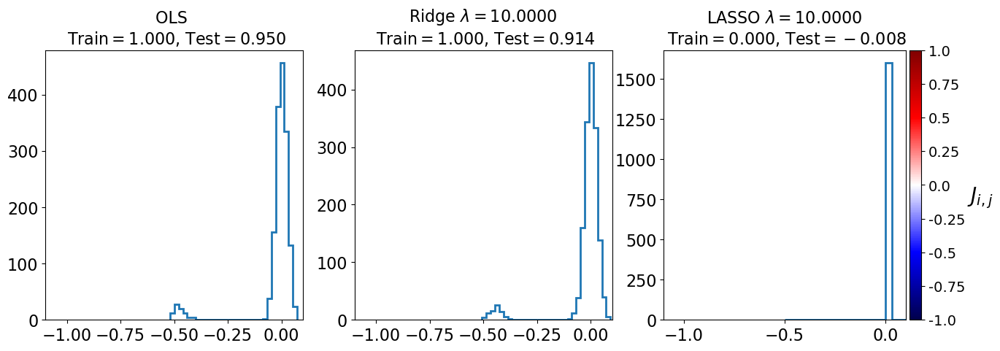

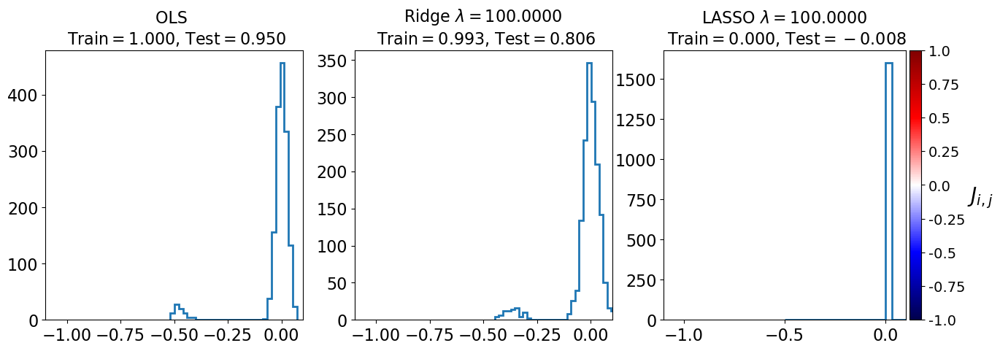

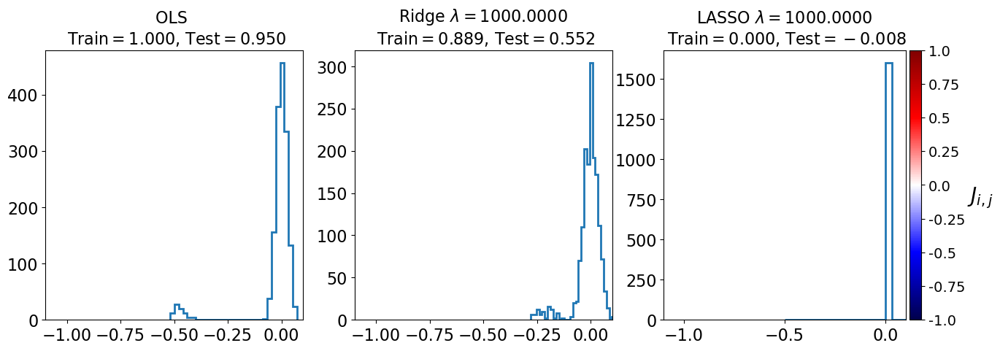

Exception ignored in: <function WeakMethod.__new__.<locals>._cb at 0x70c4a5fc5620>
Traceback (most recent call last):
  File "/usr/lib/python3.12/weakref.py", line 60, in _cb
    callback(self)
  File "/usr/lib/python3/dist-packages/matplotlib/cbook/__init__.py", line 257, in _remove_proxy
    del self.callbacks[signal][cid]
        ~~~~~~~~~~~~~~^^^^^^^^
KeyError: 'changed'
Exception ignored in: <function WeakMethod.__new__.<locals>._cb at 0x70c4f45abce0>
Traceback (most recent call last):
  File "/usr/lib/python3.12/weakref.py", line 60, in _cb
    callback(self)
  File "/usr/lib/python3/dist-packages/matplotlib/cbook/__init__.py", line 257, in _remove_proxy
    del self.callbacks[signal][cid]
        ~~~~~~~~~~~~~~^^^^^^^^
KeyError: 'changed'
Exception ignored in: <function WeakMethod.__new__.<locals>._cb at 0x70c4a5c63600>
Traceback (most recent call last):
  File "/usr/lib/python3.12/weakref.py", line 60, in _cb
    callback(self)
  File "/usr/lib/python3/dist-packages/matplotlib/

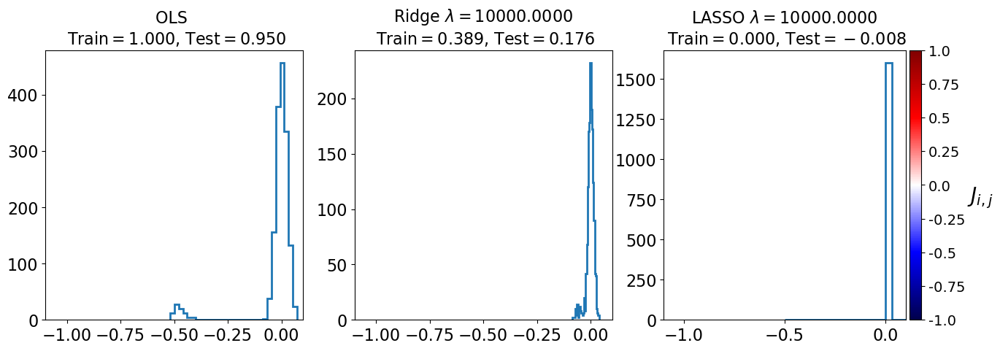

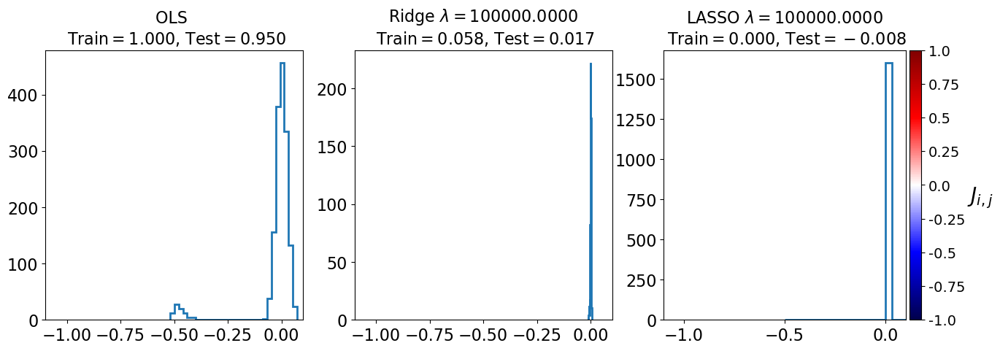

(array([1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03,
        1.e+04, 1.e+05]),
 [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0],
 [0.9504536052511846,
  0.9504536052511846,
  0.9504536052511846,
  0.9504536052511846,
  0.9504536052511846,
  0.9504536052511846,
  0.9504536052511846,
  0.9504536052511846,
  0.9504536052511846,
  0.9504536052511846],
 [0.9999999999998905,
  0.9999999999890642,
  0.9999999989148562,
  0.999999898801519,
  0.9999929864027477,
  0.9997112380815695,
  0.993211728644681,
  0.8893059014414827,
  0.38852270658658494,
  0.05768234672283634],
 [0.9504533460413567,
  0.9504510083326607,
  0.9504271643980607,
  0.9501506925457052,
  0.9463770081817253,
  0.9144962337181808,
  0.8056460692404136,
  0.5518636760994167,
  0.17554320365452958,
  0.017209682606818655],
 [0.999999423053804,
  0.9999988425105741,
  0.9998842375816979,
  0.9884239770951196,
  0.15223421305998464,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0],
 [0.998968944702551,
  0.999998713516

In [10]:
J_distibution_1D(X_train,Y_train, X_test, Y_test)

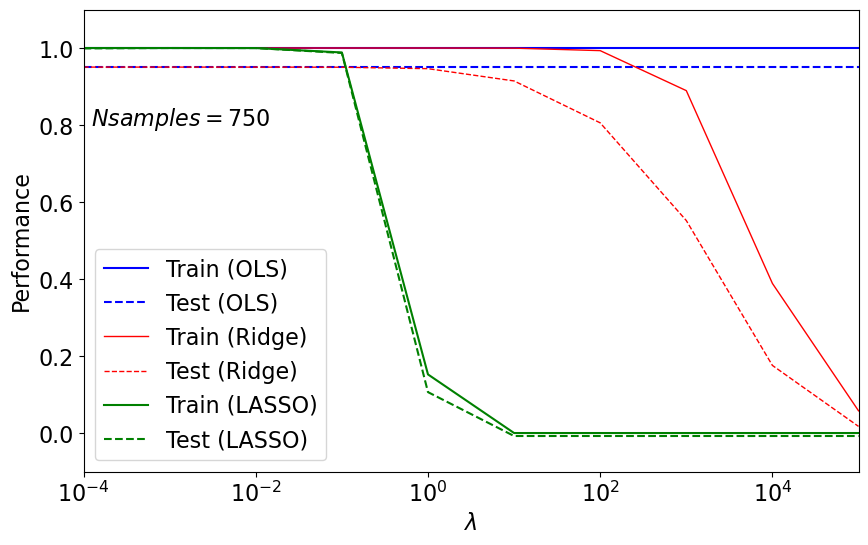

In [11]:
draw_error_vs_lambda(*values[:-3],n_samples)

In [12]:
# define number of samples
n_samples=1500
# define train and test data sets
X_train=Data[0][:n_samples]
Y_train=Data[1][:n_samples] #+ np.random.normal(0,4.0,size=X_train.shape[0])
X_test=Data[0][n_samples:3*n_samples//2]
Y_test=Data[1][n_samples:3*n_samples//2] #+ np.random.normal(0,4.0,size=X_test.shape[0])
print("train size: ", len(X_train))
print("test size: ", len(X_test))
print("total sample size: ", len(Data[0]))

train size:  750
test size:  1500
total sample size:  40000


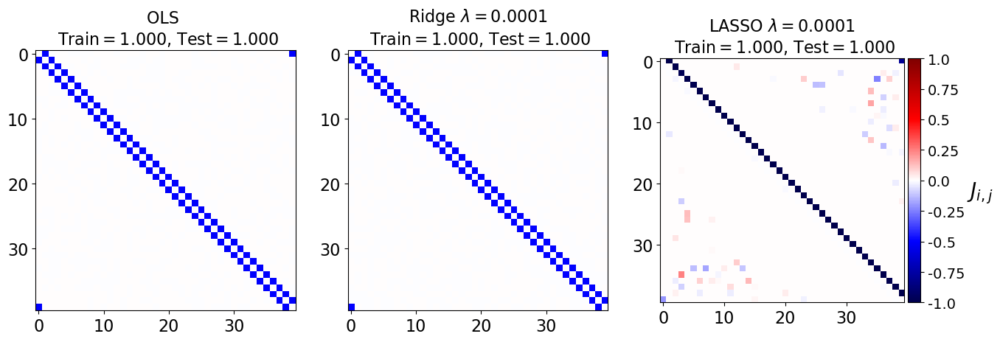

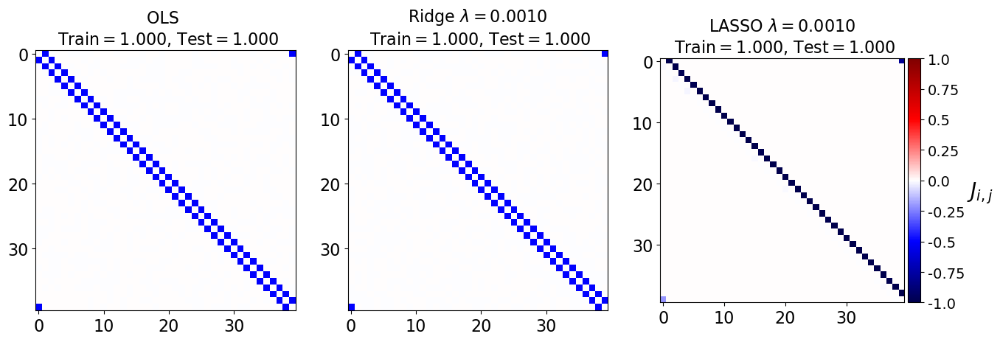

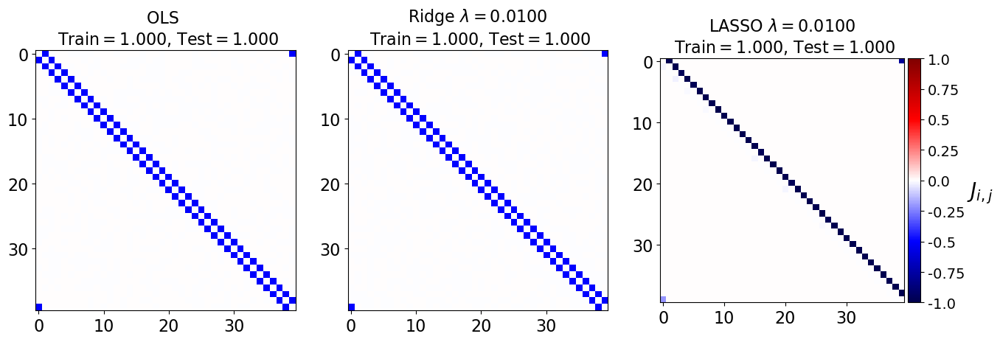

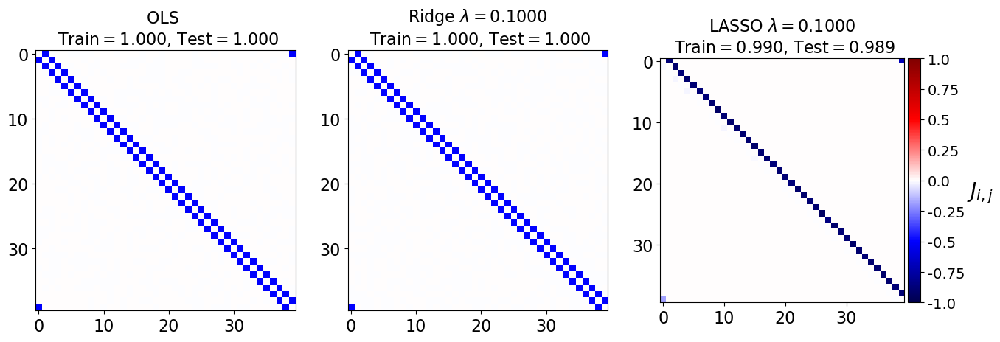

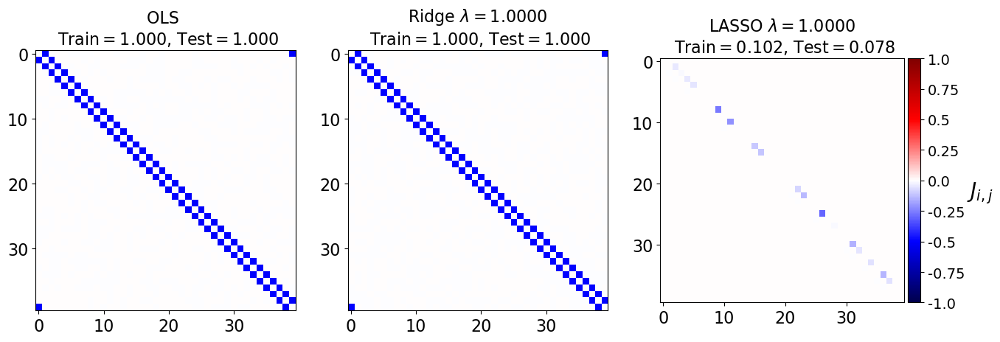

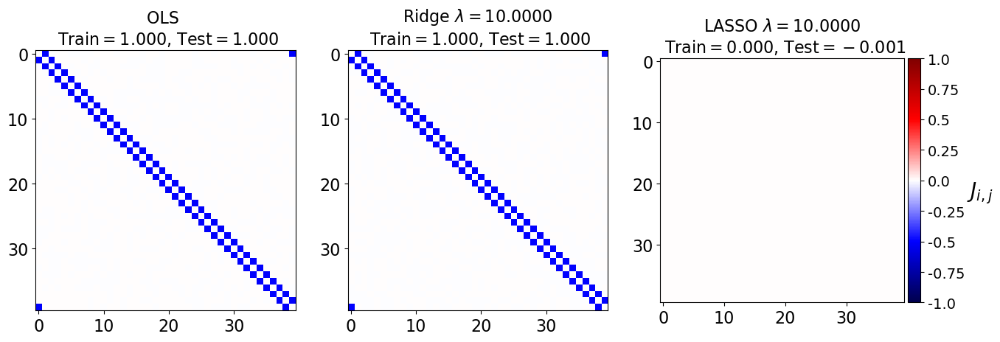

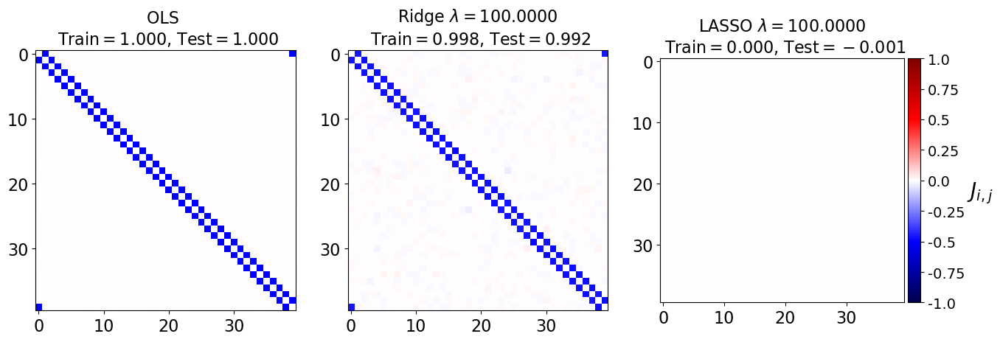

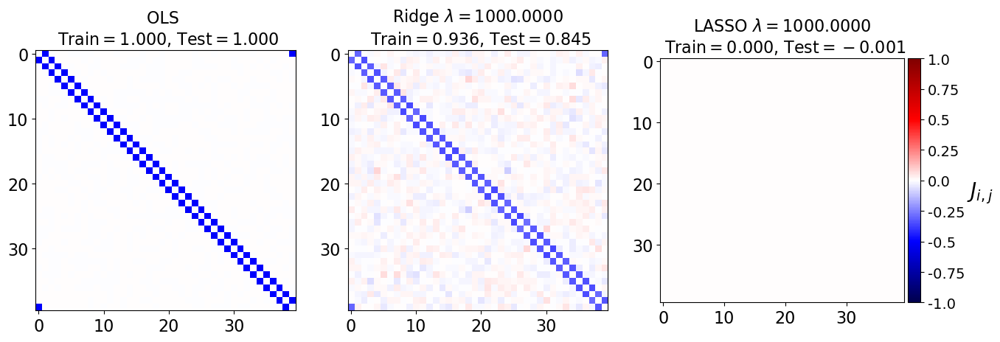

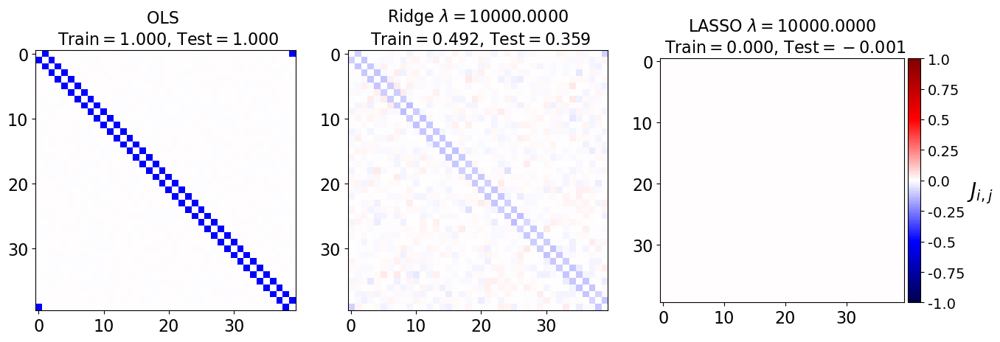

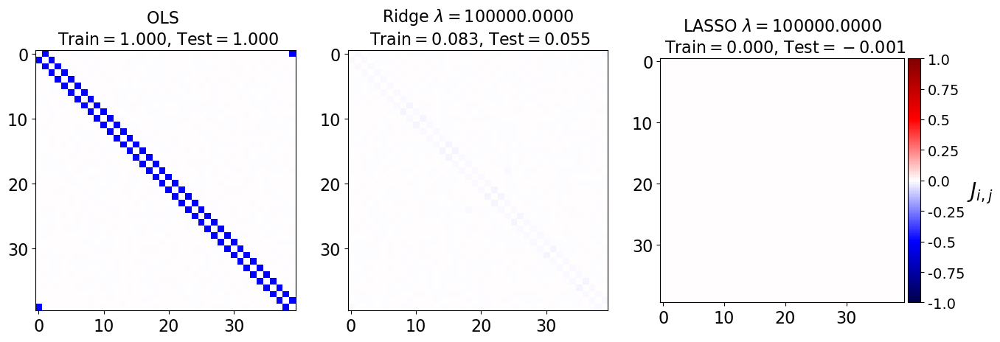

In [13]:
values = train(X_train,Y_train, X_test, Y_test)

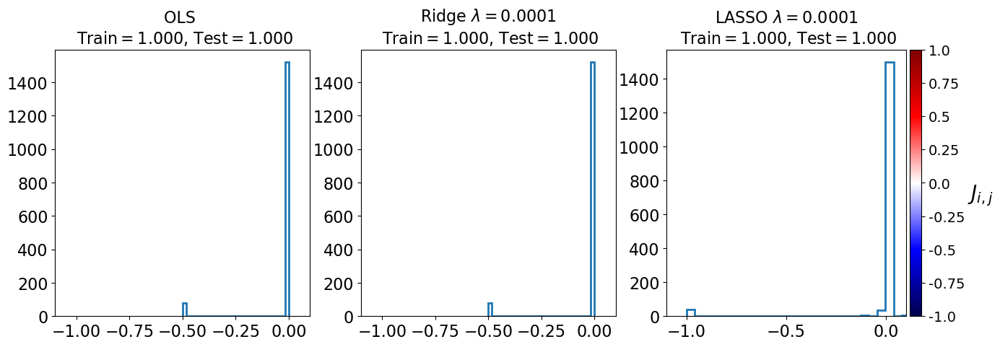

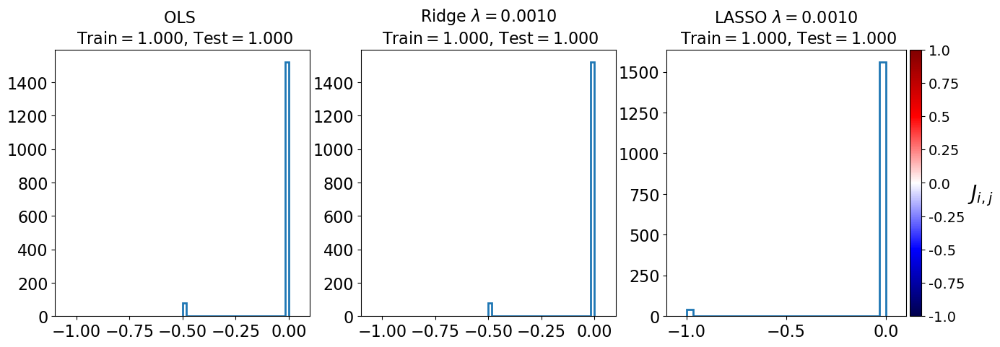

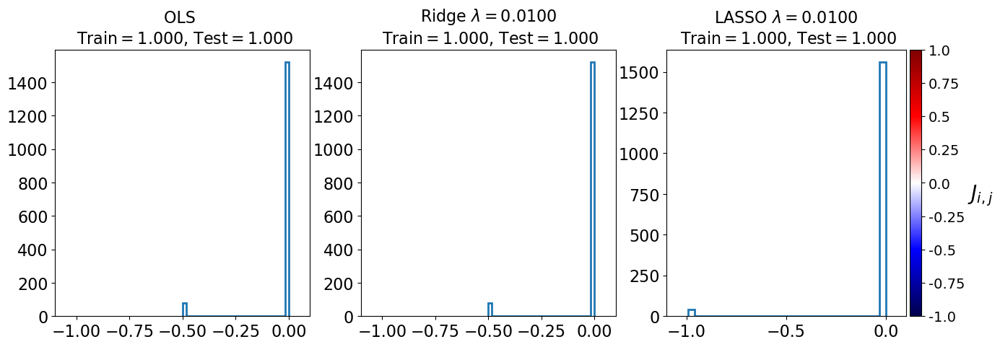

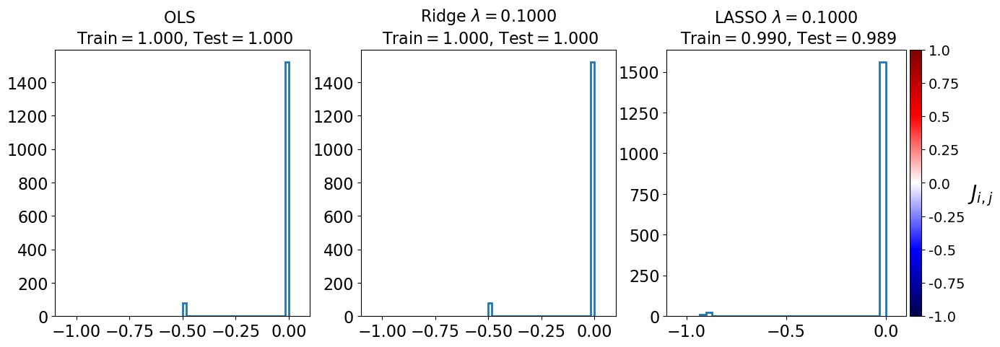

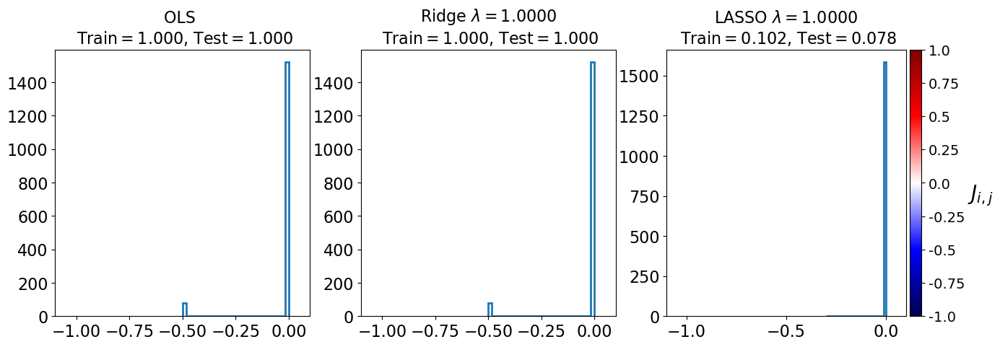

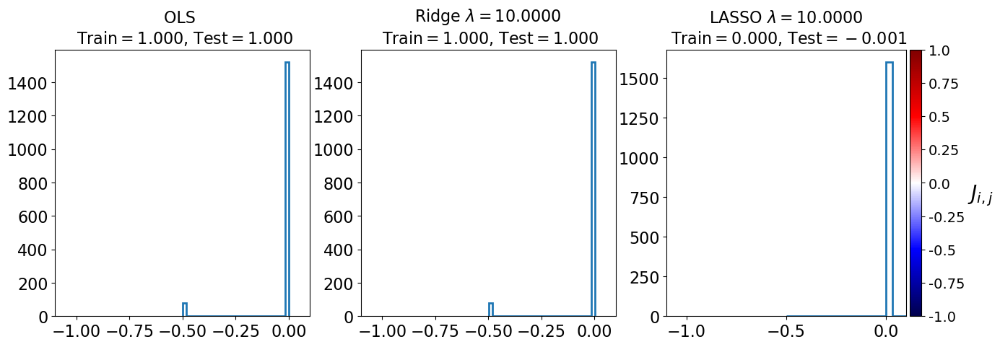

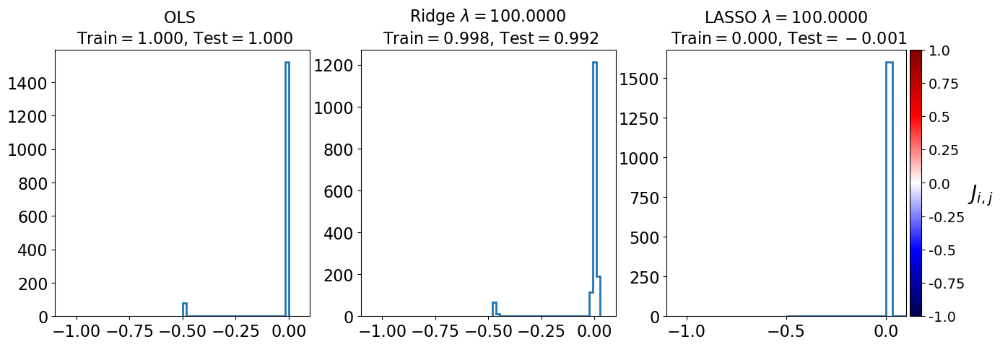

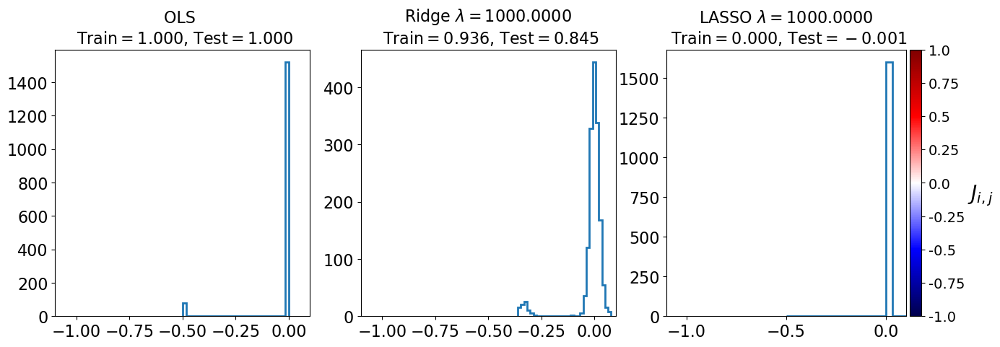

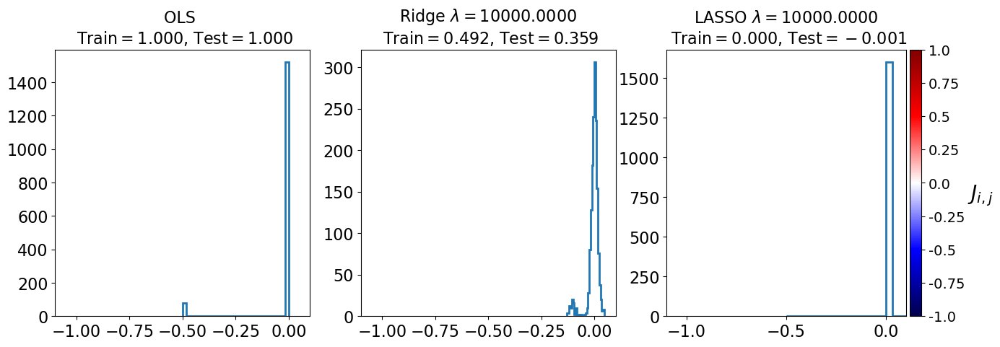

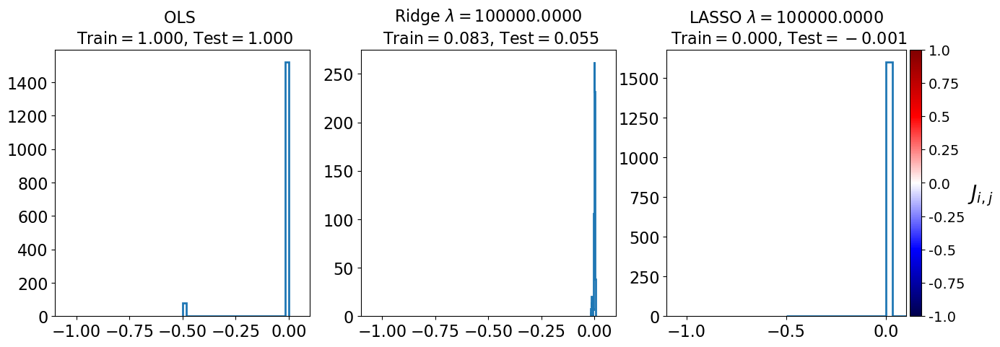

(array([1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03,
        1.e+04, 1.e+05]),
 [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0],
 [1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0],
 [0.9999999999999976,
  0.9999999999997575,
  0.9999999999757554,
  0.9999999975762023,
  0.9999997582835196,
  0.9999764699559477,
  0.9981292899537714,
  0.9362670533692916,
  0.49233349016762173,
  0.08303530308723617],
 [0.9999999999999886,
  0.9999999999988616,
  0.9999999998861668,
  0.9999999886213892,
  0.9999988668272208,
  0.9998911864945101,
  0.992308901738345,
  0.8449270097919911,
  0.35869208433379385,
  0.055208198082799975],
 [0.999999984276413,
  0.9999989578657,
  0.9998957586592023,
  0.9895758540574279,
  0.10188084972833023,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0],
 [0.9999999801140351,
  0.9999989043786539,
  0.9998904003820048,
  0.989040021078762,
  0.07783710992743009,
  -0.0005878279010911314,
  -0.0005878279010911314,
  -0.0005878279010911314,
  -0.00058782790109

In [14]:
J_distibution_1D(X_train,Y_train, X_test, Y_test)

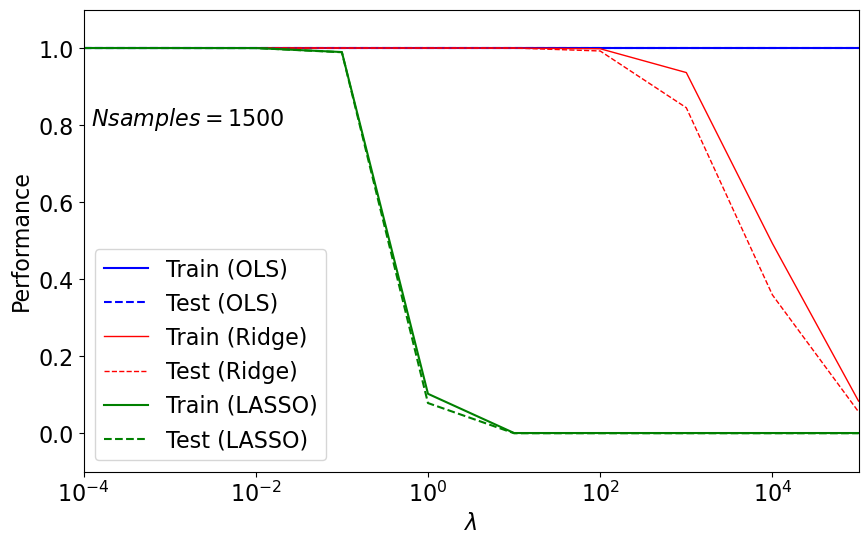

In [15]:
draw_error_vs_lambda(*values[:-3],n_samples)

- We can see that if we increase $N_{sample}$, then Ridge and OLS increase their performance, and Lasso increases the range of lambda for which it is valid. For $N_{sample}= 1500$, we can see that all three models can make good predictions about the training sample. In the 1D plots, we can see the effect of the gauge invariance, where two models predict an interaction of -0.5 with both neighbors and Lasso predicts an interaction of -1 with the next neighbor. In terms of variance and bias, we see that if we increase the number of training samples, all methods make good predictions, so we can deduce that the main source of error is given by the variance and that the bias is small.

Now lets add some noise

In [16]:
# define number of samples
n_samples= 400
# define train and test data sets
X_train=Data[0][:n_samples]
Y_train=Data[1][:n_samples] + np.random.normal(0,4.0,size=X_train.shape[0])
X_test=Data[0][n_samples:3*n_samples//2]
Y_test=Data[1][n_samples:3*n_samples//2] + np.random.normal(0,4.0,size=X_test.shape[0])
print("train size: ", len(X_train))
print("test size: ", len(X_test))
print("total sample size: ", len(Data[0]))

train size:  200
test size:  400
total sample size:  40000


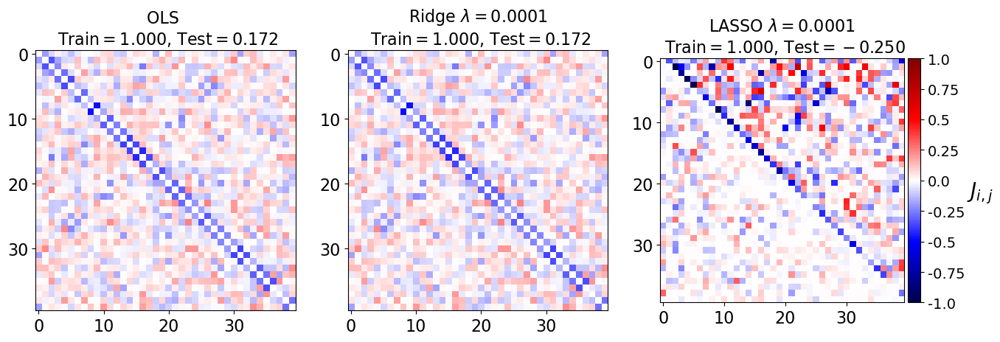

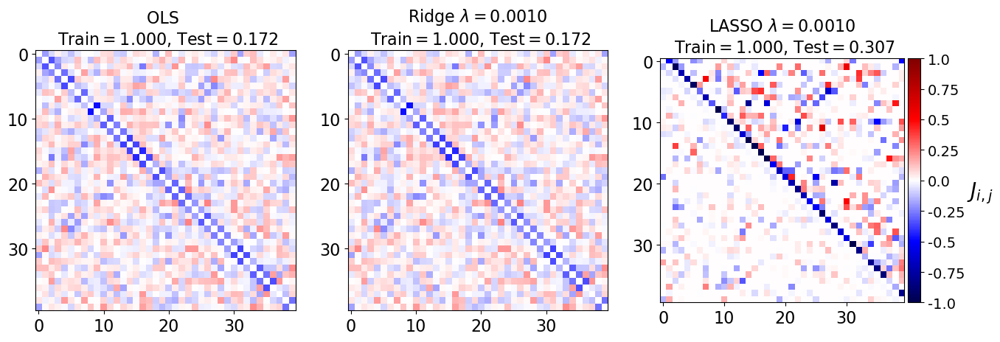

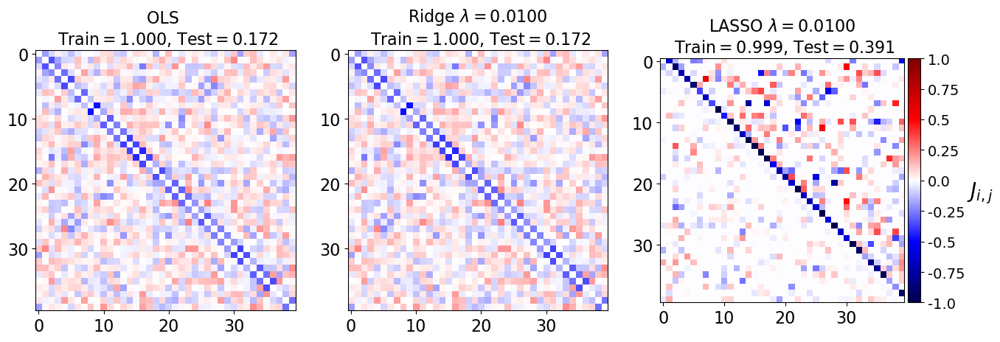

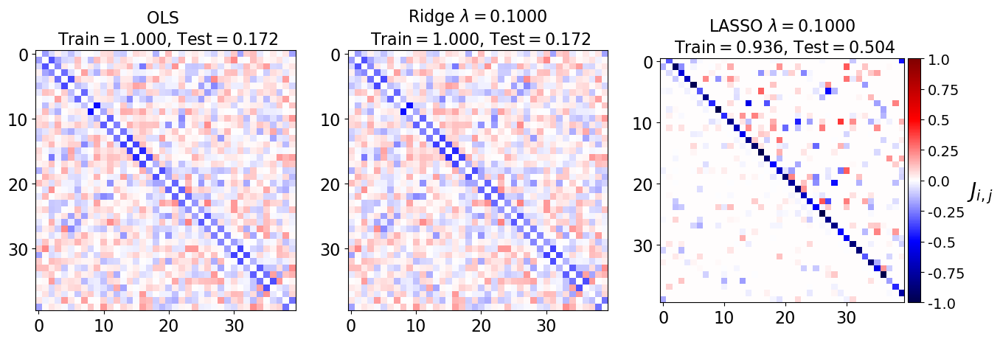

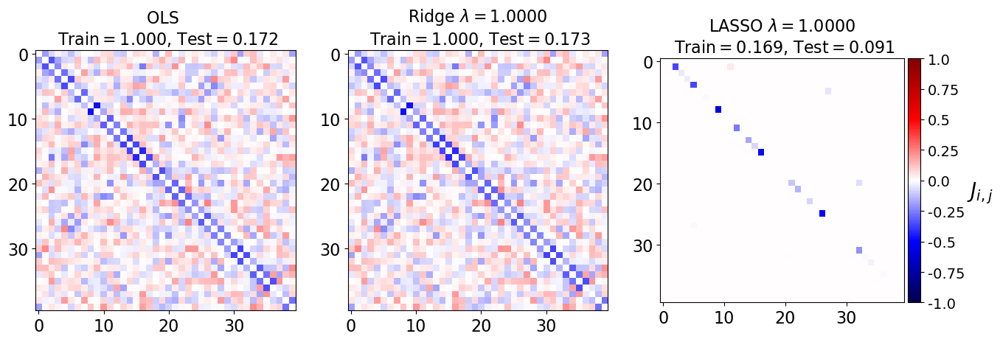

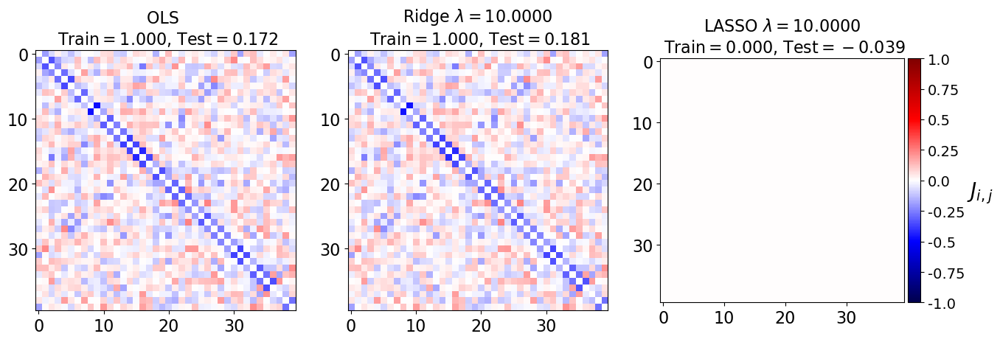

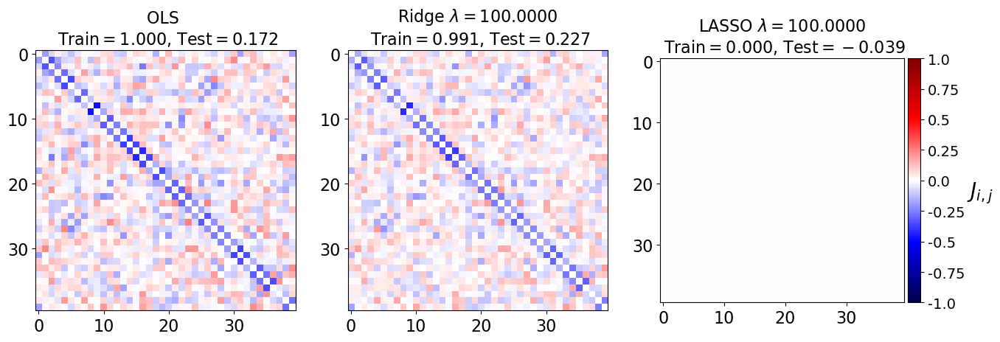

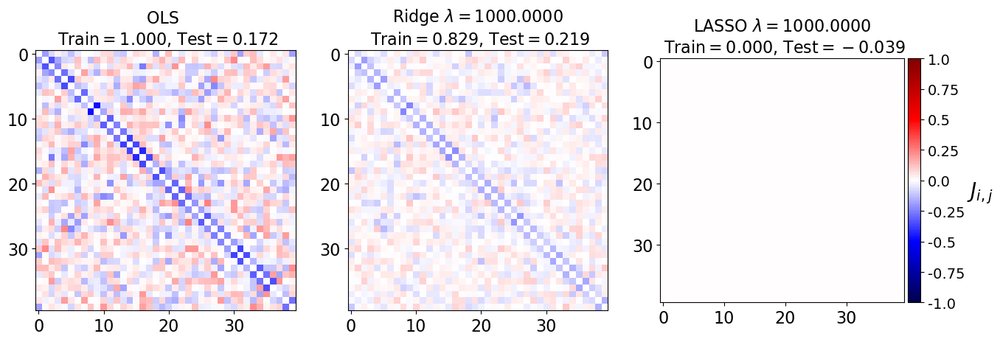

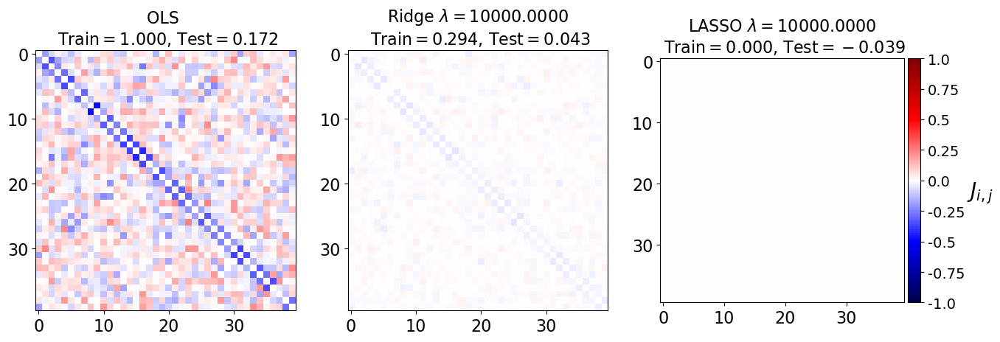

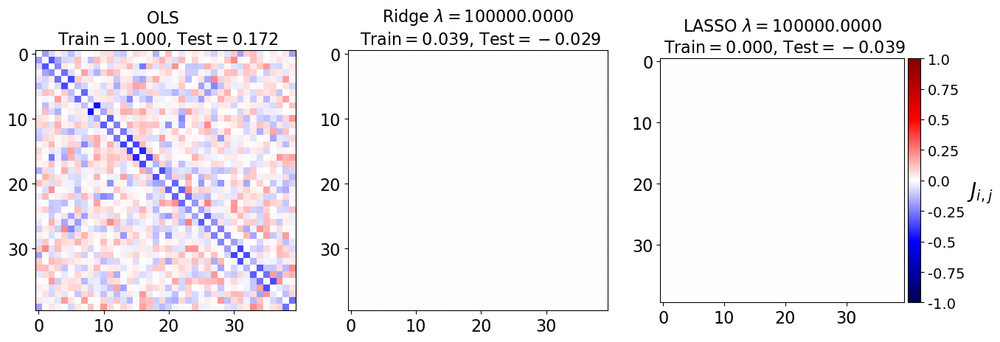

In [17]:
values = train(X_train,Y_train, X_test, Y_test)

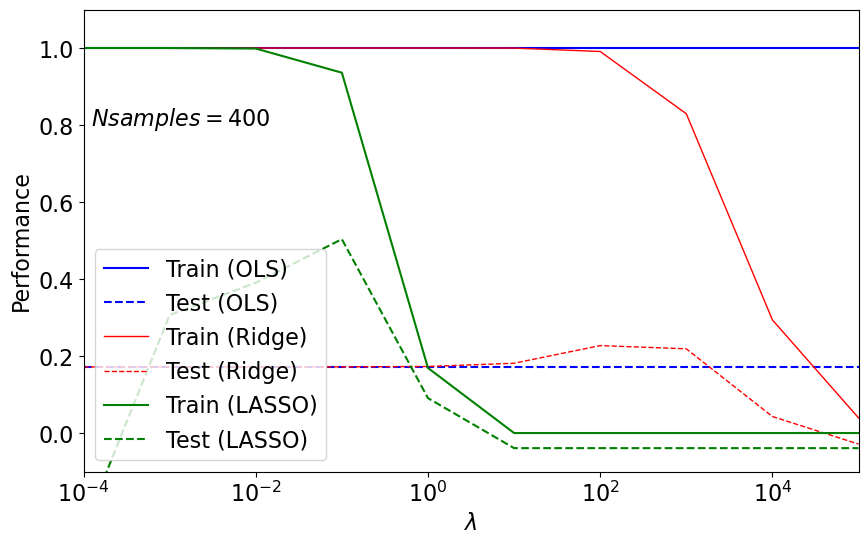

In [18]:
draw_error_vs_lambda(*values[:-3],n_samples)

In [19]:
# define number of samples
n_samples= 750
# define train and test data sets
X_train=Data[0][:n_samples]
Y_train=Data[1][:n_samples] + np.random.normal(0,4.0,size=X_train.shape[0])
X_test=Data[0][n_samples:3*n_samples//2]
Y_test=Data[1][n_samples:3*n_samples//2] + np.random.normal(0,4.0,size=X_test.shape[0])
print("train size: ", len(X_train))
print("test size: ", len(X_test))
print("total sample size: ", len(Data[0]))

train size:  375
test size:  750
total sample size:  40000


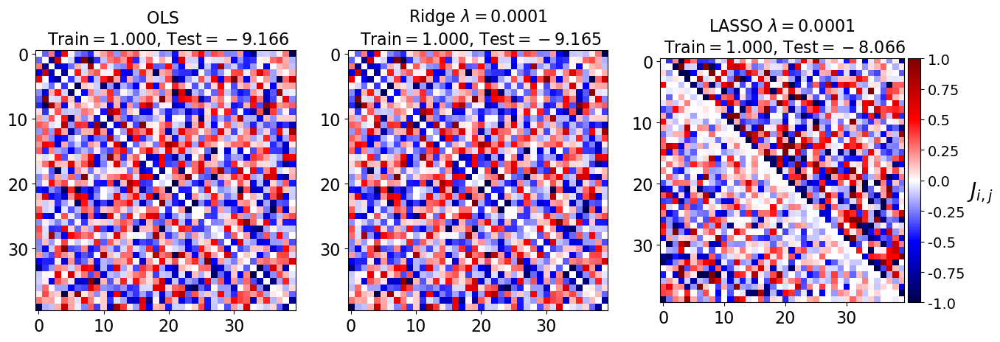

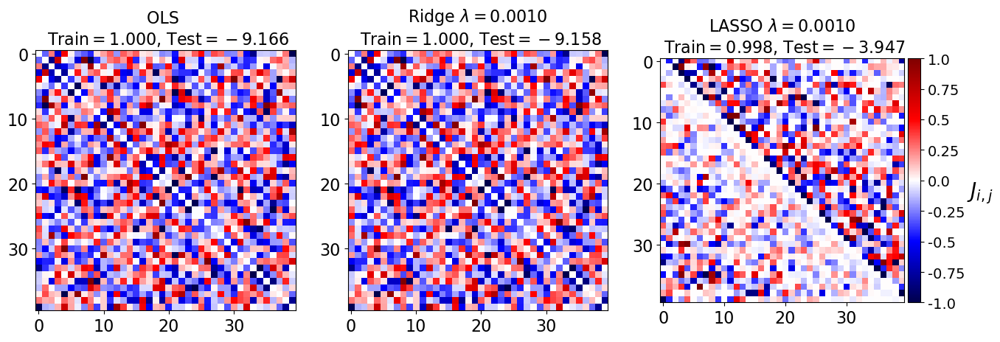

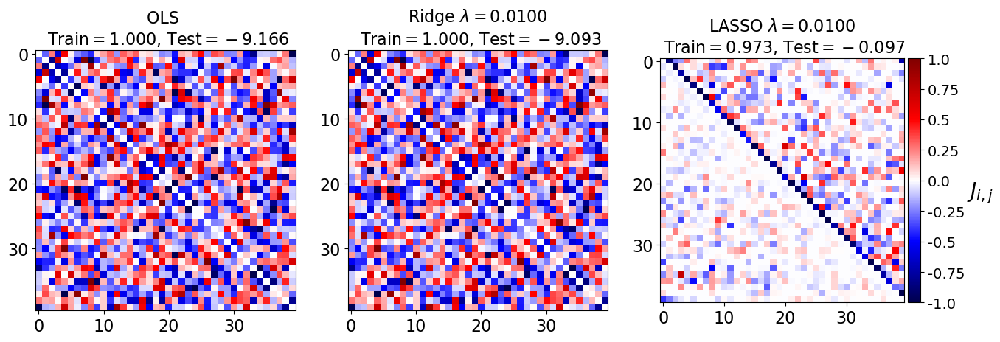

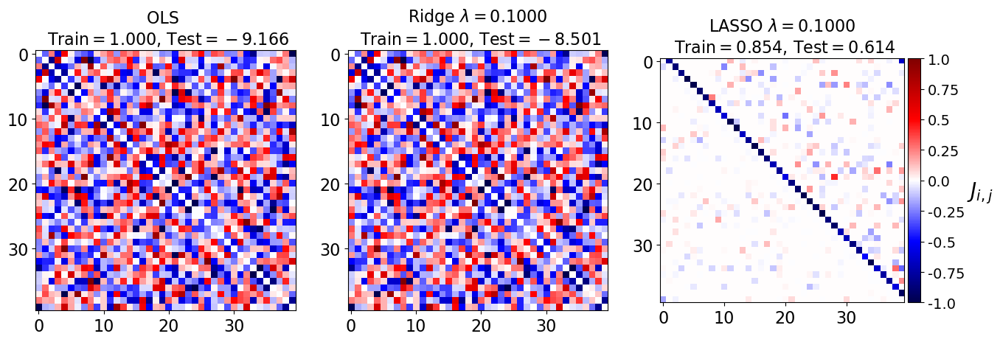

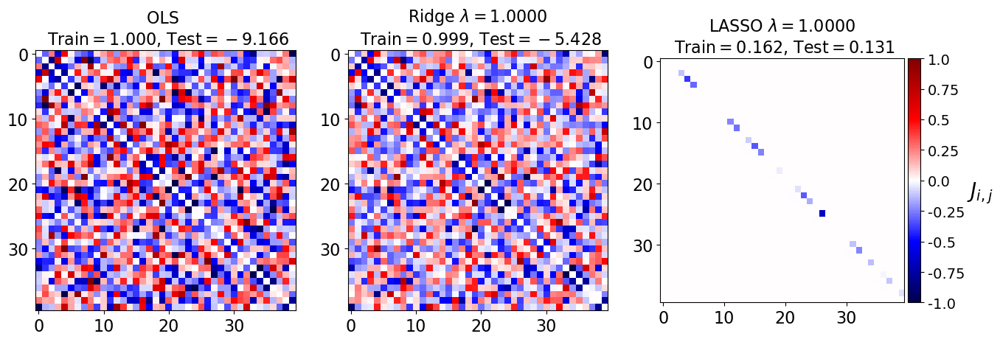

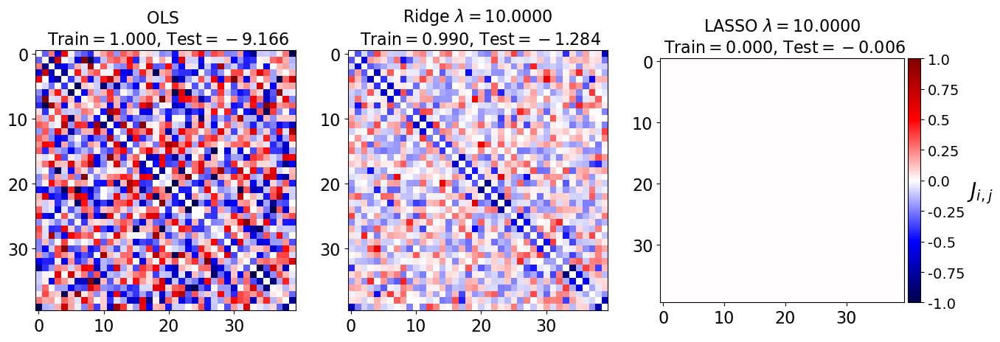

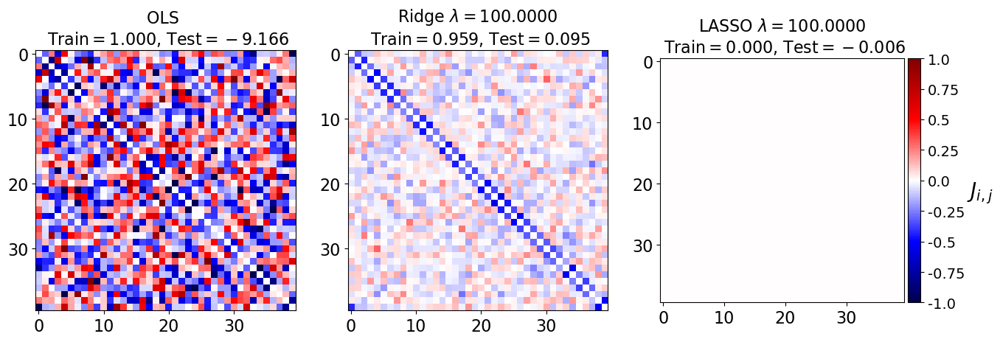

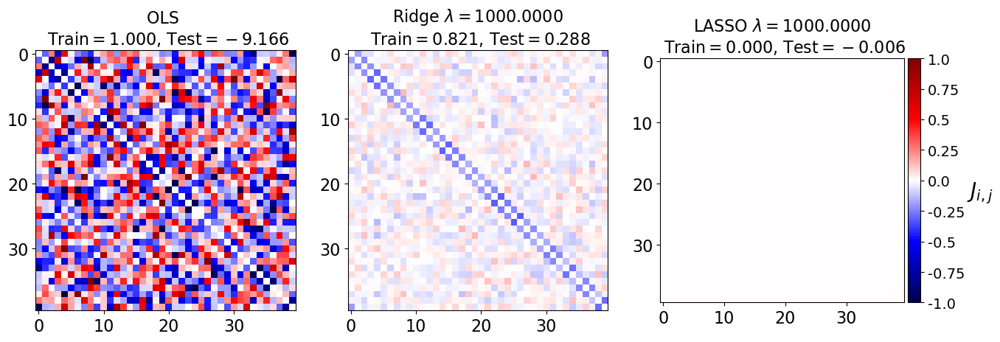

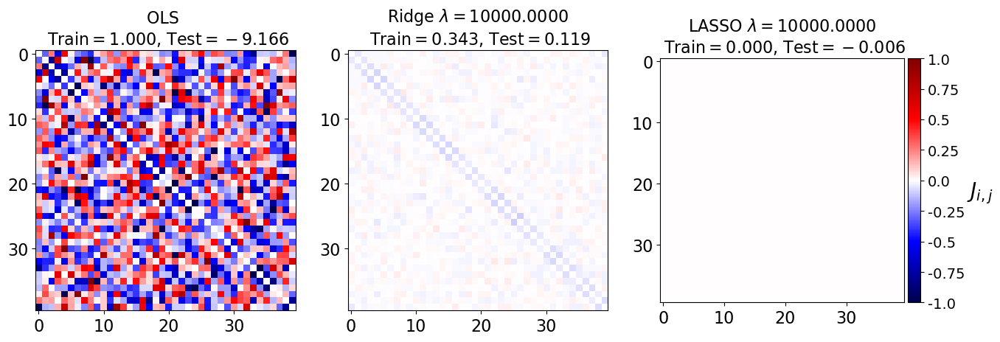

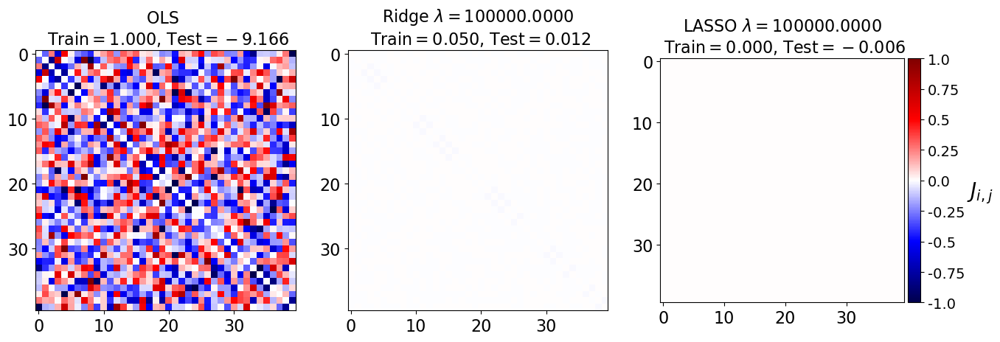

In [20]:
values = train(X_train,Y_train, X_test, Y_test)

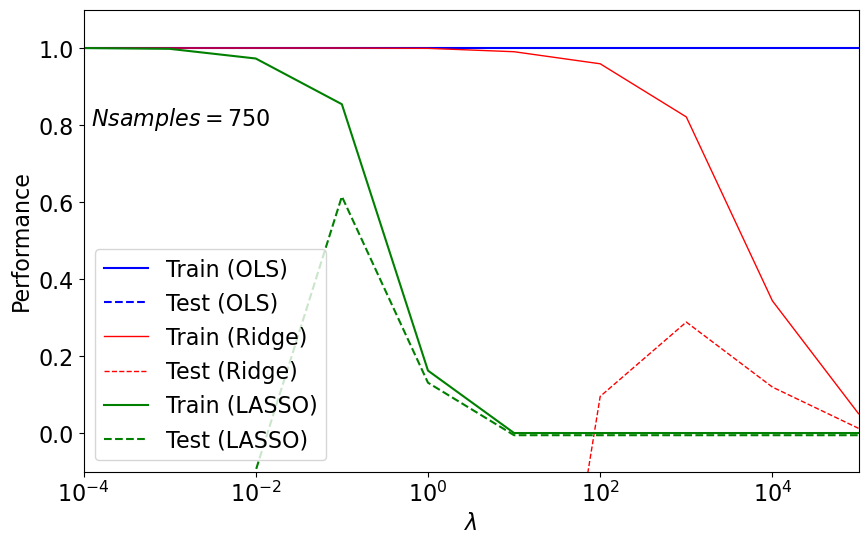

In [21]:
draw_error_vs_lambda(*values[:-3],n_samples)

In [22]:
# define number of samples
n_samples= 1500
# define train and test data sets
X_train=Data[0][:n_samples]
Y_train=Data[1][:n_samples] + np.random.normal(0,4.0,size=X_train.shape[0])
X_test=Data[0][n_samples:3*n_samples//2]
Y_test=Data[1][n_samples:3*n_samples//2] + np.random.normal(0,4.0,size=X_test.shape[0])
print("train size: ", len(X_train))
print("test size: ", len(X_test))
print("total sample size: ", len(Data[0]))
print(len(X_train[0]))

train size:  750
test size:  1500
total sample size:  40000
1600


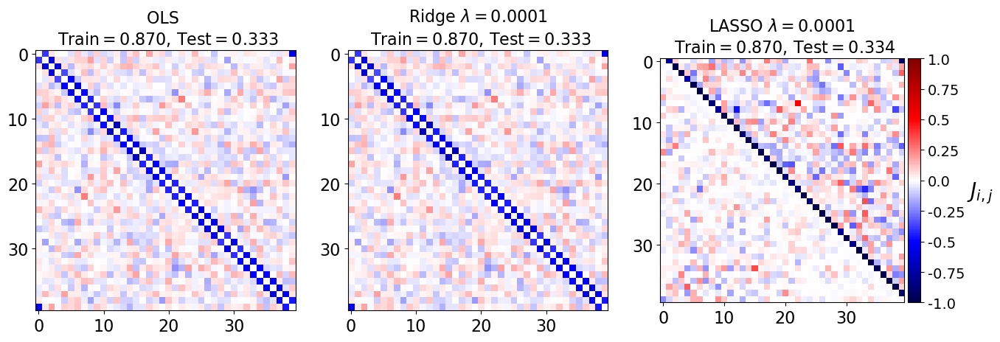

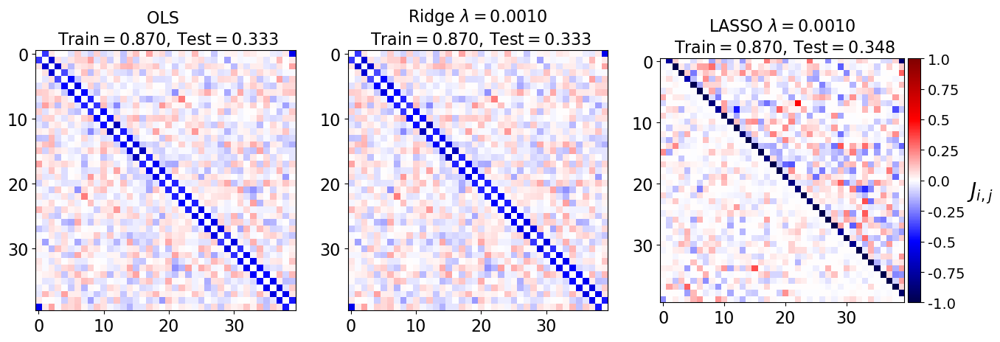

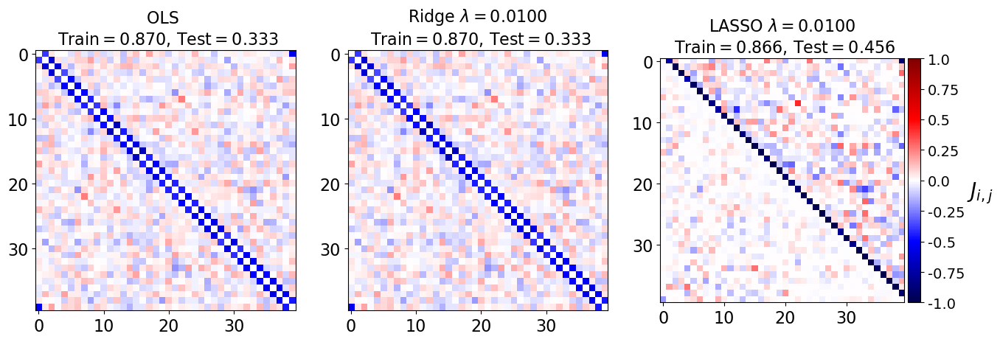

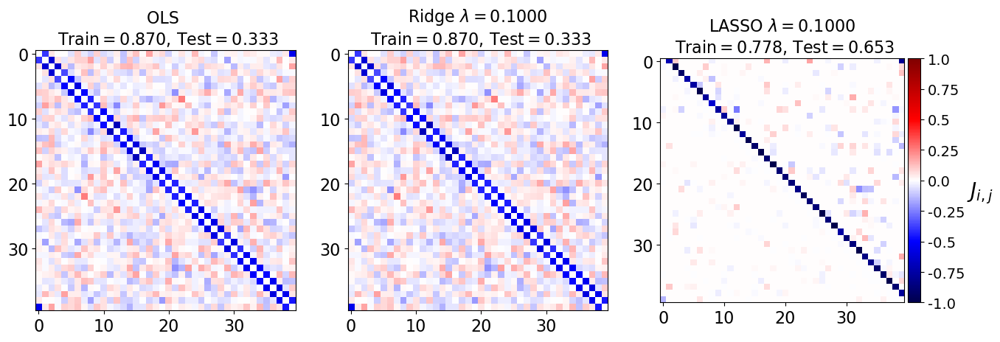

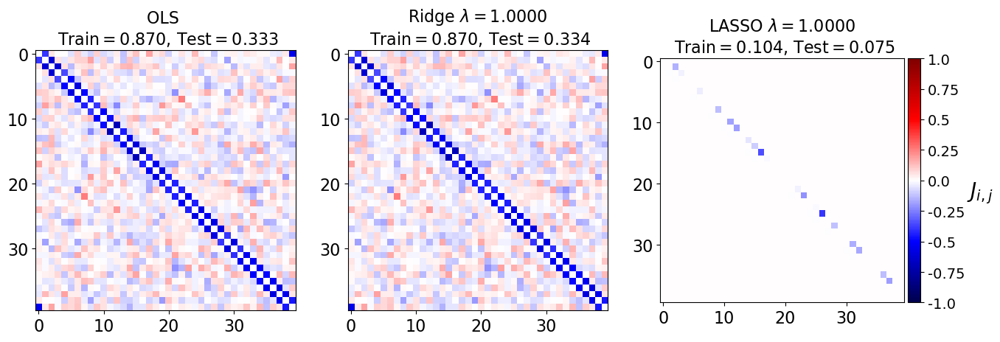

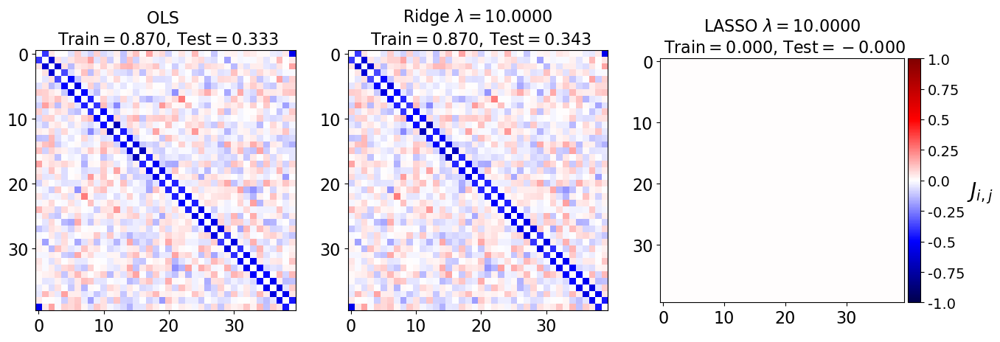

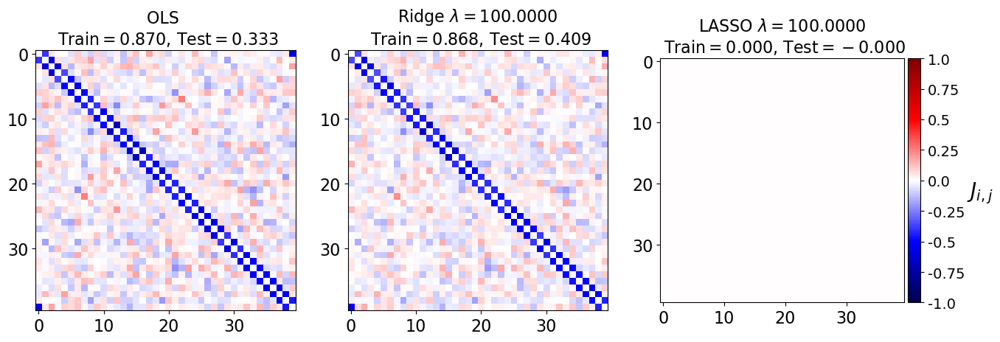

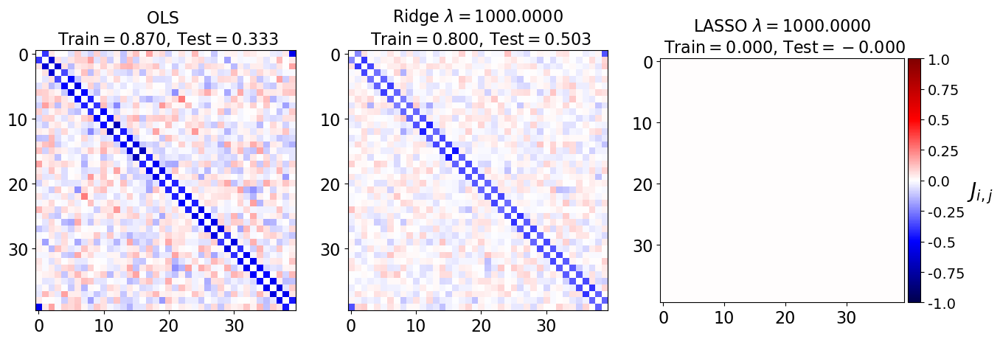

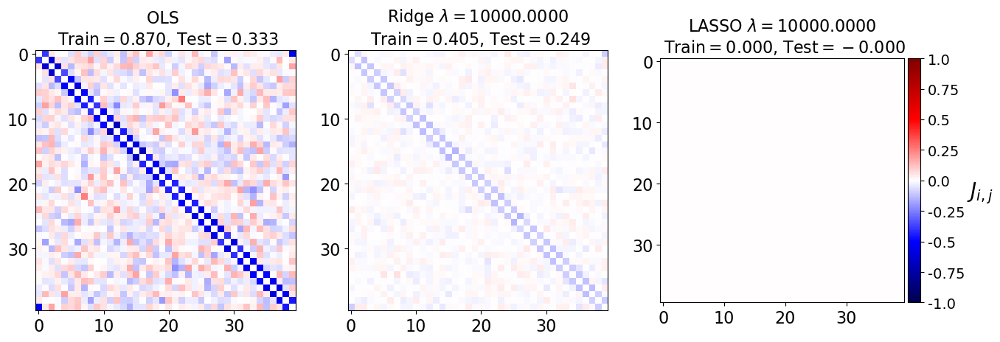

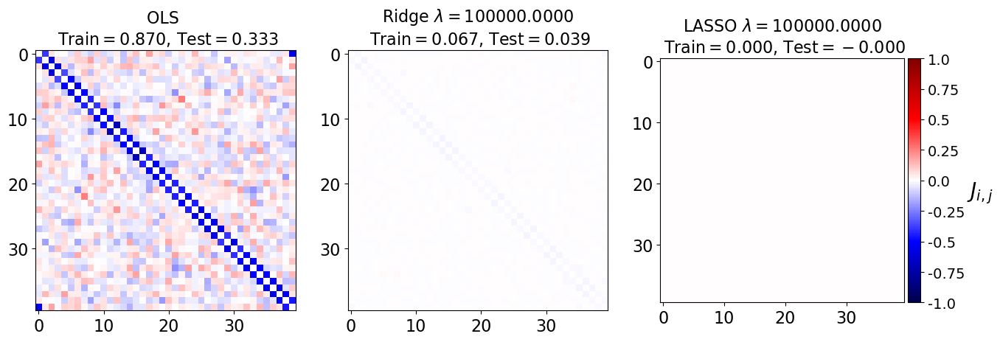

In [23]:
values = train(X_train,Y_train, X_test, Y_test)

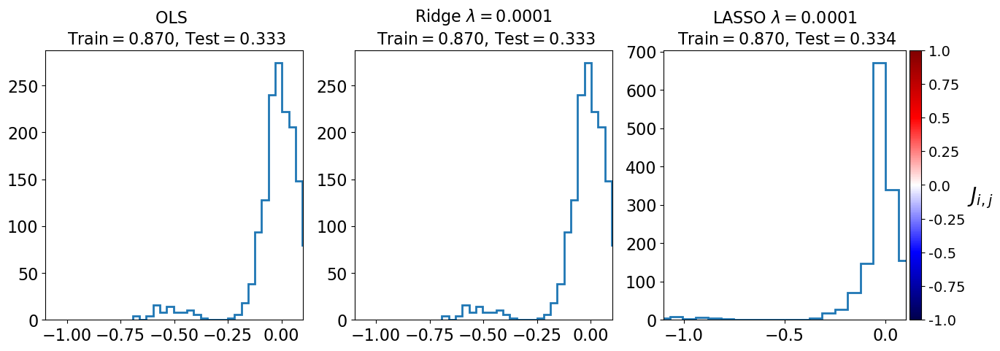

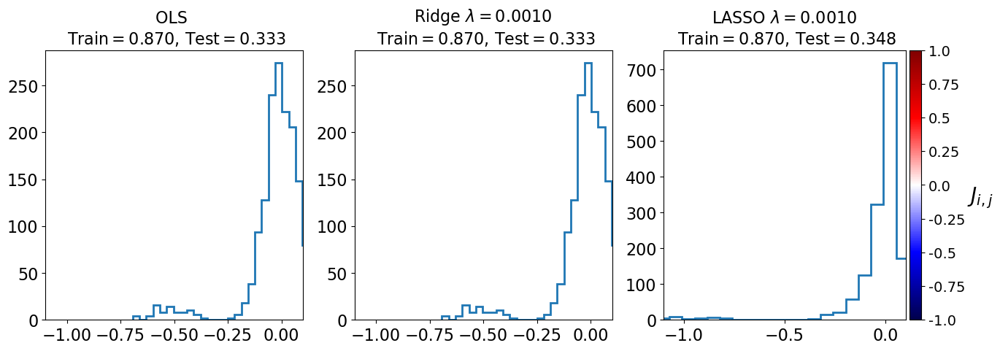

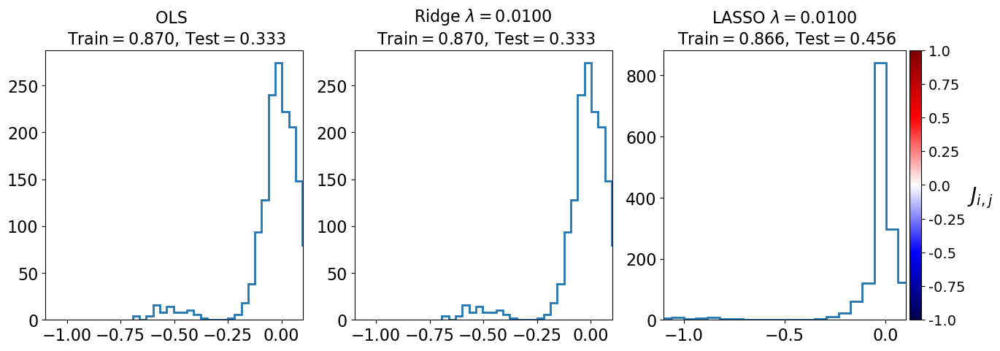

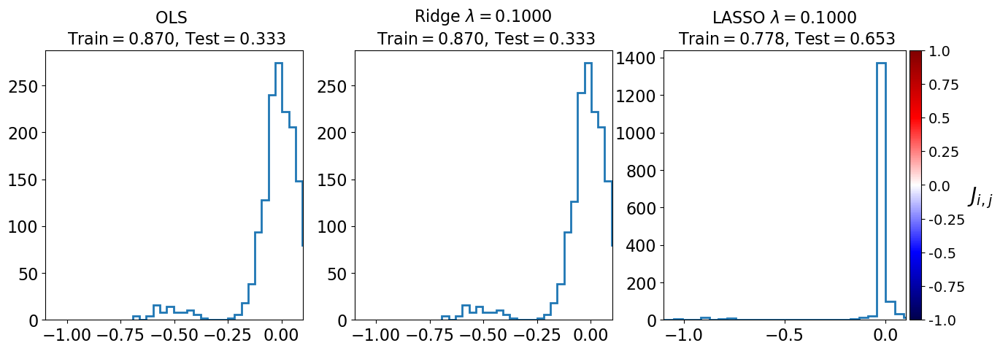

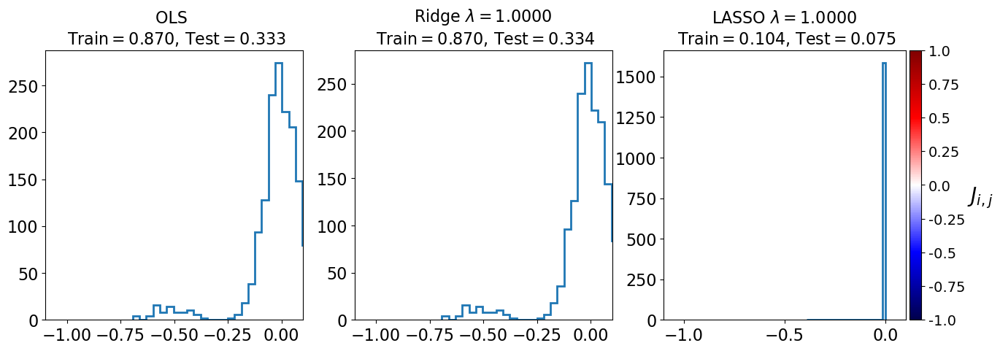

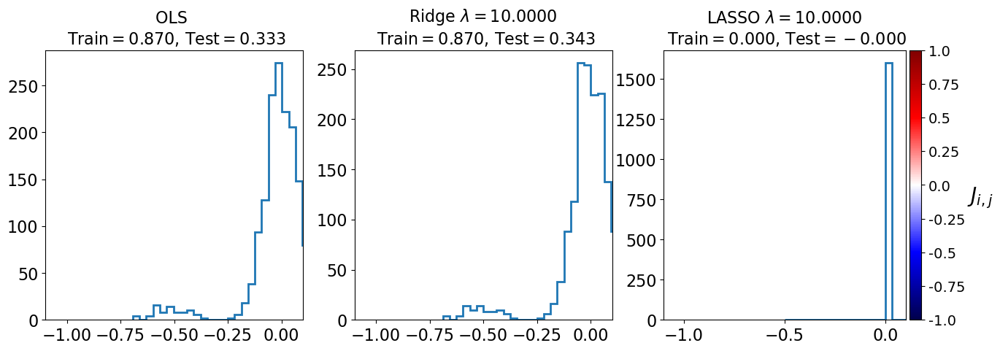

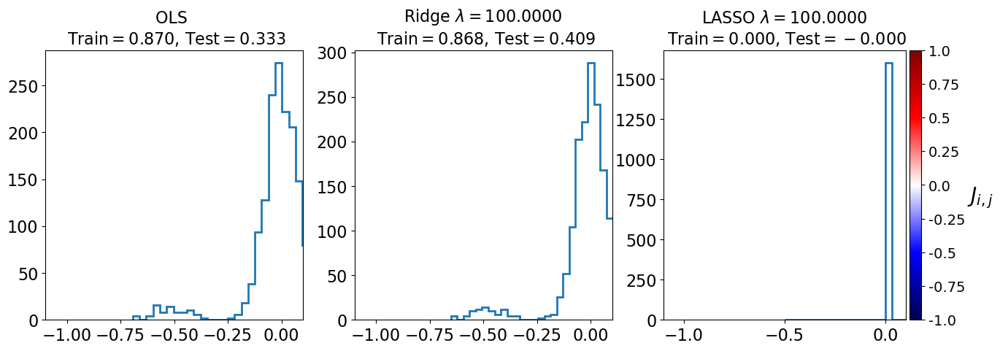

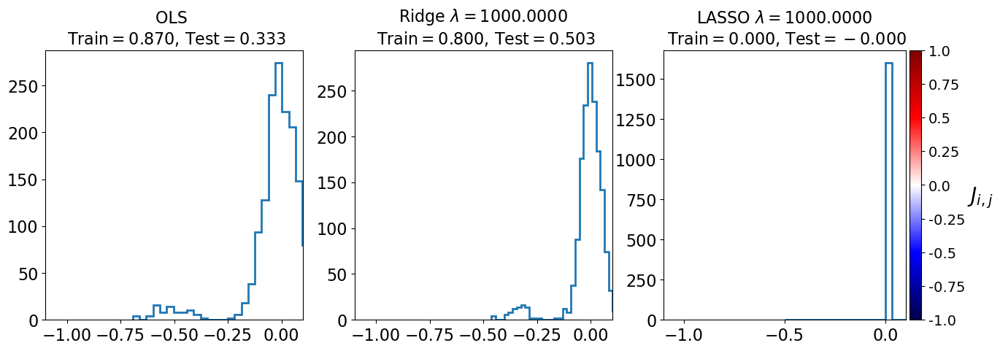

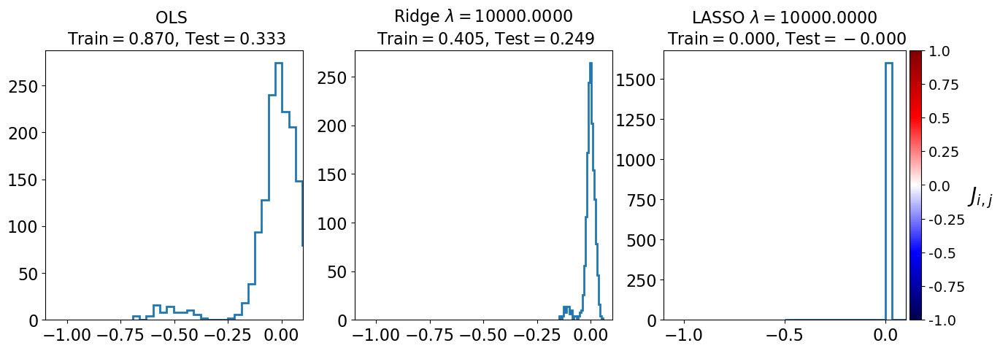

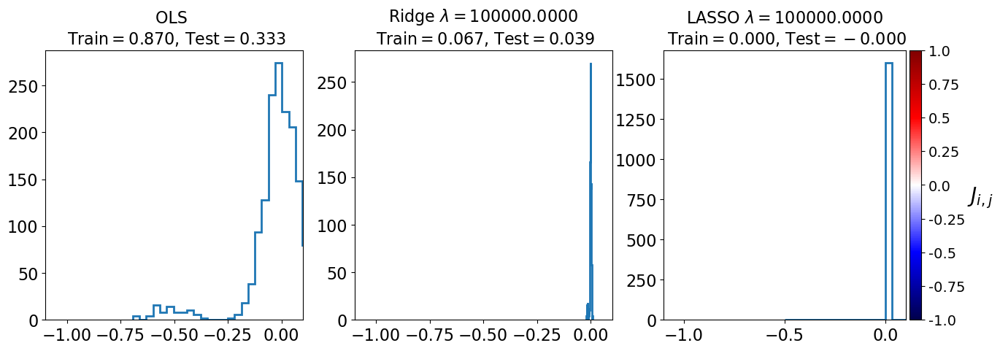

(array([1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03,
        1.e+04, 1.e+05]),
 [0.8700871969265831,
  0.8700871969265831,
  0.8700871969265831,
  0.8700871969265831,
  0.8700871969265831,
  0.8700871969265831,
  0.8700871969265831,
  0.8700871969265831,
  0.8700871969265831,
  0.8700871969265831],
 [0.3325299929404435,
  0.3325299929404435,
  0.3325299929404435,
  0.3325299929404435,
  0.3325299929404435,
  0.3325299929404435,
  0.3325299929404435,
  0.3325299929404435,
  0.3325299929404435,
  0.3325299929404435],
 [0.8700871969265794,
  0.8700871969262489,
  0.8700871968931742,
  0.870087193586771,
  0.870086864016277,
  0.8700549398030681,
  0.8676250243441798,
  0.7999487140501226,
  0.4046021663734033,
  0.06731387610057149],
 [0.33253009811473766,
  0.3325310588636611,
  0.332540652407496,
  0.33263655147043625,
  0.33359198133324985,
  0.34280223589314596,
  0.4093755221045495,
  0.5028666885497138,
  0.2486317641545982,
  0.039404742242540314],
 [0.8700867757

In [24]:
J_distibution_1D(X_train,Y_train, X_test, Y_test)

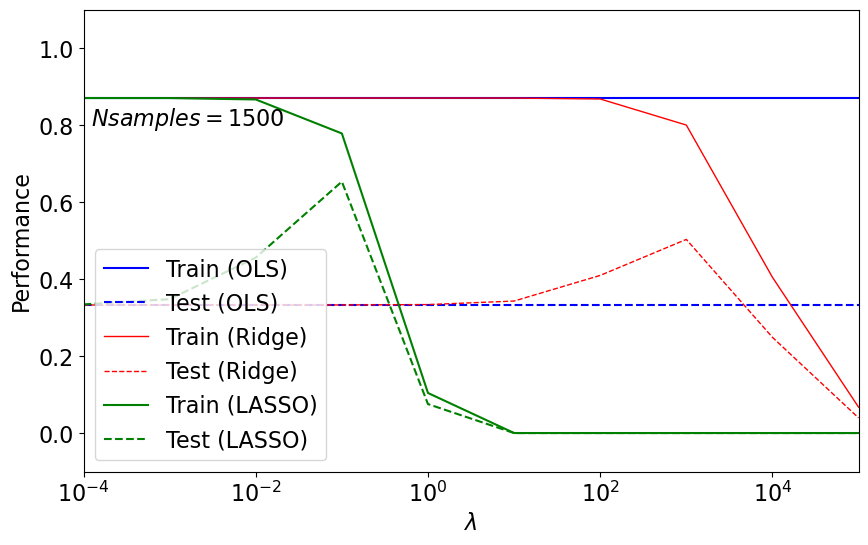

In [25]:
draw_error_vs_lambda(*values[:-3],n_samples)

In [26]:
# define number of samples
n_samples= 4000
# define train and test data sets
X_train=Data[0][:n_samples]
Y_train=Data[1][:n_samples] + np.random.normal(0,4.0,size=X_train.shape[0])
X_test=Data[0][n_samples:3*n_samples//2]
Y_test=Data[1][n_samples:3*n_samples//2] + np.random.normal(0,4.0,size=X_test.shape[0])
print("train size: ", len(X_train))
print("test size: ", len(X_test))
print("total sample size: ", len(Data[0]))

train size:  2000
test size:  4000
total sample size:  40000


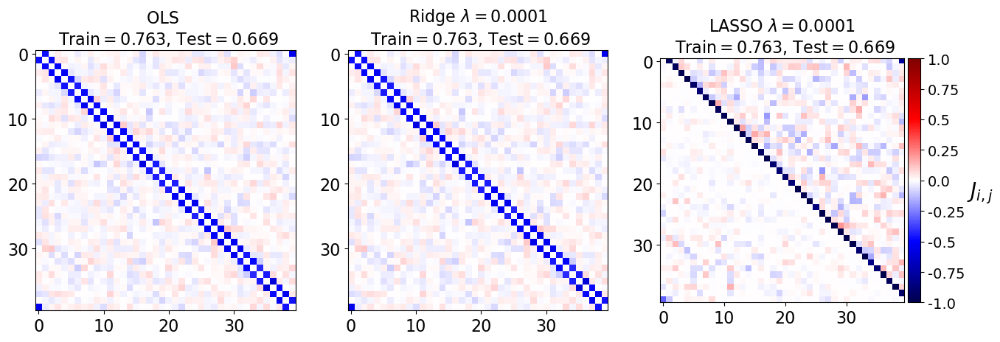

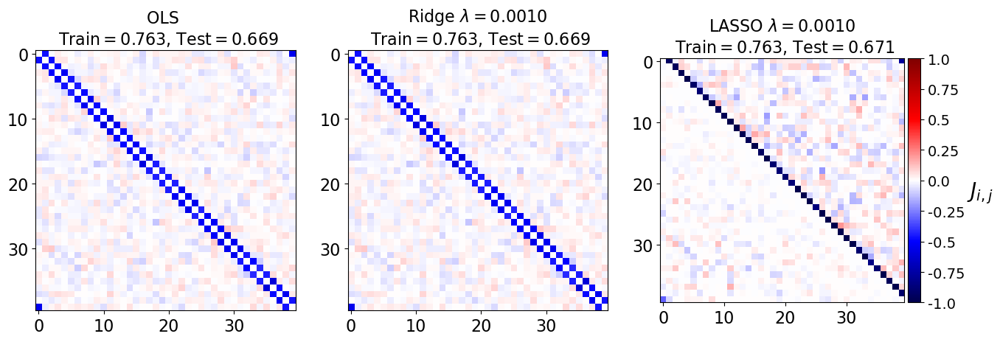

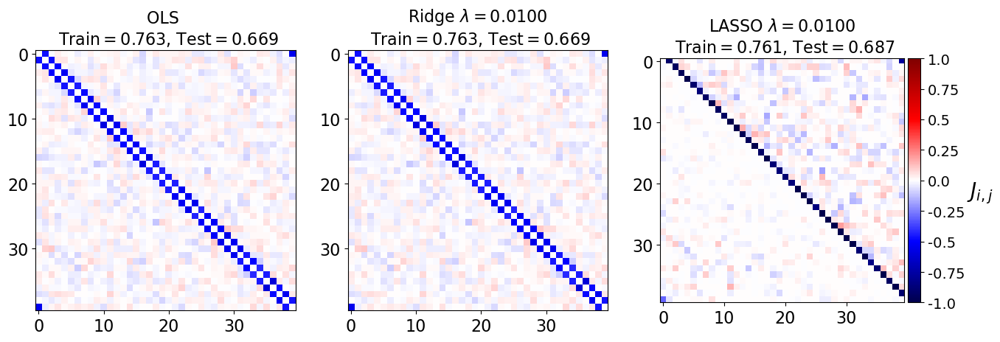

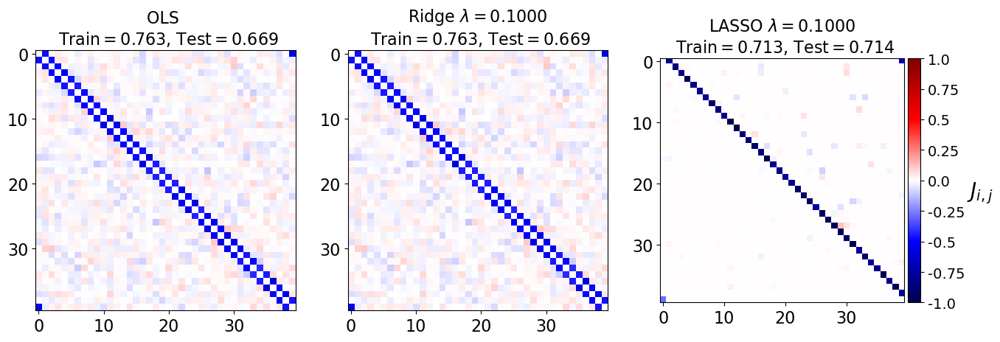

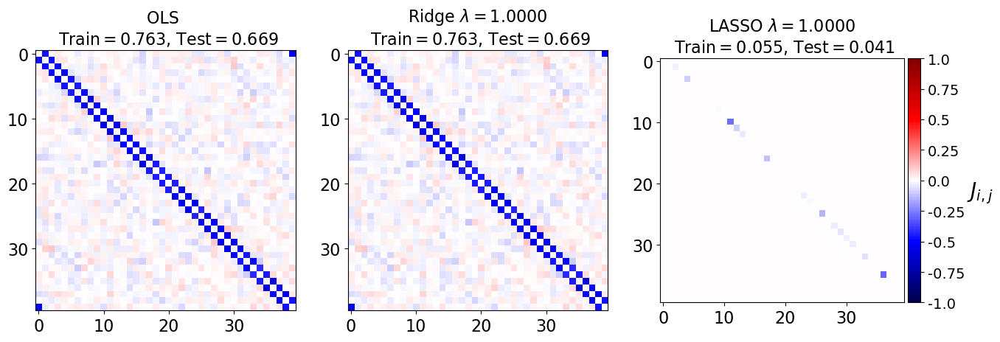

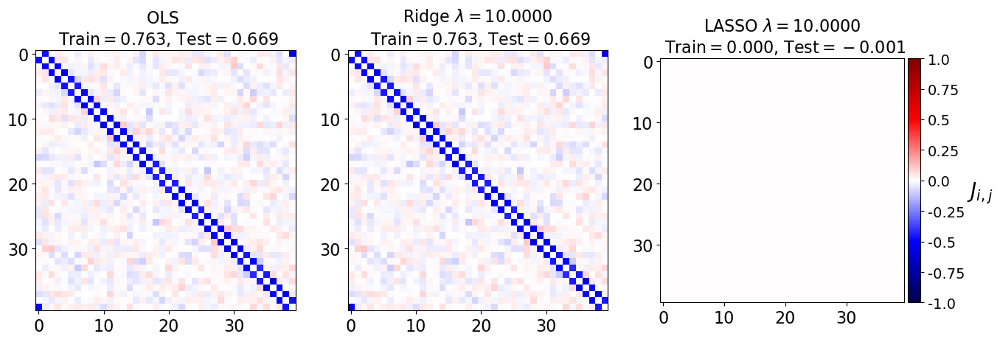

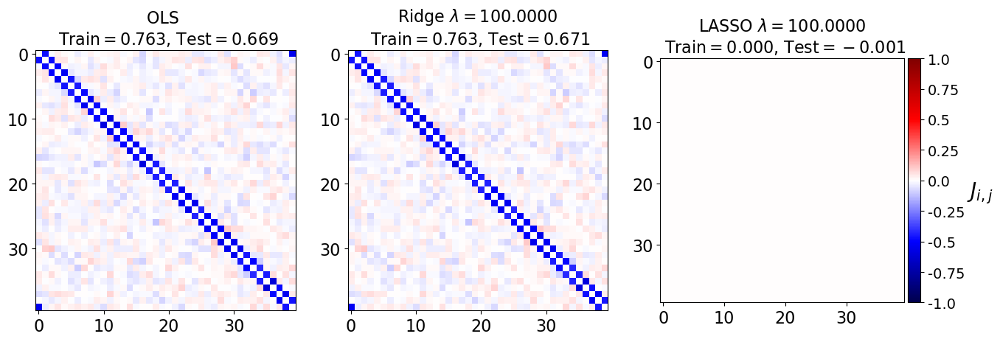

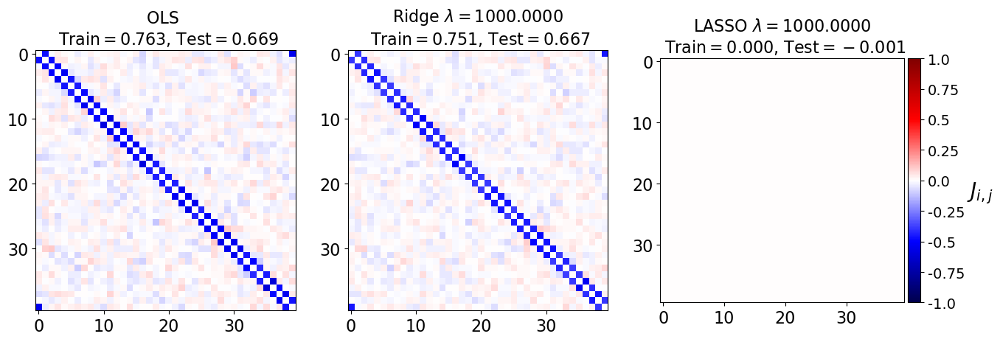

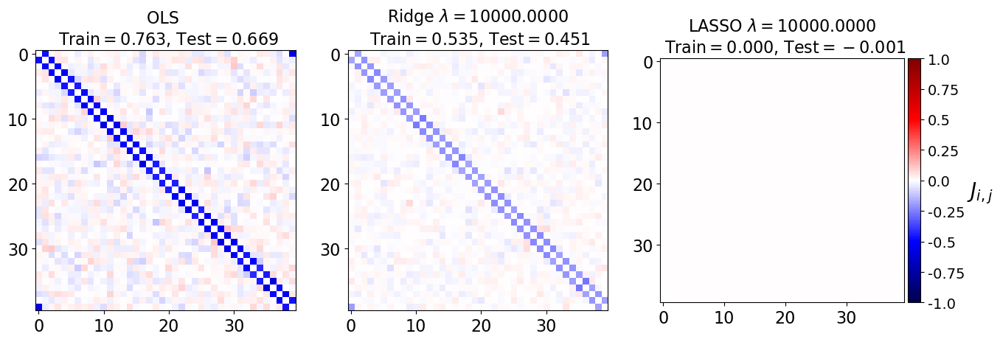

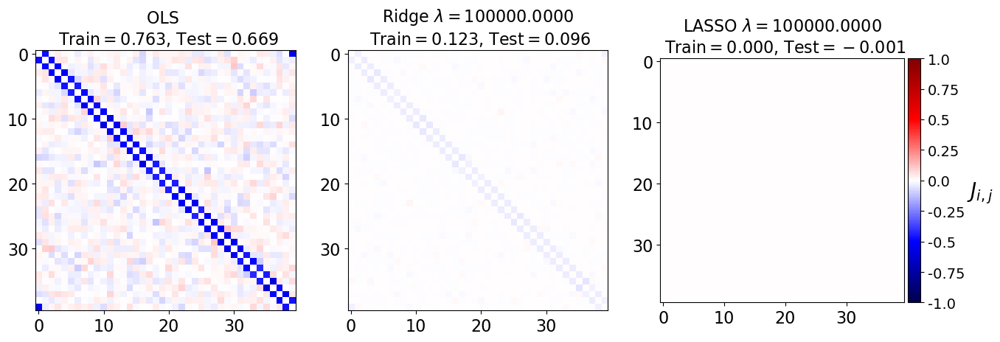

In [27]:
values = train(X_train,Y_train, X_test, Y_test)

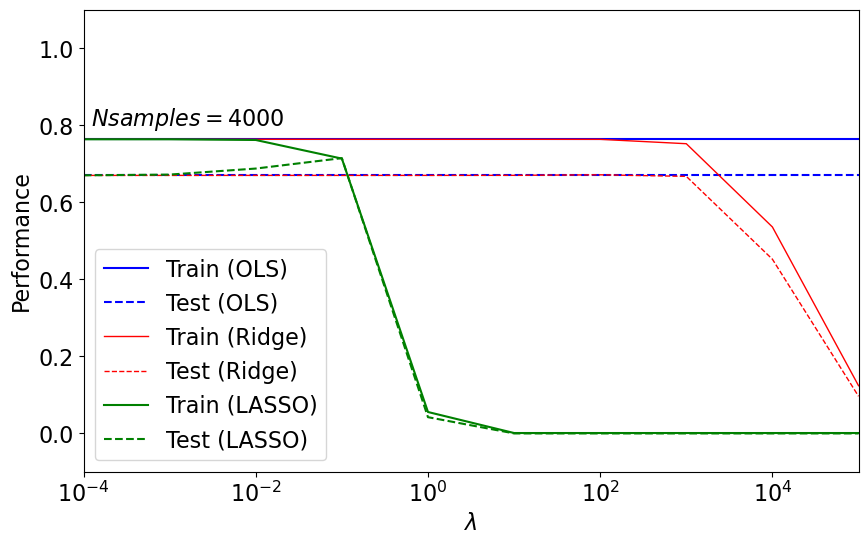

In [28]:
draw_error_vs_lambda(*values[:-3],n_samples)

In [29]:
# define number of samples
n_samples= 6000
# define train and test data sets
X_train=Data[0][:n_samples]
Y_train=Data[1][:n_samples] + np.random.normal(0,4.0,size=X_train.shape[0])
X_test=Data[0][n_samples:3*n_samples//2]
Y_test=Data[1][n_samples:3*n_samples//2] + np.random.normal(0,4.0,size=X_test.shape[0])
print("train size: ", len(X_train))
print("test size: ", len(X_test))
print("total sample size: ", len(Data[0]))

train size:  3000
test size:  6000
total sample size:  40000


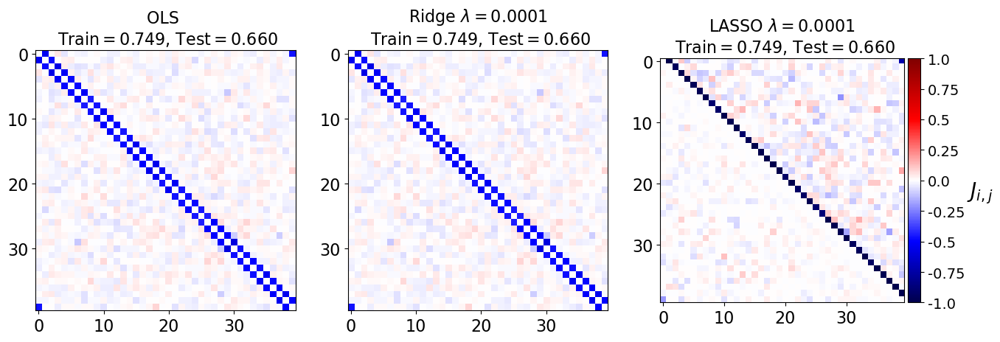

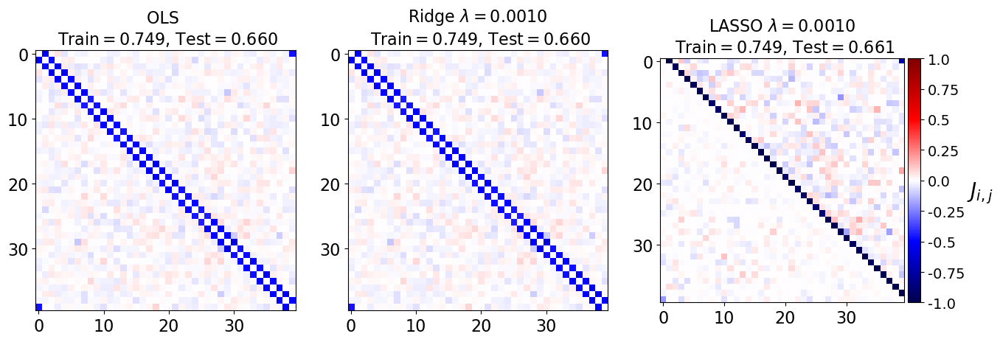

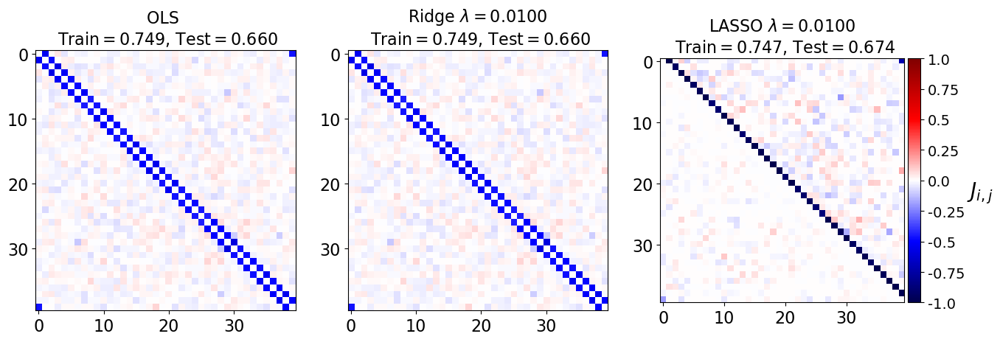

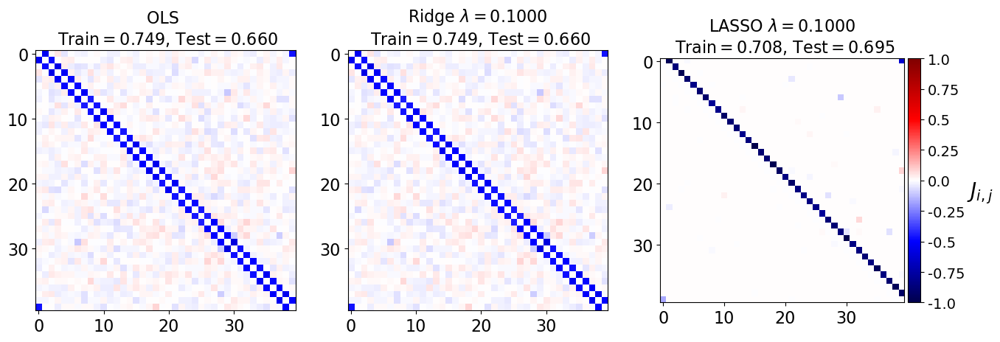

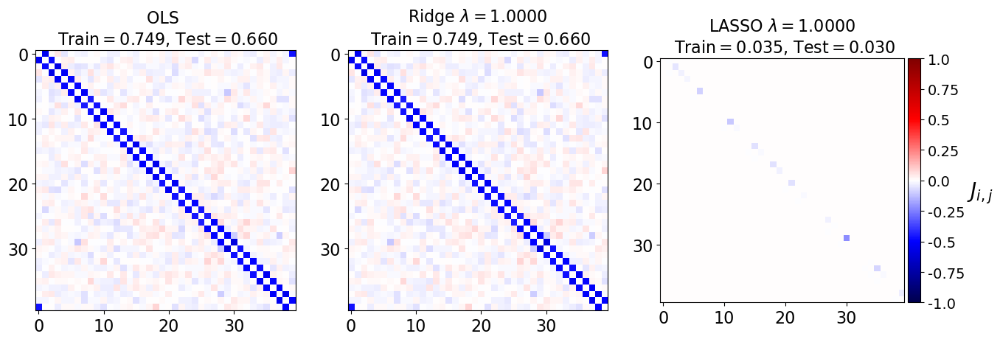

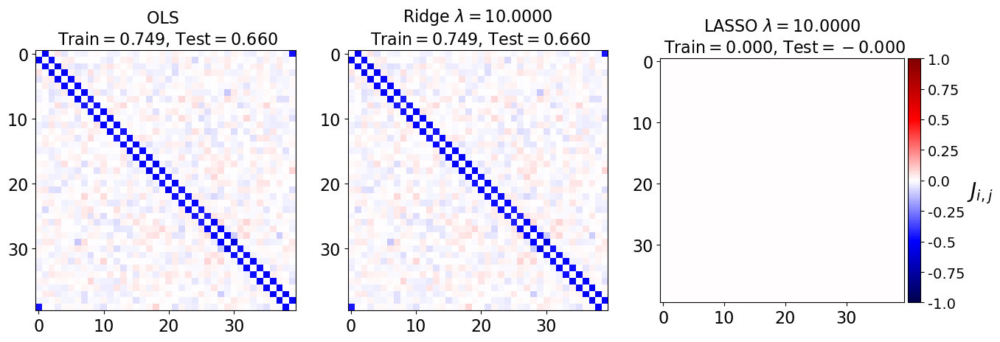

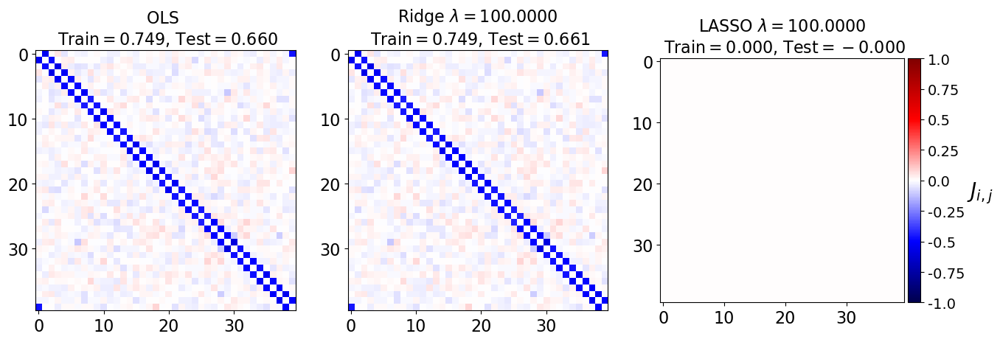

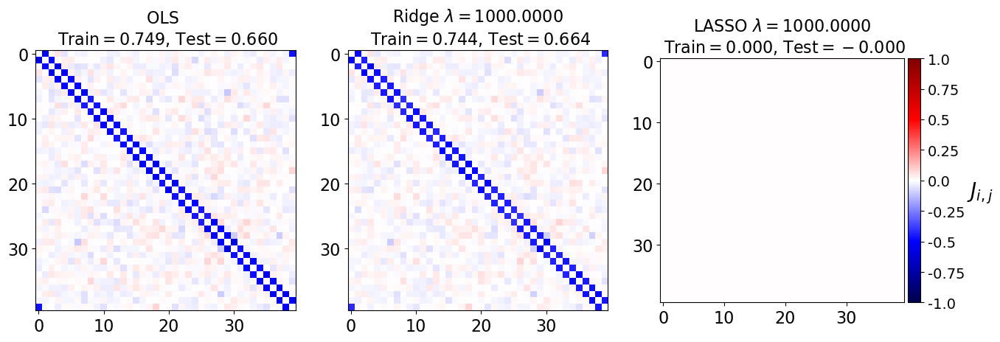

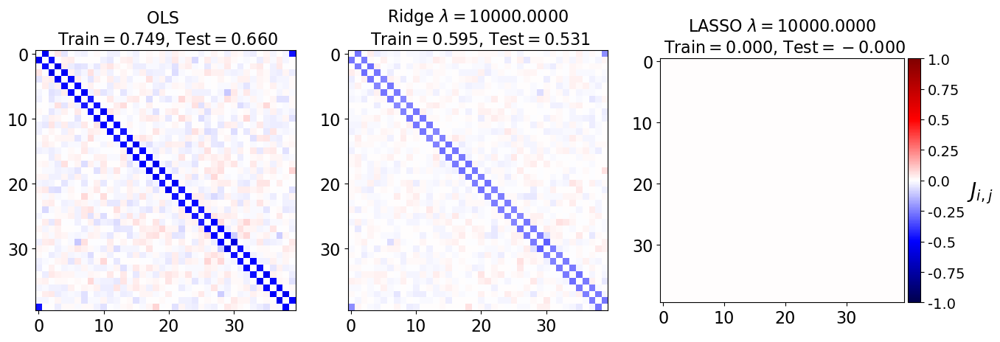

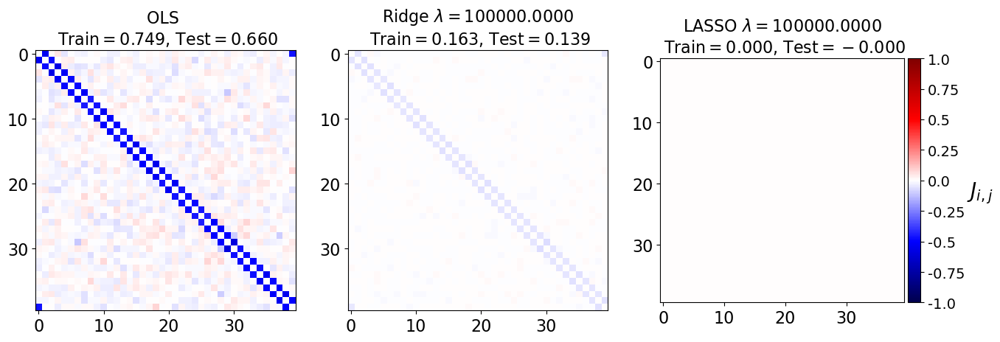

In [30]:
values = train(X_train,Y_train, X_test, Y_test)

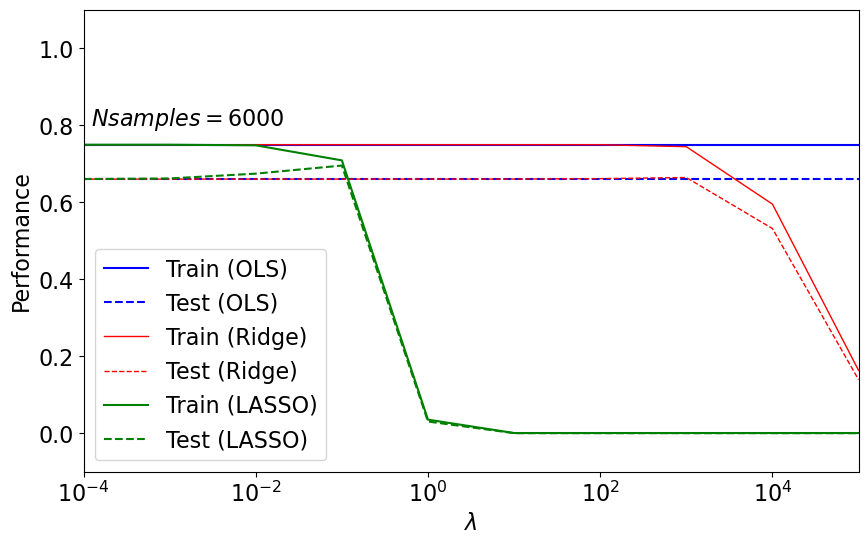

In [31]:
draw_error_vs_lambda(*values[:-3],n_samples)

In [32]:
# define number of samples
n_samples= 10000
# define train and test data sets
X_train=Data[0][:n_samples]
Y_train=Data[1][:n_samples] + np.random.normal(0,4.0,size=X_train.shape[0])
X_test=Data[0][n_samples:3*n_samples//2]
Y_test=Data[1][n_samples:3*n_samples//2] + np.random.normal(0,4.0,size=X_test.shape[0])
print("train size: ", len(X_train))
print("test size: ", len(X_test))
print("total sample size: ", len(Data[0]))

train size:  5000
test size:  10000
total sample size:  40000


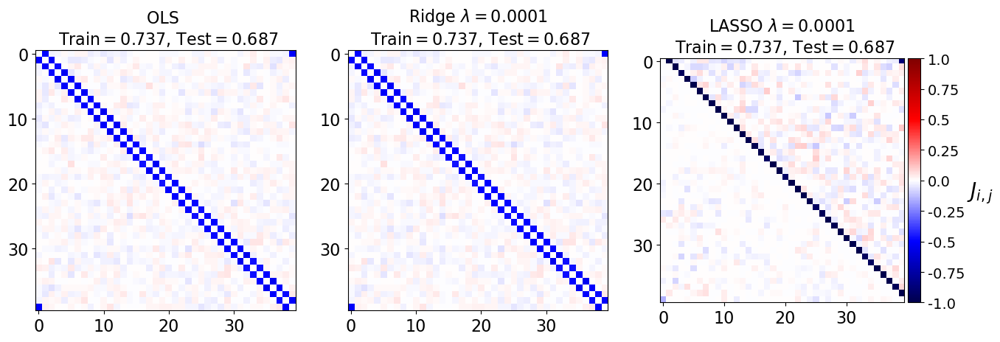

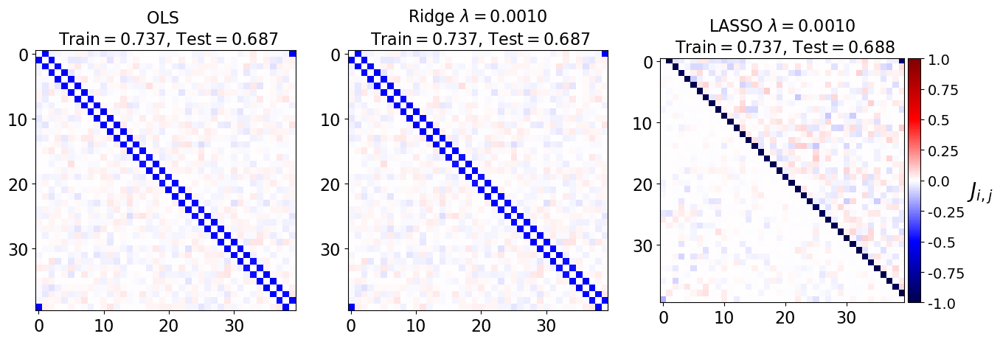

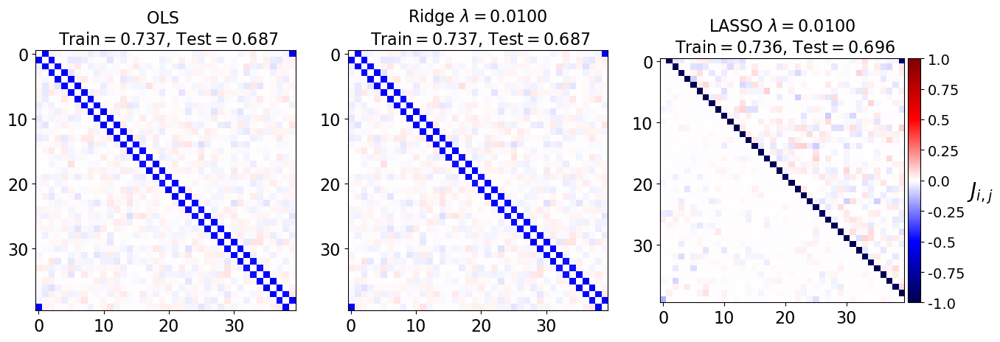

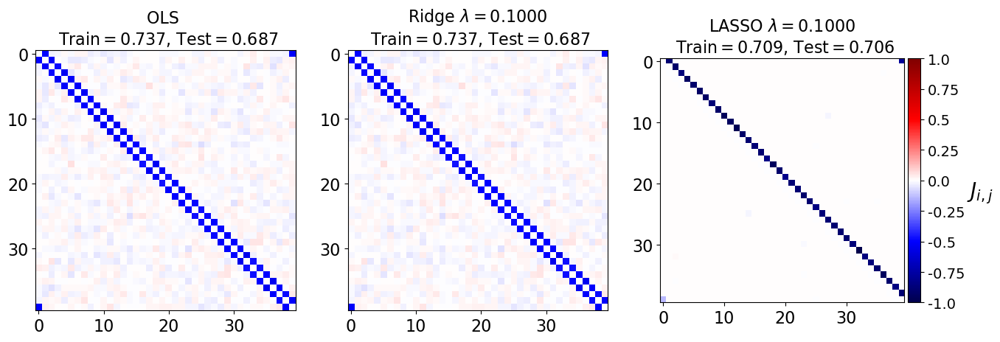

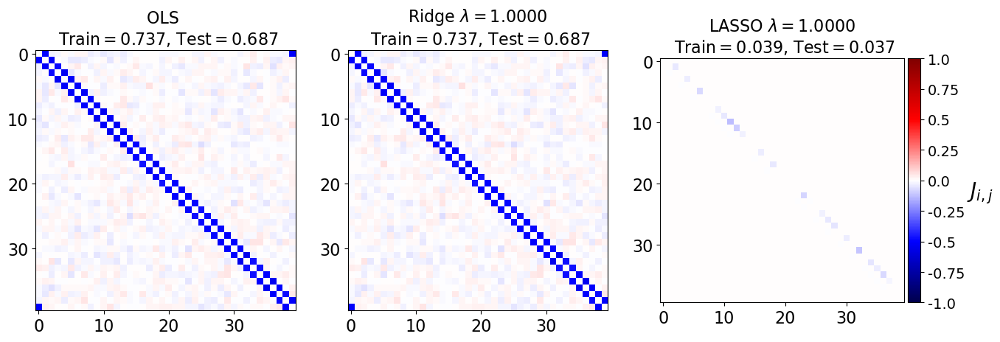

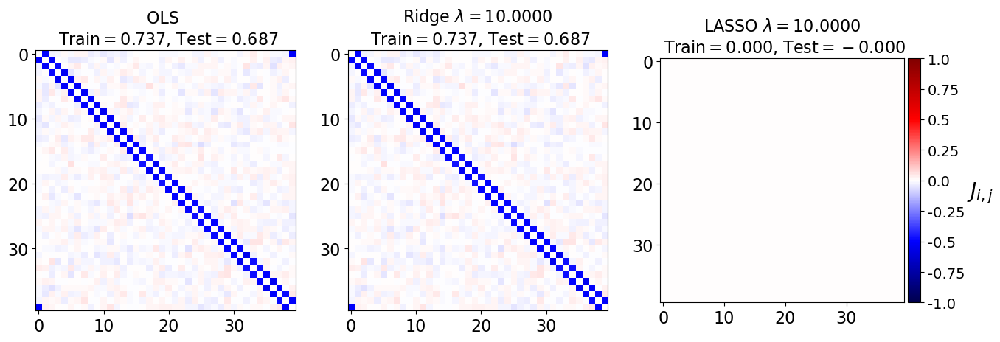

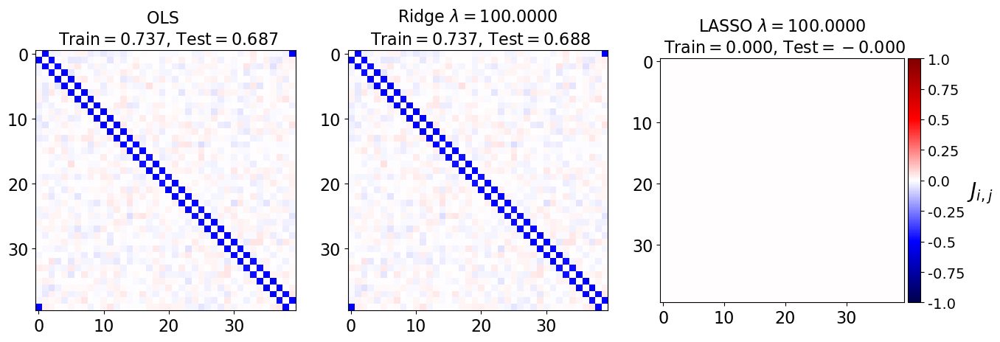

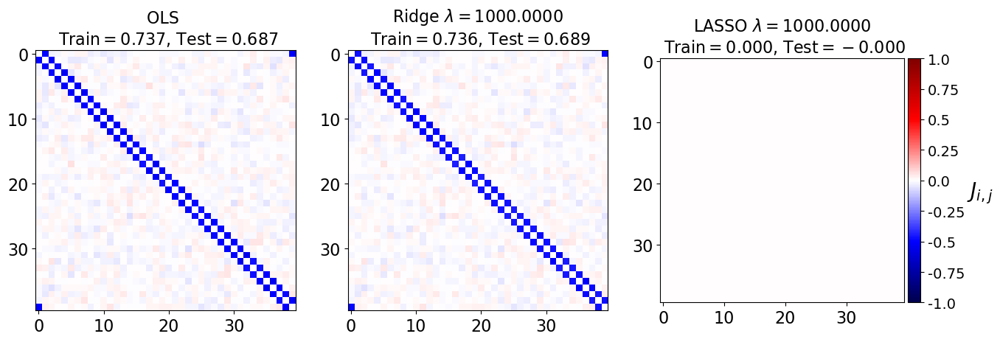

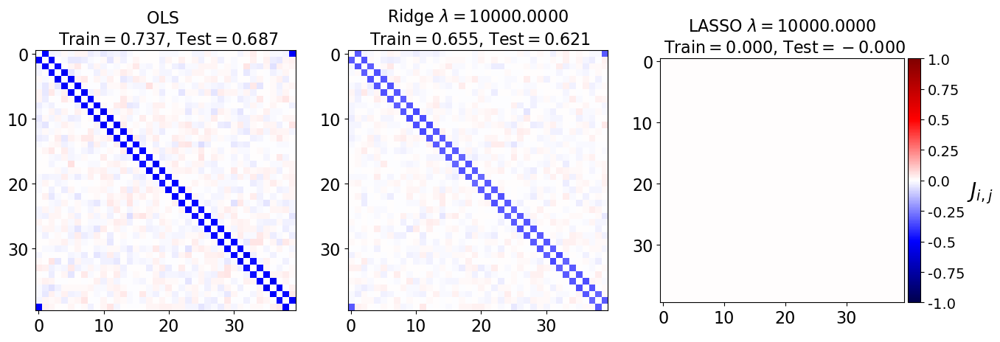

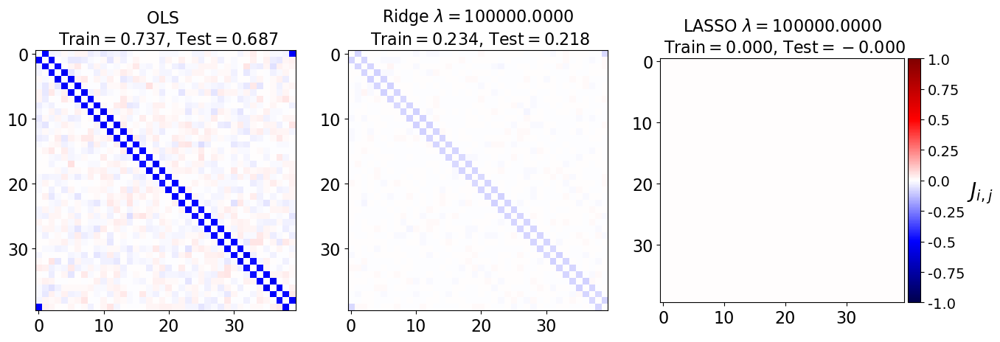

In [33]:
values = train(X_train,Y_train, X_test, Y_test)

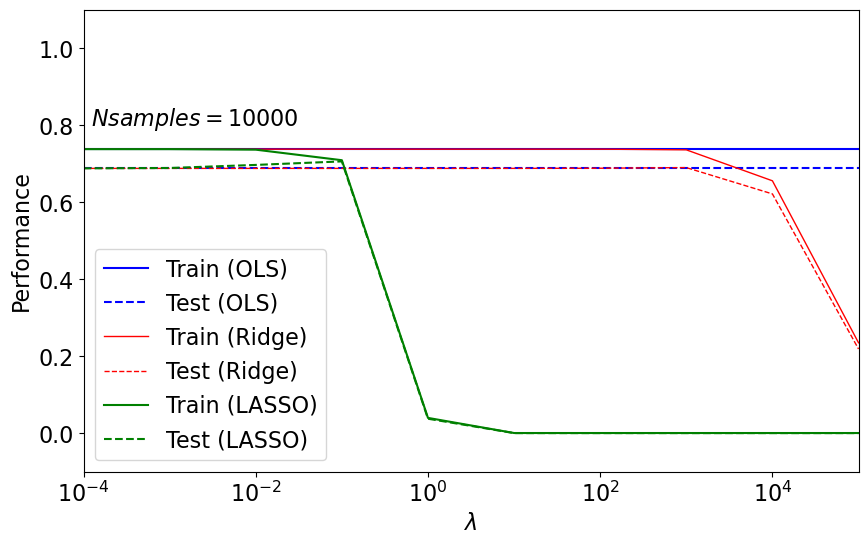

In [34]:
draw_error_vs_lambda(*values[:-3],n_samples)

- Here we can see that for $N_{samples} < 4000$ the prediction power of the model increses if we increse $N_{samples}$. At the beginning, the predictions are really bad and they start to improve as we increase $N_{samples}$. However, we can see that after $N_{samples} = 4000$  there is not much improvment. The prediction power of the model is stuck at some point.
- This can be understood if we see the error as $$Error = Bias^2 + variance + noise$$ We can reduce the variance if we increase $N_{samples}$. Also, above we show that the Bias is small. But we can not get rid of the noise increasing $N_{samples} = 4000$, so we reach a limit in how good our model can be. 

Now assuming it lies within the class of one-body Hamiltonians, i.e. the genrated datasets is the same as above with the 1D Ising Model, but we now learn from the data with theory described by the following Hamiltonian. i.e each Ising spin is exposed in an unknown field with strength $h_j$:
$$H_\mathrm{model}[\boldsymbol{S}^i] = \sum_{j=1}^L h_jS_{j}$$
Use this model for the regression. How well can you explain the data? How well does the model generalize (make a test sample and predict the system's energy)? Study these problems by playing with the size of the data set. Try out all three regression models and determine which one does the best. What is the relationship to Mean-Field Theory of this model(optional)?

- First we have to redifine the variable "states", because now we want just the spins $S_j$ to be the features, we will dont use the terms $S_iS_j$ now

In [108]:
### define Ising model aprams
# system size
L=40

# create 10000 random Ising states
states=np.random.choice([-1, 1], size=(40000,L))
# print(states)
def ising_energies(states):
    """
    This function calculates the energies of the states in the nn Ising Hamiltonian
    """
    L = states.shape[1]
    J = np.zeros((L, L),)
    # print("L: ", L)
    for i in range(L):
        J[i,(i+1)%L]=-1.0 # interaction between nearest-neighbors

    # compute energies
    # print("J: ", J)
    E = np.einsum('...i,ij,...j->...',states,J,states)

    return E
# calculate Ising energies
energies=ising_energies(states)

In [109]:
Data=[states,energies]
print(Data)

[array([[ 1,  1, -1, ..., -1, -1, -1],
       [-1, -1, -1, ..., -1,  1,  1],
       [-1,  1,  1, ..., -1, -1,  1],
       ...,
       [ 1,  1,  1, ..., -1,  1,  1],
       [-1,  1,  1, ...,  1, -1, -1],
       [-1, -1, -1, ...,  1, -1,  1]]), array([  4.,   4.,   0., ..., -12.,   0.,   8.])]


In [110]:
# define number of samples
n_samples=50
# define train and test data sets
X_train=Data[0][:n_samples]
Y_train=Data[1][:n_samples]  #+ np.random.normal(0,4.0,size=X_train.shape[0])
X_test=Data[0][n_samples:3*n_samples//2]
Y_test=Data[1][n_samples:3*n_samples//2] #+ np.random.normal(0,4.0,size=X_test.shape[0])
print("train size: ", len(X_train))
print("test size: ", len(X_test))
print("total sample size: ", len(Data[0]))

train size:  50
test size:  25
total sample size:  40000


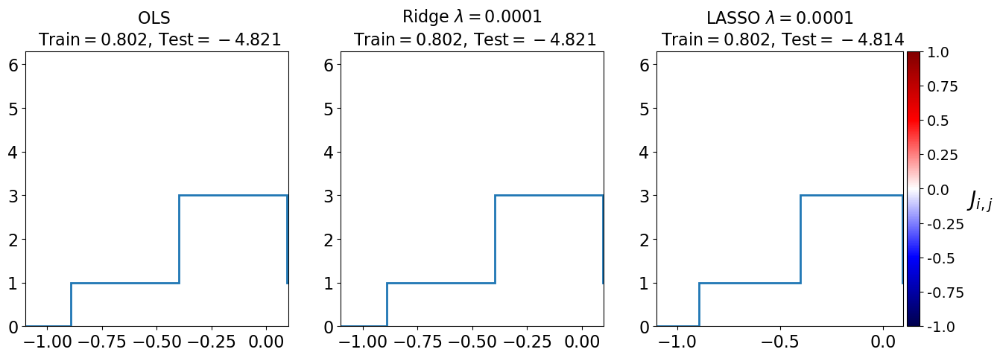

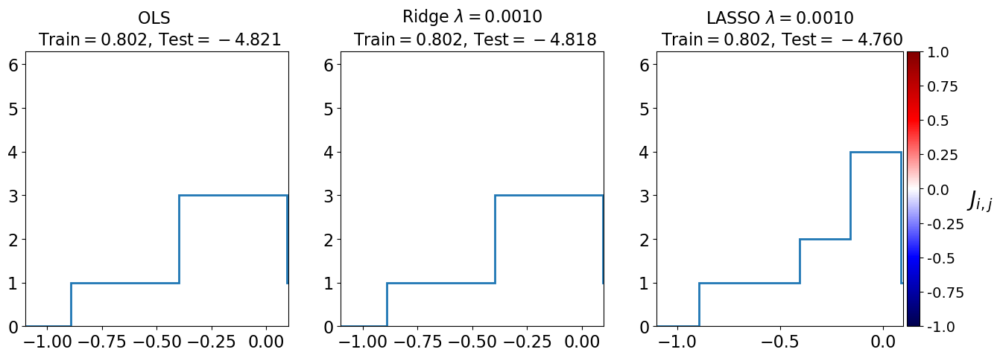

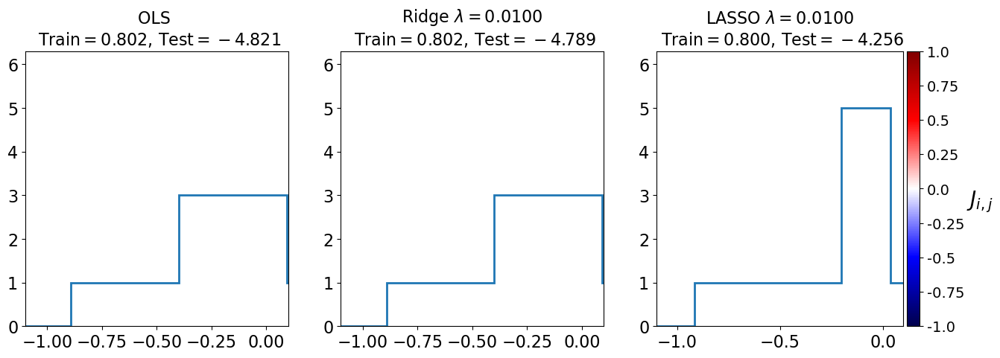

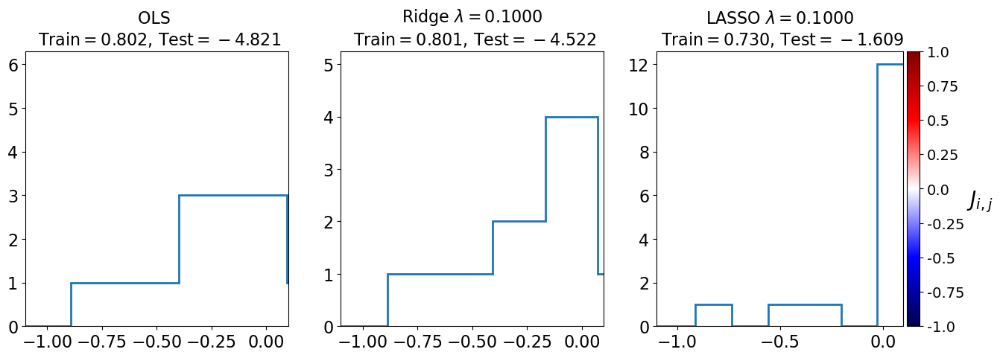

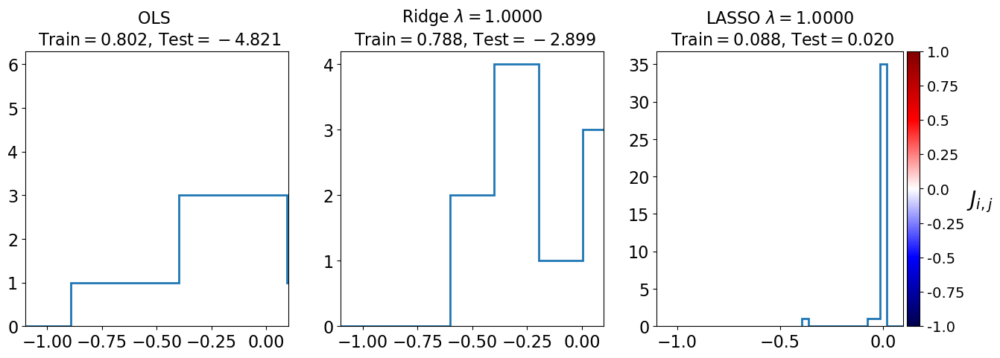

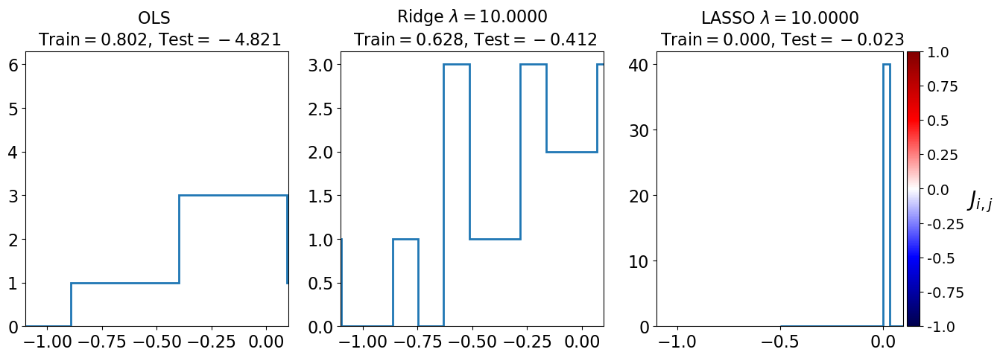

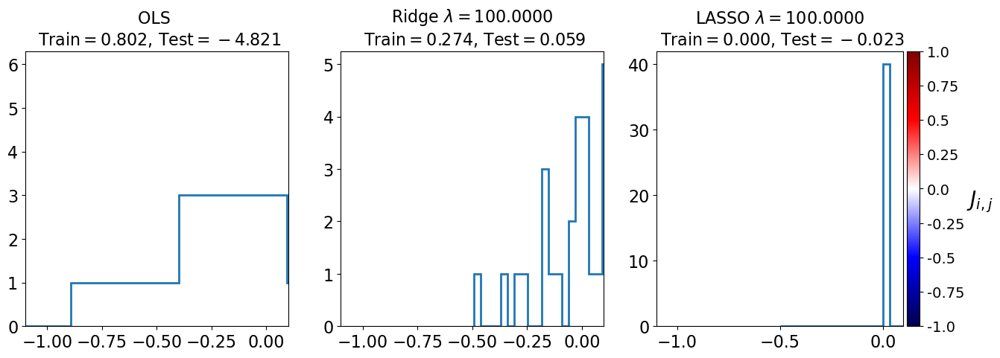

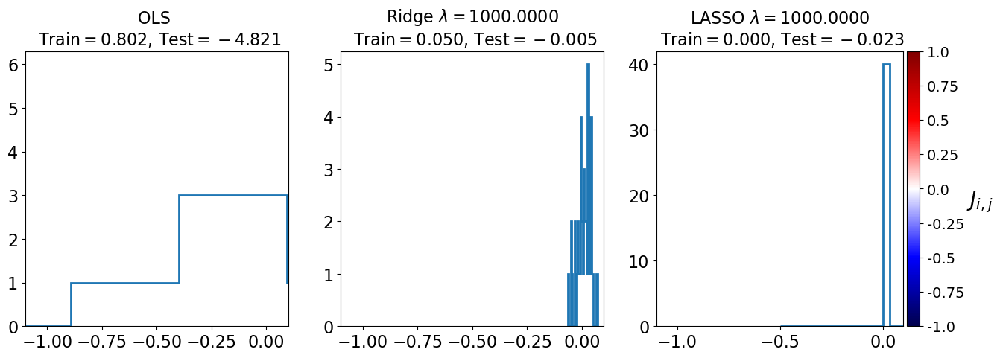

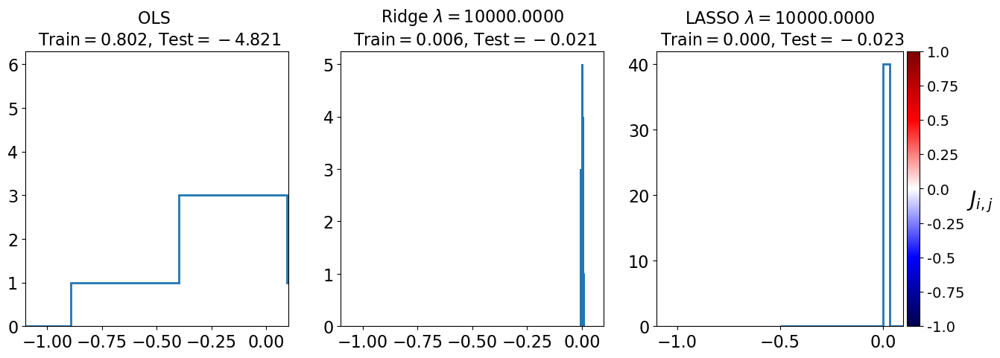

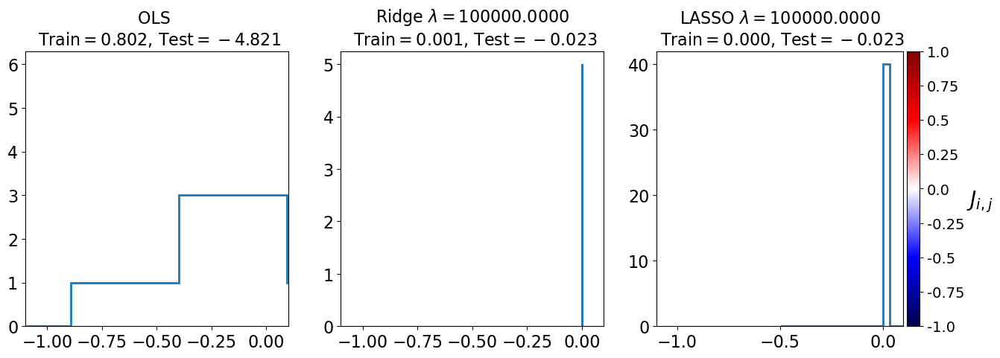

In [111]:
values = J_distibution_1D(X_train,Y_train, X_test, Y_test)

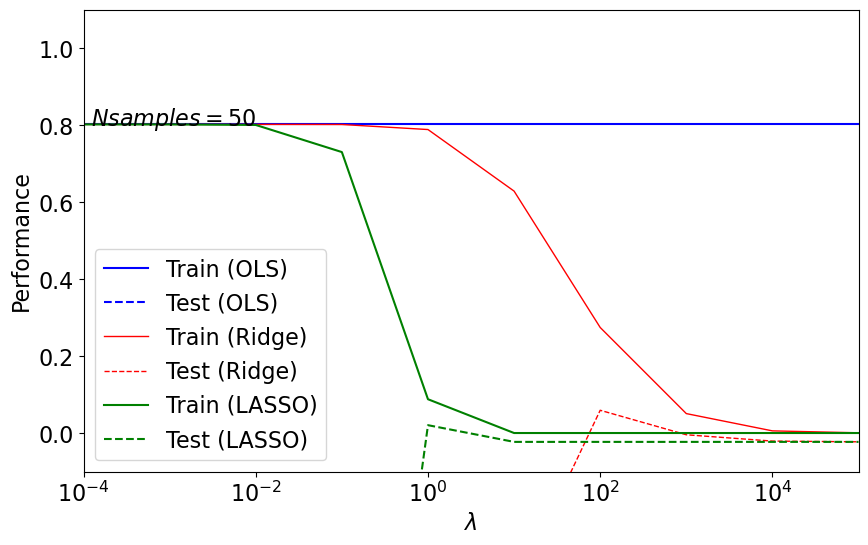

In [112]:
draw_error_vs_lambda(*values[:-3],n_samples)

In [113]:
# define number of samples
n_samples=500
# define train and test data sets
X_train=Data[0][:n_samples]
Y_train=Data[1][:n_samples]  #+ np.random.normal(0,4.0,size=X_train.shape[0])
X_test=Data[0][n_samples:3*n_samples//2]
Y_test=Data[1][n_samples:3*n_samples//2] #+ np.random.normal(0,4.0,size=X_test.shape[0])

print("train size: ", len(X_train))
print("test size: ", len(X_test))
print("total sample size: ", len(Data[0]))

train size:  500
test size:  250
total sample size:  40000


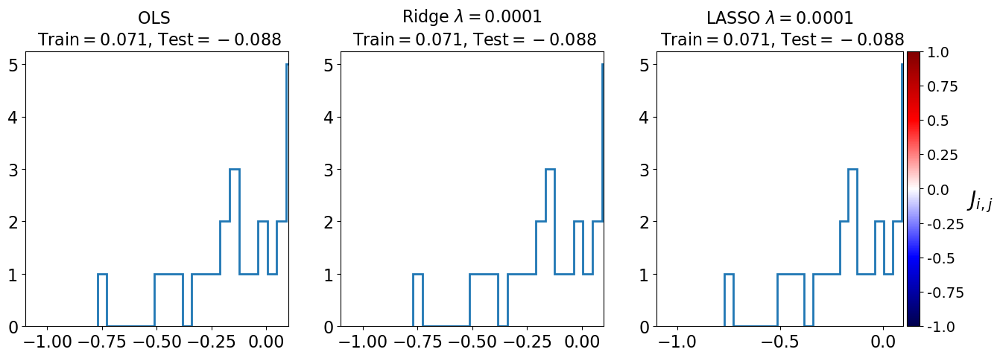

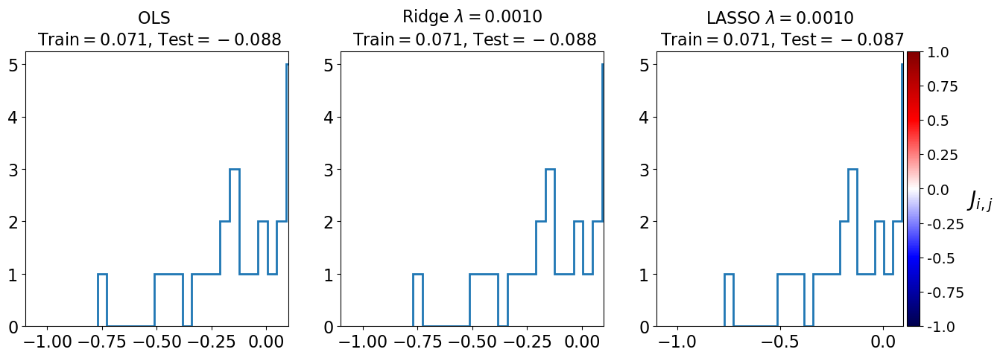

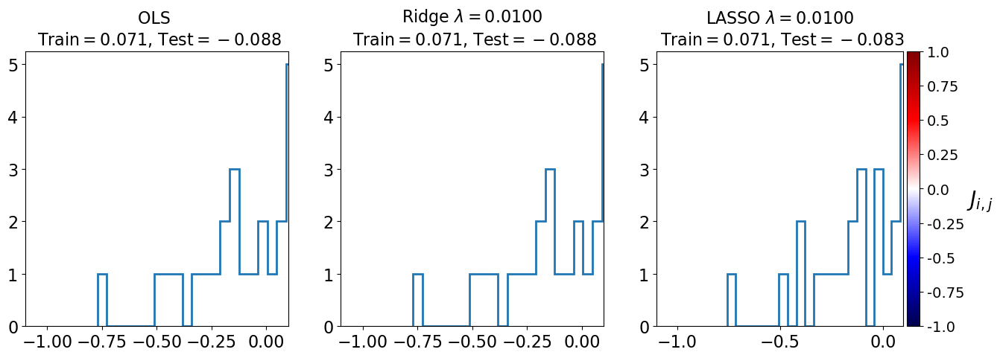

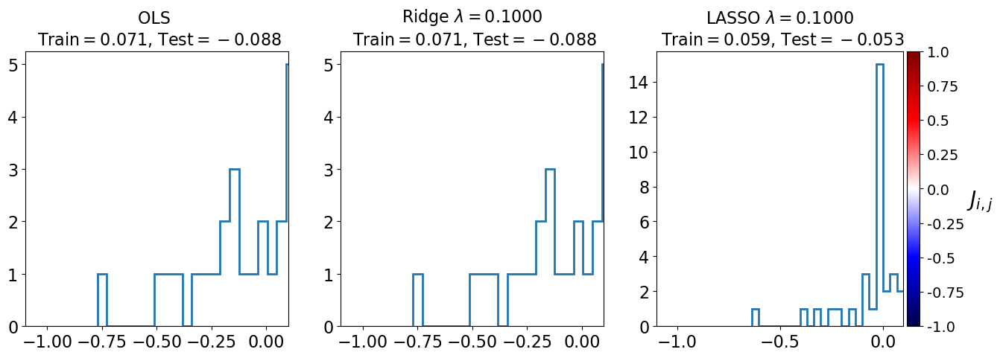

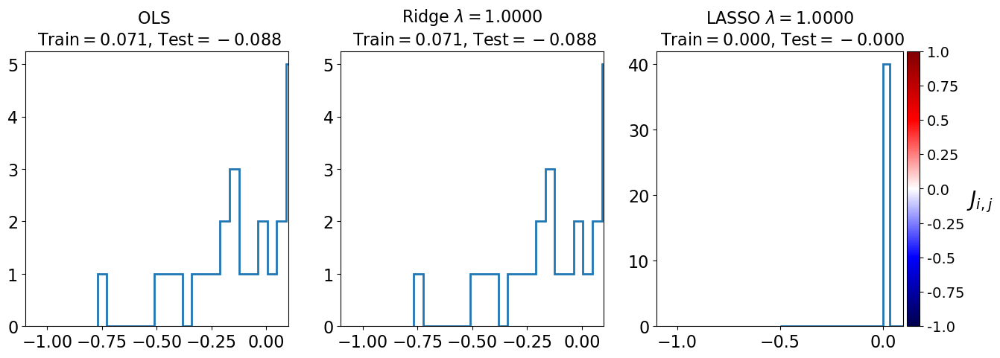

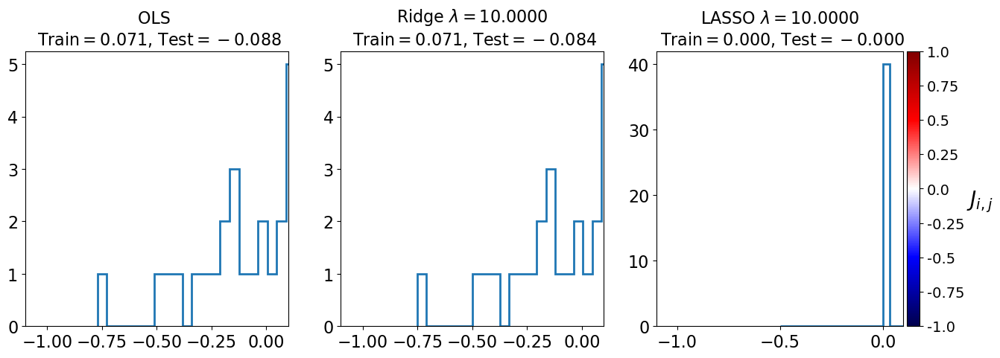

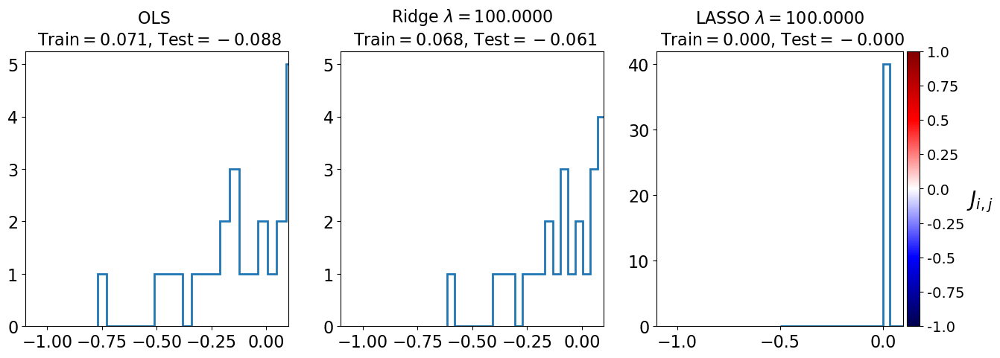

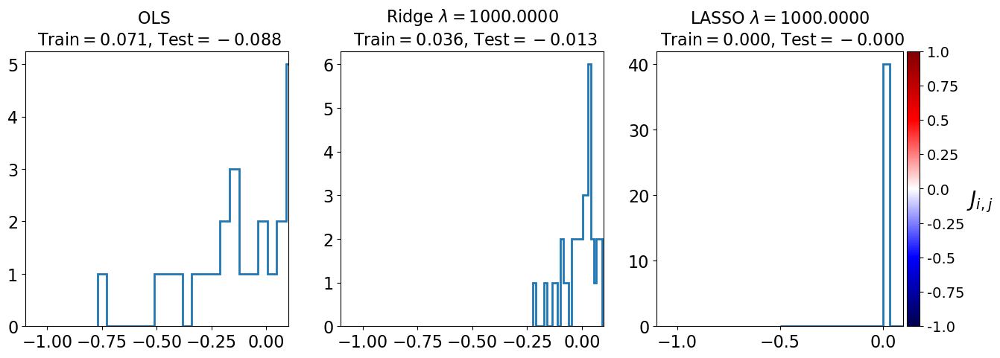

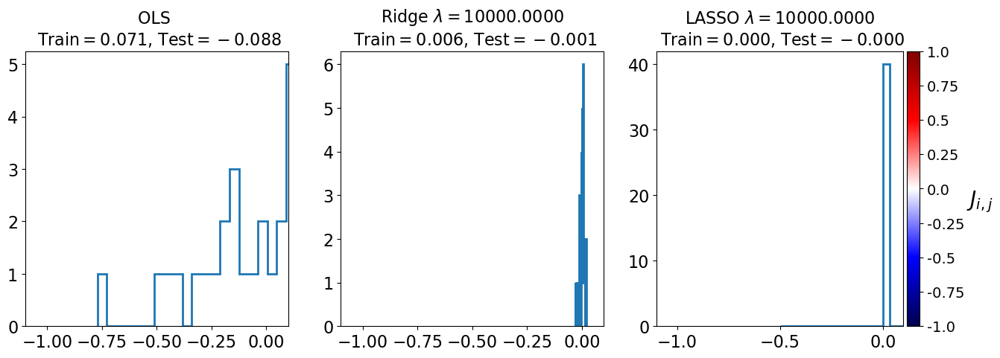

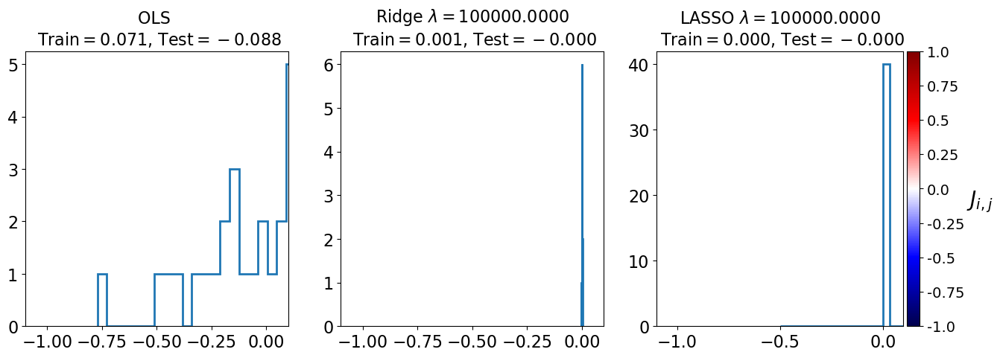

In [114]:
values = J_distibution_1D(X_train,Y_train, X_test, Y_test)

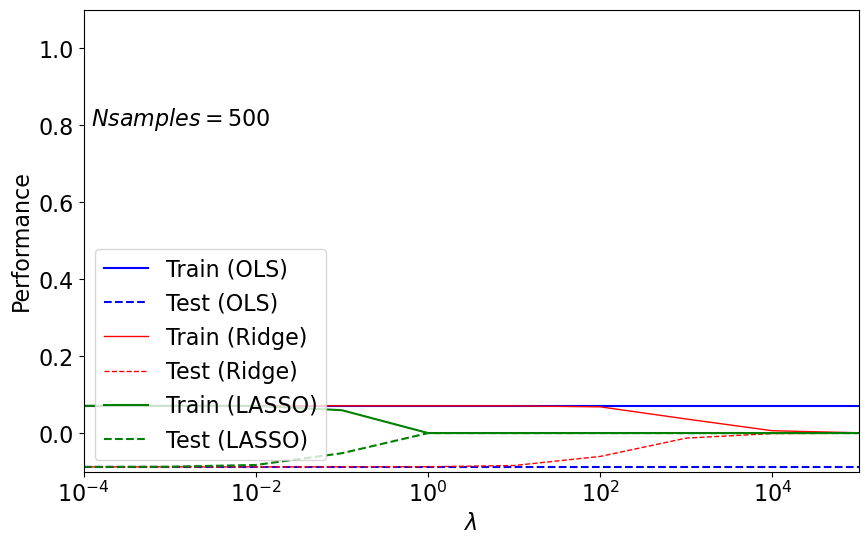

In [117]:
draw_error_vs_lambda(*values[:-3],n_samples)

In [118]:
n_samples=5000
# define train and test data sets
X_train=Data[0][:n_samples]
Y_train=Data[1][:n_samples]  #+ np.random.normal(0,4.0,size=X_train.shape[0])
X_test=Data[0][n_samples:3*n_samples//2]
Y_test=Data[1][n_samples:3*n_samples//2] #+ np.random.normal(0,4.0,size=X_test.shape[0])

print("train size: ", len(X_train))
print("test size: ", len(X_test))
print("total sample size: ", len(Data[0]))

train size:  5000
test size:  2500
total sample size:  40000


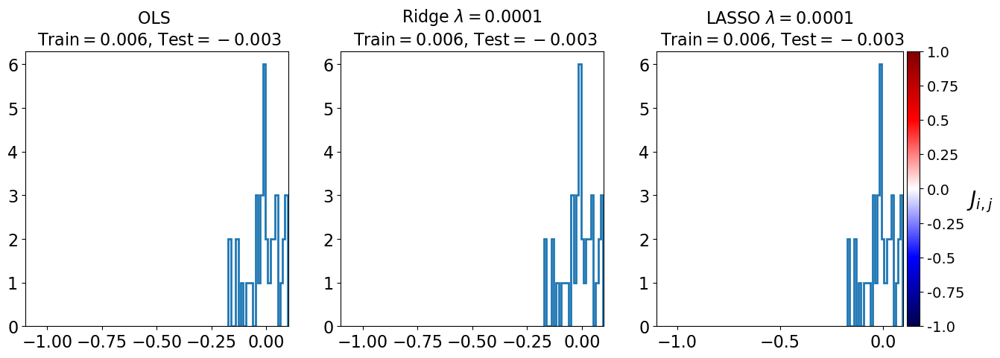

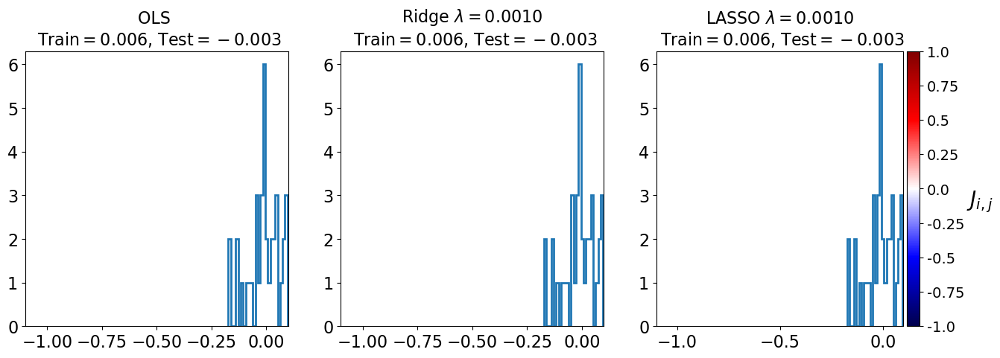

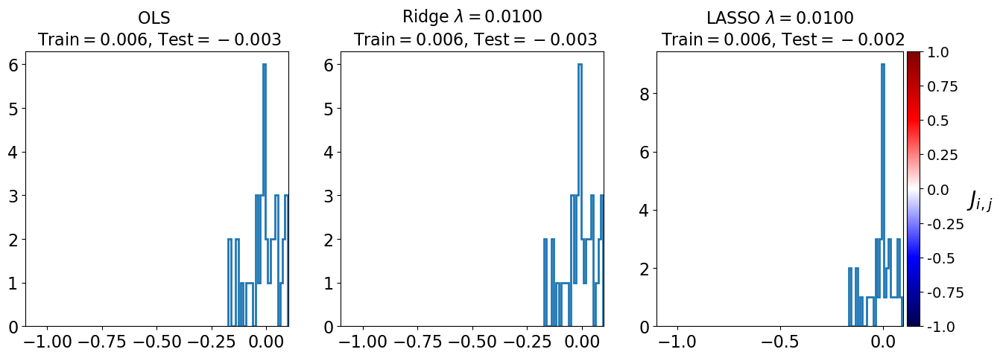

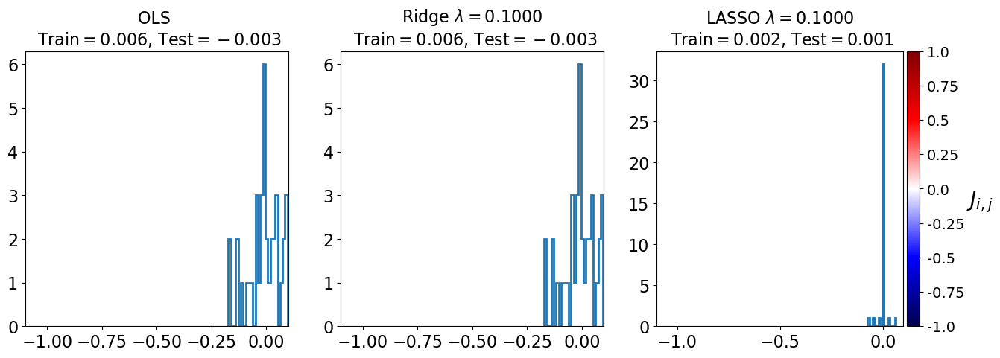

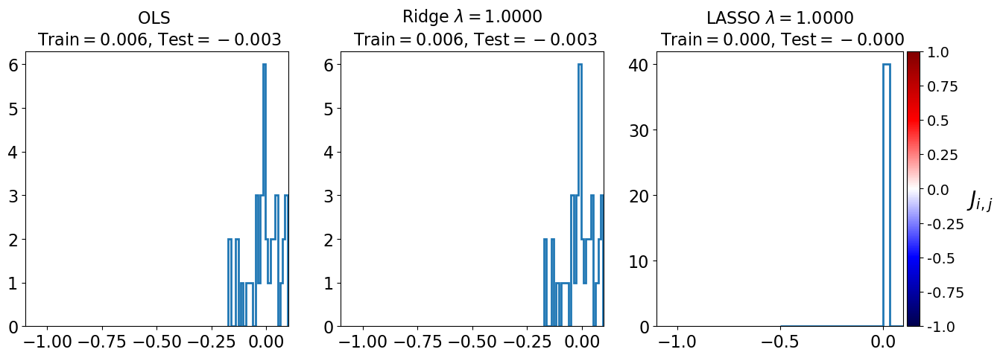

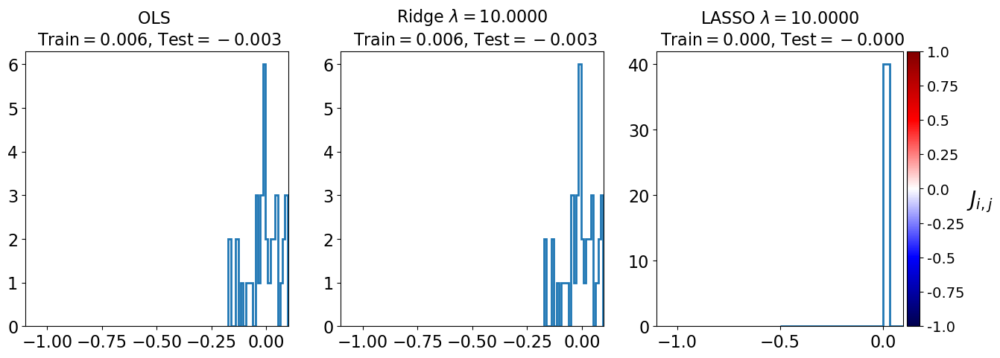

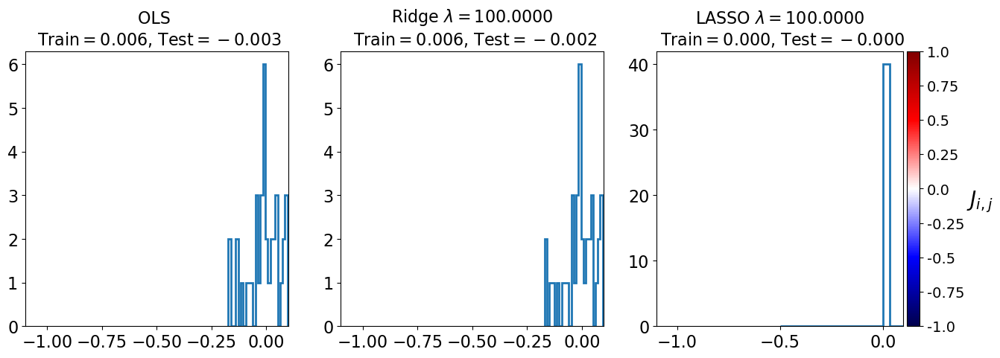

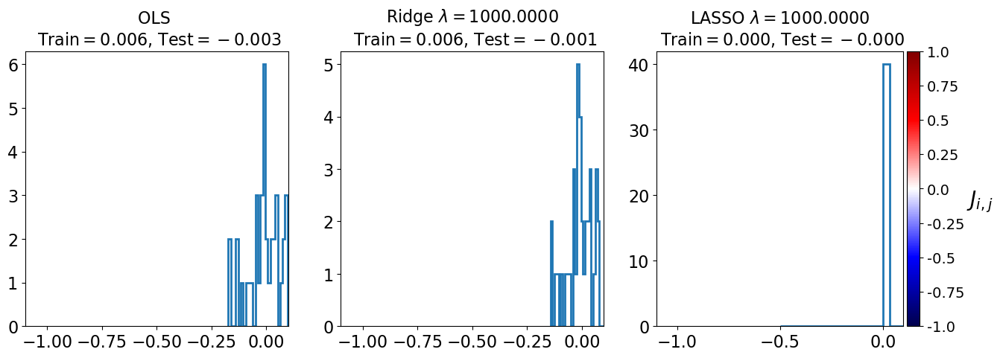

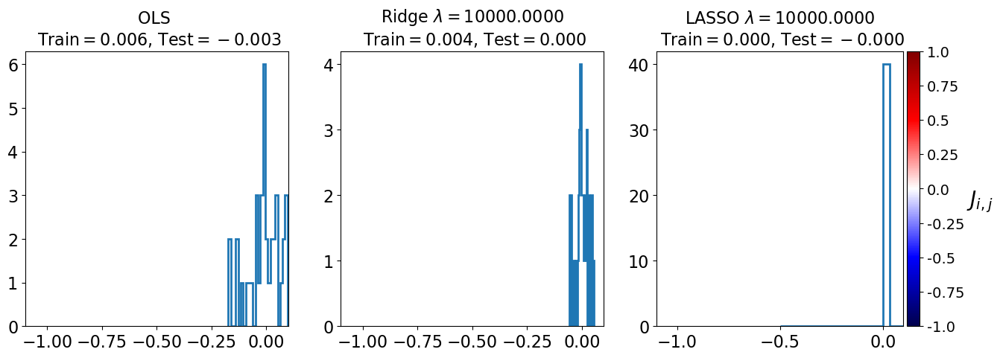

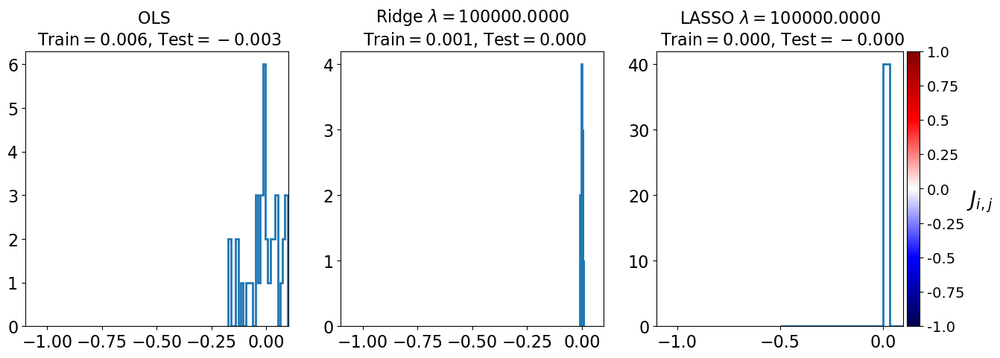

In [119]:
values = J_distibution_1D(X_train,Y_train, X_test, Y_test)

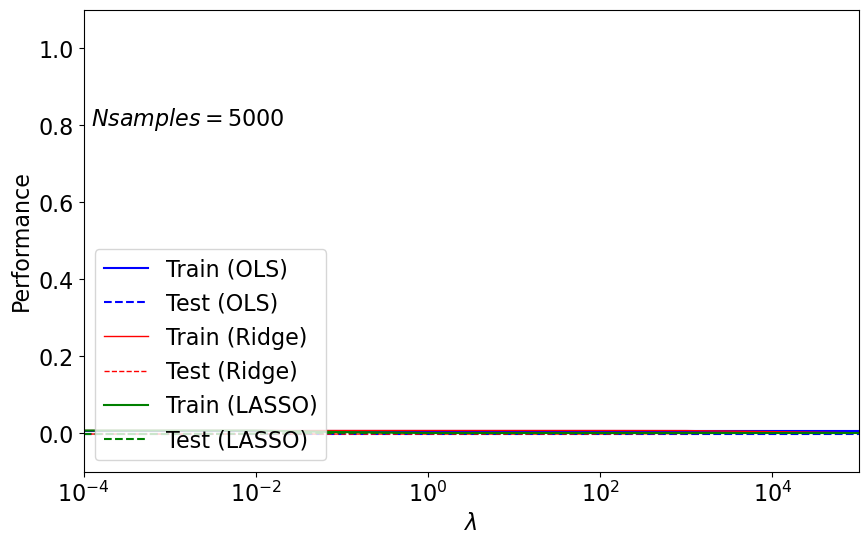

In [120]:
draw_error_vs_lambda(*values[:-3],n_samples)

- We can see that none of the models can predict the data, and as we increase the $N_{sample}$, the coefficient $R^2$ approaches zero, which means that our model is equally effective as guessing the mean. This can be related to the mean-field theory because there $h_j$ can be understood as $J_ij\langle S_j\rangle$. I ourcase the spins are uncorrelated and randomly chosen so $\langle S_j\rangle = 0 \Rightarrow h_j = 0$(This can be seen in the histograms.). Then, if $h_j$ is zero, the energy is also zero, which means that we are predicting the mean. So the interpretacion match our results of $R^2 = 0$ 